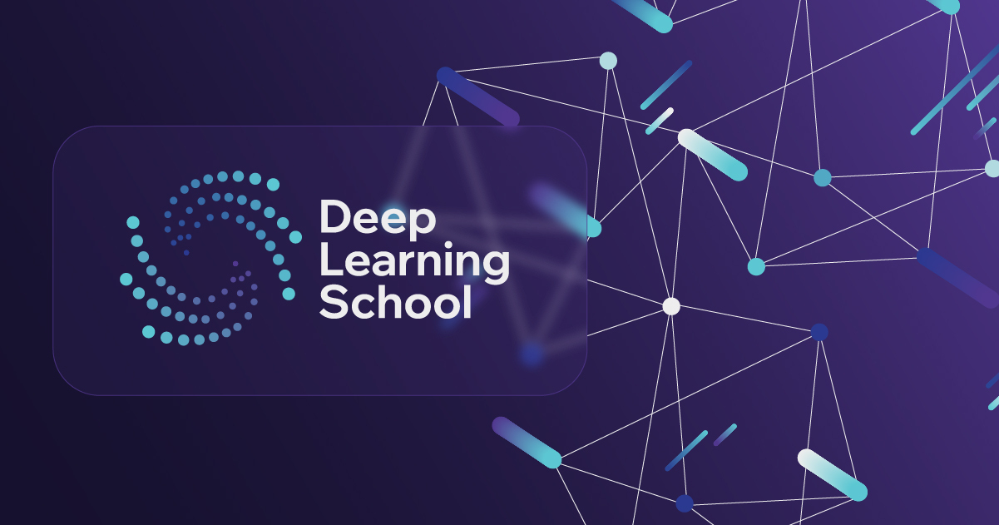


# Домашнее задание "Варианционные автоэнкодеры"

В этом домашнем задании вам предстоит реализовать несколько версий автоэнкодера для работы с изображениями.

Вы научитесь добавлять улыбку на фотографии людей, изменяя их исходное выражение лица с помощью обученной модели. А также, обучите ваш автоэнкодер генерировать изображения рукописных цифр.

# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (1 балл)


Перед тем, как начинать работу с моделями нужно подготовить данные.

In [1]:
import numpy as np
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
import matplotlib.pyplot as plt

import os
import pandas as pd
import skimage.io
from skimage.transform import resize

import imageio
from PIL import Image
import kagglehub

device = 'cuda' if torch.cuda.is_available() else 'cpu'

%matplotlib inline

В этом задании вам предстоить работать с датасетом [LFW (Labeled Faces in the Wild)](https://datasets.activeloop.ai/docs/ml/datasets/lfw-dataset/#:~:text=What%20is%20LFW%20Dataset%3F,commercial%20algorithms%20prior%20to%20release).

In [130]:
# Скачиваем картинки
images_path = kagglehub.dataset_download("jessicali9530/lfw-dataset")
print("Path to dataset files:", images_path)

Path to dataset files: /kaggle/input/datasets/jessicali9530/lfw-dataset


In [131]:
# Скачиваем атрибуты
attrs_path = kagglehub.dataset_download("averkij/lfw-attributes")
print("Path to dataset files:", attrs_path)

Path to dataset files: /kaggle/input/datasets/averkij/lfw-attributes


In [132]:
#DATASET_PATH ="/kaggle/input/lfw-dataset/lfw-deepfunneled/lfw-deepfunneled/"
#ATTRIBUTES_PATH = "/kaggle/input/lfw-attributes/lfw_attributes.txt"

DATASET_PATH ="/kaggle/input/datasets/jessicali9530/lfw-dataset/lfw-deepfunneled"
ATTRIBUTES_PATH = "/kaggle/input/datasets/averkij/lfw-attributes/lfw_attributes.txt"

In [133]:
def fetch_dataset(dx=80, dy=80, dimx=45, dimy=45):

    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='\t', skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:, :-1].values, columns = df_attrs.columns[1:])

    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath, fname)
                photo_id = fname[:-4].replace('_', ' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person': person_id,'imagenum': photo_number, 'photo_path': fpath})

    photo_ids = pd.DataFrame(photo_ids)
    df = pd.merge(df_attrs,photo_ids,on=('person', 'imagenum'))

    assert len(df) == len(df_attrs), "Потеряны данные при объединении датафреймов!"

    images = df['photo_path'].apply(imageio.imread)\
                                .apply(lambda img:img[dy:-dy, dx:-dx])\
                                .apply(lambda img: np.array(Image.fromarray(img).resize([dimx, dimy])) )

    images = np.stack(images.values).astype('uint8')
    attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    return images, attrs

In [134]:
# Обратите внимание, что датасет представляет собой не только картинки, но и атрибуты
# Атрибуты понадобятся в конце этого задания

images, attrs = fetch_dataset()

In [56]:
images.shape

(13143, 45, 45, 3)

In [57]:
attrs

,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,...,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,1.568346,-1.889043,1.737203,-0.929729,-1.471799,-0.19558,-0.835609,-0.351468,-1.012533,-0.719593,...,0.361738,1.166118,-1.164916,-1.13999,-2.371746,-1.299932,-0.414682,-1.144902,0.694007,-0.826609
1,0.169851,-0.982408,0.422709,-1.282184,-1.36006,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,...,-0.832036,-0.39768,0.87416,-0.945431,-0.268649,-0.006244,-0.030406,-0.480128,0.66676,-0.496559
2,0.997749,-1.364195,-0.157377,-0.756447,-1.891825,-0.871526,-0.862893,0.031445,-1.341523,-0.090037,...,1.549743,1.884745,-0.999765,-1.359858,-1.912108,-1.095634,0.915126,-0.572332,0.144262,-0.841231
3,1.122719,-1.997799,1.916144,-2.514214,-2.580071,-1.404239,0.057551,0.000196,-1.273512,-1.431462,...,0.567822,-0.176089,1.108125,-1.600944,-3.264613,0.813418,0.308631,-0.848693,0.475941,-0.447025
4,1.078214,-2.008098,1.676211,-2.278056,-2.651845,-1.348408,0.649089,0.017656,-1.889111,-1.857213,...,-1.461474,-0.955283,0.119113,-1.128176,-3.161048,0.08268,-0.439614,-0.359859,-0.760774,-0.410152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13138,-0.205363,-0.202842,-1.232735,-1.409125,-1.804858,0.287268,-0.521815,-0.789165,-1.008119,0.531813,...,-0.867156,-0.879554,-0.179497,0.323676,-2.188852,-1.169369,0.924397,-0.217415,-0.414024,-0.495178
13139,1.957472,-2.47247,-1.307994,-0.671636,-1.960125,-0.838803,-1.365955,0.510448,-1.262193,0.418947,...,-2.487289,2.608861,-0.95419,-1.599463,-1.23822,-1.187034,1.87413,-0.832614,0.152785,-0.554331
13140,-0.037001,-1.16415,0.228494,0.187503,-1.836475,-0.958412,-0.669697,-0.48033,0.493433,-1.893151,...,-1.938639,-0.49108,0.495067,-0.524767,-1.073731,0.11101,0.976262,-0.453027,-0.399981,-1.078655
13141,0.282219,-0.396198,1.27047,-1.981209,-1.70294,-1.507203,-2.330721,-0.295928,1.056618,-1.613698,...,-0.662101,-1.692131,1.284772,-0.80818,-0.710051,0.694621,0.936065,-0.7675,1.14693,-0.26094



Разбейте датасет изображений и атрибутов на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

In [58]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(images, attrs, test_size = 0.05, shuffle = True) # 750 на тест

In [59]:
print(X_train.shape)
print(y_train.shape)

(12485, 45, 45, 3)
(12485, 73)


In [60]:

X_train_tensor = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float32) / 255.0
X_test_tensor   = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float32) / 255.0


In [61]:
from torch.utils.data import TensorDataset, DataLoader
batch_size = 32
train_dataset = TensorDataset(X_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True )
test_dataset = TensorDataset(X_test_tensor)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = True )

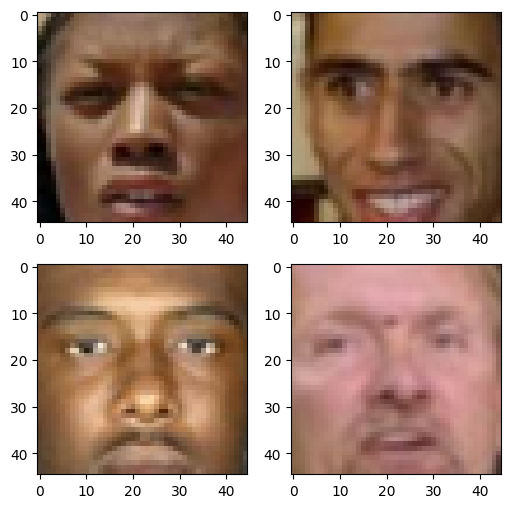

In [29]:
import matplotlib.pyplot as plt
_, axes = plt.subplots(2, 2, figsize=(6, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(X_train[i])

## 1.2. Архитектура модели (2 балла)
В этом разделе вы напишите и обучите обычный автоэнкодер.



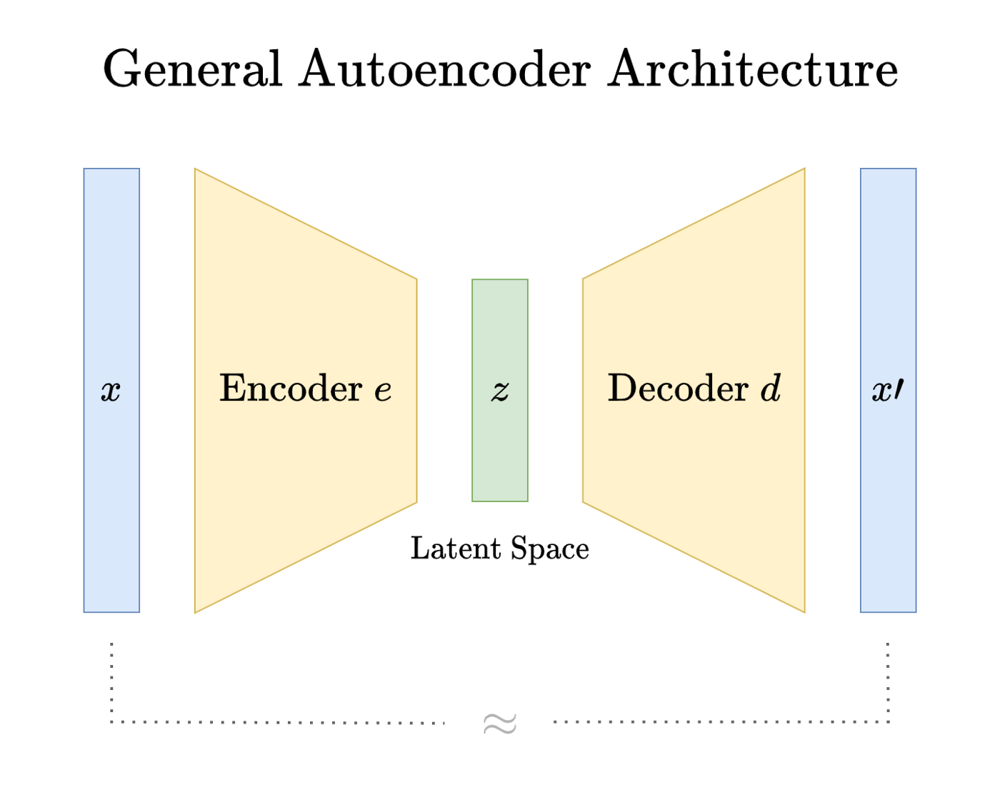

In [30]:
dim_code = 128 # выберите размер латентного вектора
#дальше я явно указывал 128

Реализуем autoencoder. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Экспериментируйте!

In [31]:
class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()

        
        self.enc = nn.Sequential(
            nn.Conv2d(3, 16, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3, stride=2, padding=1), 
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1), 
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1), 
            nn.ReLU(),
            nn.Flatten(),                            # -> batch, 128*3*3 = 1152
        )
        
        self.dec = nn.Sequential(
            nn.Unflatten(1, (128, 3, 3)), 
            nn.ConvTranspose2d(128, 128, 3, stride=2, padding=1, output_padding=1), 
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1), 
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1), 
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, 3, stride=1, padding=1),
            nn.ReLU(),
            
        )

    def forward(self, x):
        latent_code = self.enc(x)
        reconstruction = self.dec(latent_code)
        # реализуйте forward проход автоэнкодера
        # в качестве возвращаемых переменных -- латентное представление картинки (latent_code)
        # и полученная реконструкция изображения (reconstruction)

        return reconstruction, latent_code


In [32]:
import torch.optim as optim

criterion = nn.MSELoss()

model = Autoencoder().to(device)

optimizer = optim.Adam(model.parameters(), lr = 3e-4 )




## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэнкодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

  0%|          | 0/50 [00:00<?, ?it/s]

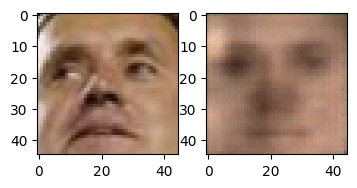

  2%|▏         | 1/50 [00:03<03:00,  3.68s/it]

epoch:0, cur train loss: 0.06620225075232175, curr test loss: 0.009509187990001269


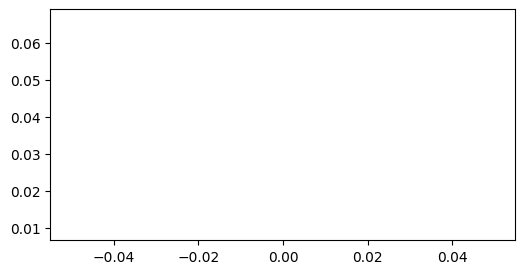

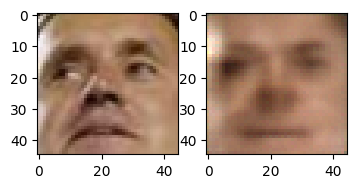

  4%|▍         | 2/50 [00:05<01:57,  2.44s/it]

epoch:1, cur train loss: 0.008045552898665218, curr test loss: 0.007104028304595323


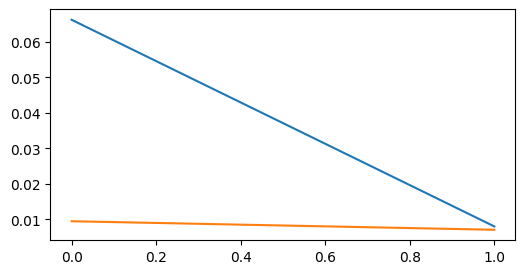

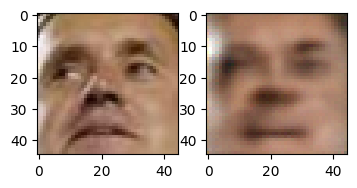

  6%|▌         | 3/50 [00:06<01:36,  2.06s/it]

epoch:2, cur train loss: 0.005975020291936367, curr test loss: 0.005039987952581474


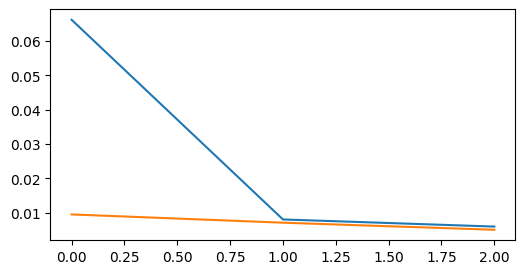

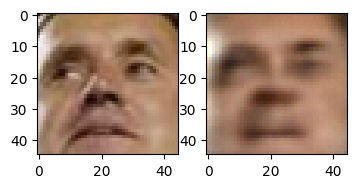

  8%|▊         | 4/50 [00:08<01:26,  1.87s/it]

epoch:3, cur train loss: 0.004561109181917499, curr test loss: 0.0042270011645520016


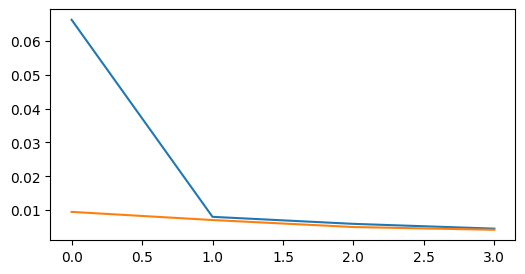

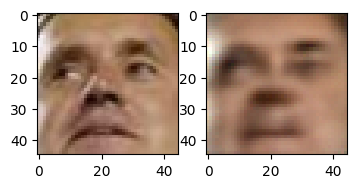

 10%|█         | 5/50 [00:10<01:19,  1.77s/it]

epoch:4, cur train loss: 0.003989719707742714, curr test loss: 0.003787462366744876


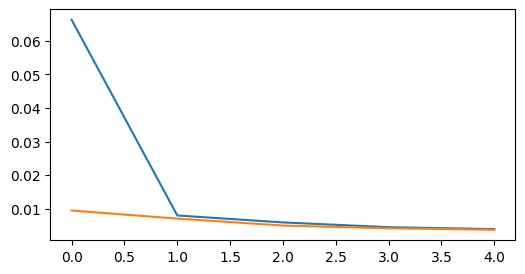

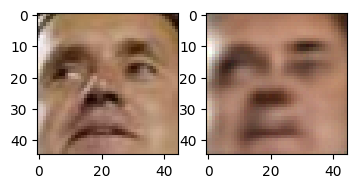

 12%|█▏        | 6/50 [00:11<01:15,  1.72s/it]

epoch:5, cur train loss: 0.003651029832870759, curr test loss: 0.0035661085553112485


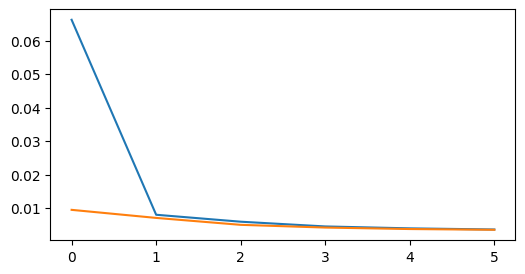

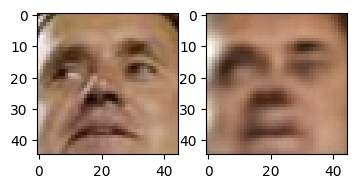

 14%|█▍        | 7/50 [00:13<01:12,  1.70s/it]

epoch:6, cur train loss: 0.0034048293498070803, curr test loss: 0.003320609141762058


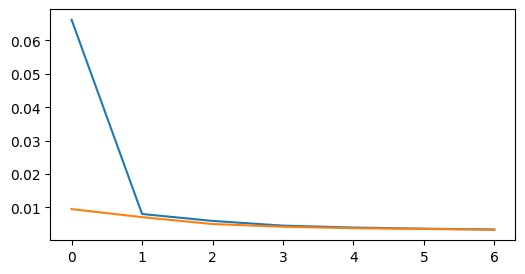

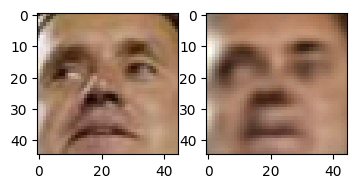

 16%|█▌        | 8/50 [00:14<01:09,  1.66s/it]

epoch:7, cur train loss: 0.003163485092294338, curr test loss: 0.003076164218197976


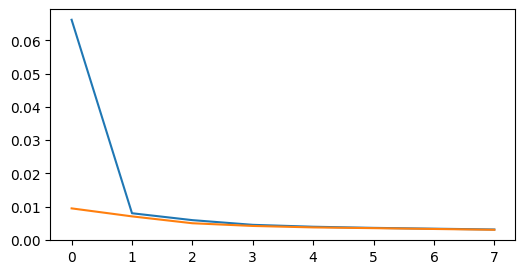

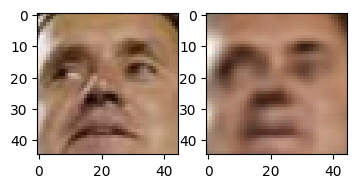

 18%|█▊        | 9/50 [00:16<01:07,  1.65s/it]

epoch:8, cur train loss: 0.0029882805277843534, curr test loss: 0.002940004946486581


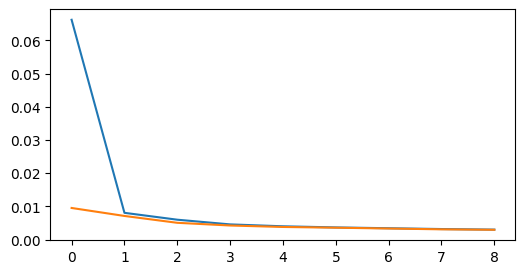

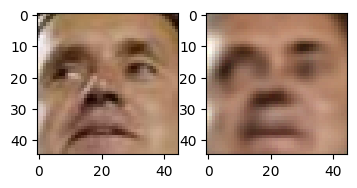

 20%|██        | 10/50 [00:18<01:05,  1.63s/it]

epoch:9, cur train loss: 0.00286639699845782, curr test loss: 0.0028103226241433903


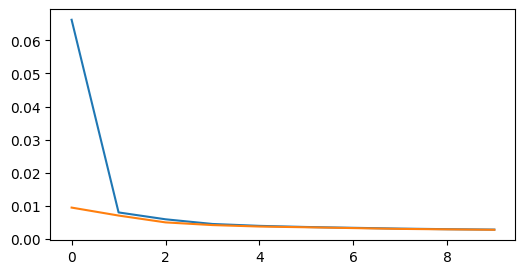

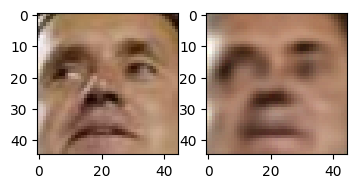

 22%|██▏       | 11/50 [00:19<01:03,  1.62s/it]

epoch:10, cur train loss: 0.0027336539620833704, curr test loss: 0.00275391999942561


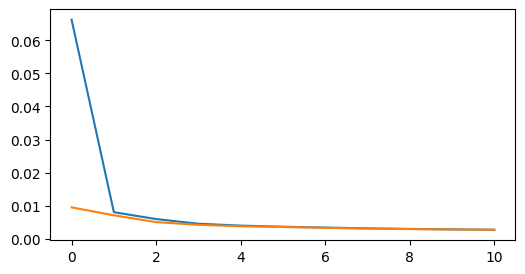

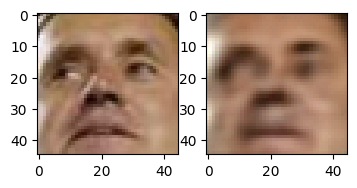

 24%|██▍       | 12/50 [00:21<01:01,  1.62s/it]

epoch:11, cur train loss: 0.002625060346349121, curr test loss: 0.0025653760392396223


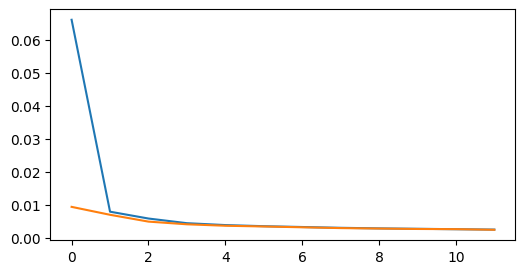

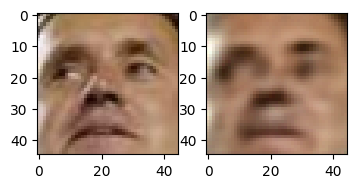

 26%|██▌       | 13/50 [00:23<01:02,  1.70s/it]

epoch:12, cur train loss: 0.0025133767961393423, curr test loss: 0.0024780066617365393


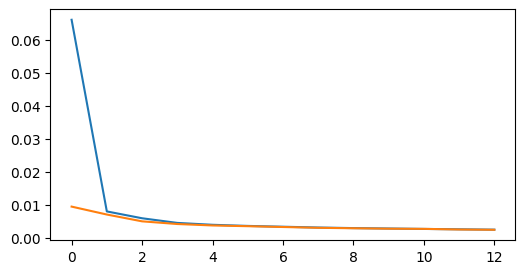

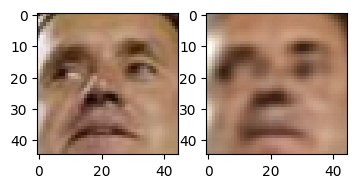

 28%|██▊       | 14/50 [00:24<01:00,  1.67s/it]

epoch:13, cur train loss: 0.002400871806913782, curr test loss: 0.00263134374593695


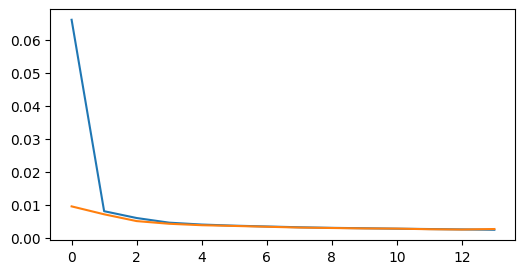

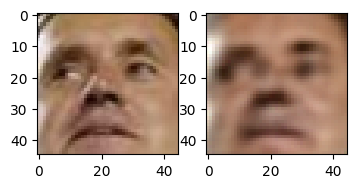

 30%|███       | 15/50 [00:26<00:57,  1.64s/it]

epoch:14, cur train loss: 0.0023229442819085954, curr test loss: 0.0022915595521529517


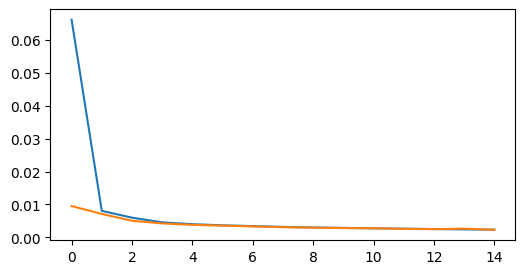

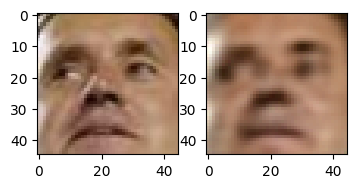

 32%|███▏      | 16/50 [00:28<00:55,  1.64s/it]

epoch:15, cur train loss: 0.002252271680561516, curr test loss: 0.0022472190848063854


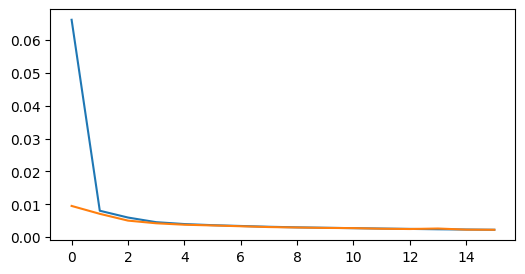

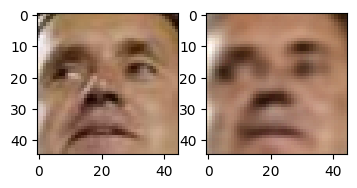

 34%|███▍      | 17/50 [00:29<00:53,  1.63s/it]

epoch:16, cur train loss: 0.0021757086943787383, curr test loss: 0.002170950129982971


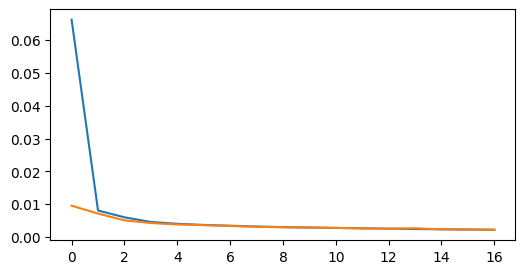

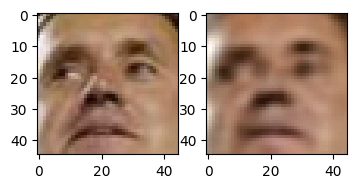

 36%|███▌      | 18/50 [00:31<00:51,  1.62s/it]

epoch:17, cur train loss: 0.0021060861357132836, curr test loss: 0.0020675564550661613


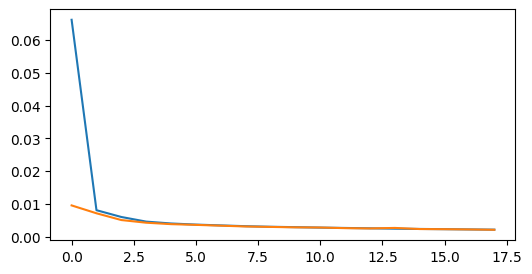

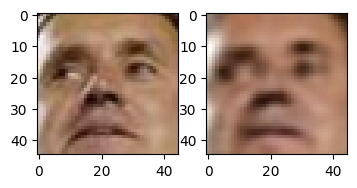

 38%|███▊      | 19/50 [00:32<00:50,  1.63s/it]

epoch:18, cur train loss: 0.002050269085168362, curr test loss: 0.00202896693233578


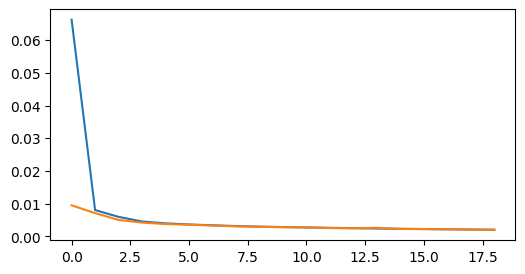

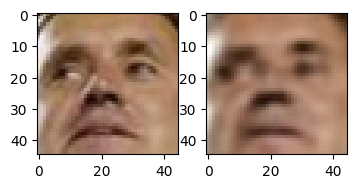

 40%|████      | 20/50 [00:34<00:48,  1.63s/it]

epoch:19, cur train loss: 0.001989269230152716, curr test loss: 0.0019822154482383105


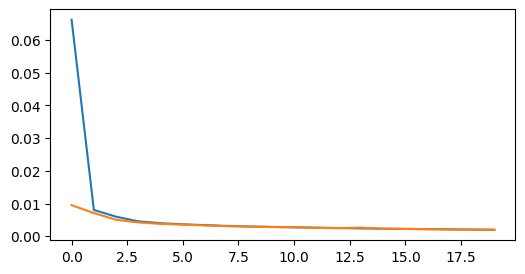

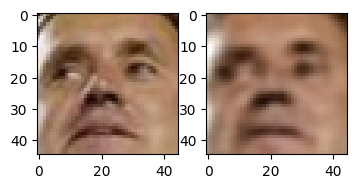

 42%|████▏     | 21/50 [00:36<00:47,  1.62s/it]

epoch:20, cur train loss: 0.0019280088549155903, curr test loss: 0.0019222077181828873


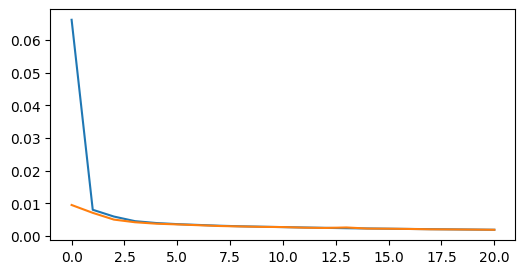

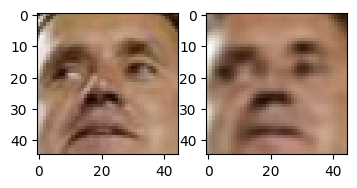

 44%|████▍     | 22/50 [00:37<00:45,  1.62s/it]

epoch:21, cur train loss: 0.0018832098056688485, curr test loss: 0.0018635546855096305


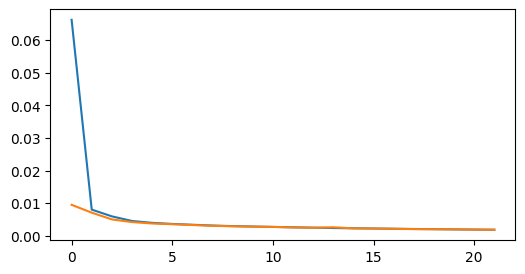

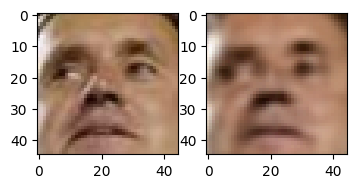

 46%|████▌     | 23/50 [00:39<00:43,  1.62s/it]

epoch:22, cur train loss: 0.0018480525857023419, curr test loss: 0.0018320355641966064


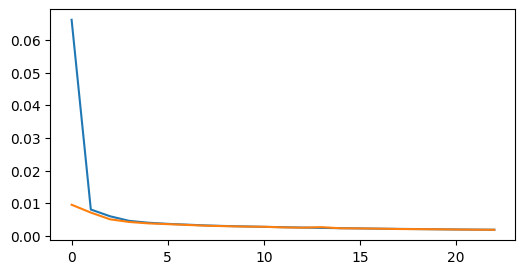

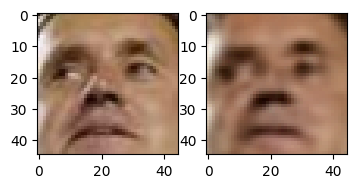

 48%|████▊     | 24/50 [00:40<00:41,  1.61s/it]

epoch:23, cur train loss: 0.00178969852760901, curr test loss: 0.0029056614287020196


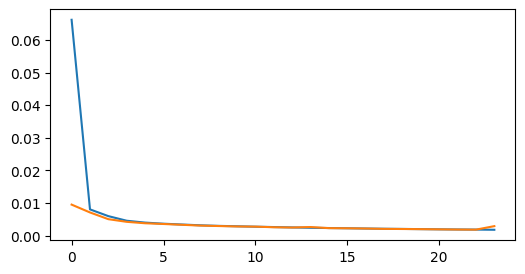

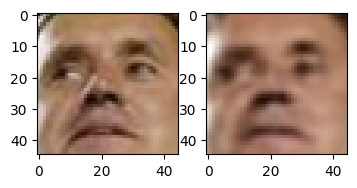

 50%|█████     | 25/50 [00:42<00:40,  1.62s/it]

epoch:24, cur train loss: 0.0017694313531084096, curr test loss: 0.0017927920035574409


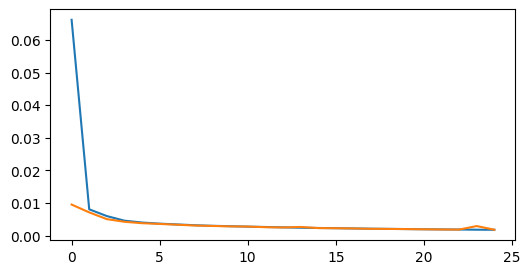

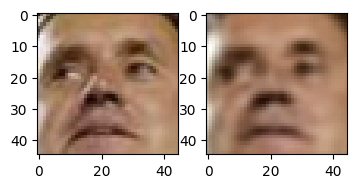

 52%|█████▏    | 26/50 [00:44<00:38,  1.62s/it]

epoch:25, cur train loss: 0.0017165884767394617, curr test loss: 0.001750601865794687


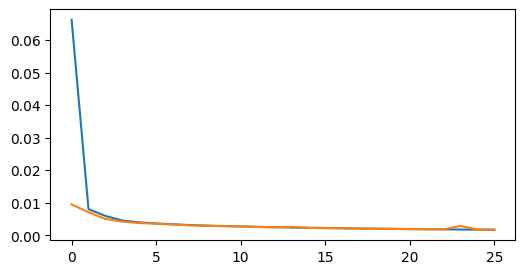

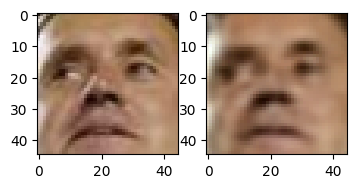

 54%|█████▍    | 27/50 [00:46<00:39,  1.70s/it]

epoch:26, cur train loss: 0.0016976875819318244, curr test loss: 0.0017224970340196575


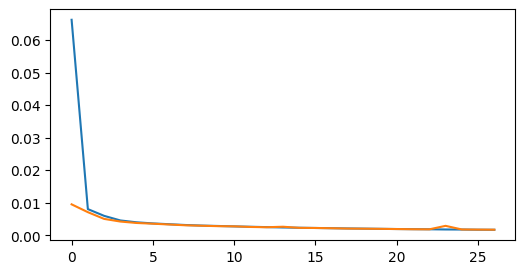

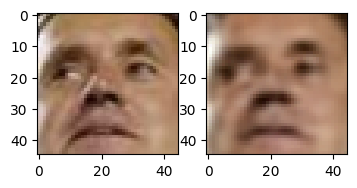

 56%|█████▌    | 28/50 [00:47<00:36,  1.68s/it]

epoch:27, cur train loss: 0.0016495291348499106, curr test loss: 0.0016489745550123708


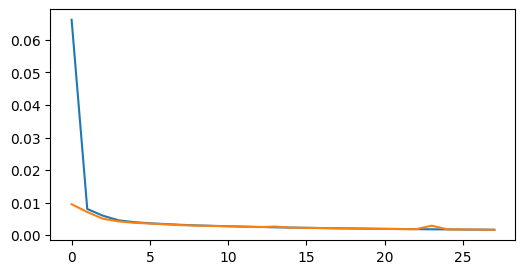

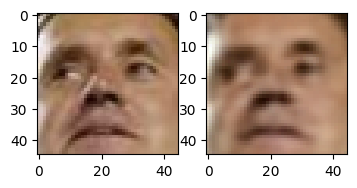

 58%|█████▊    | 29/50 [00:49<00:34,  1.67s/it]

epoch:28, cur train loss: 0.0016239288604229956, curr test loss: 0.001731854758136684


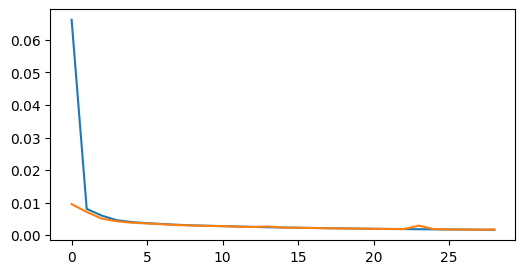

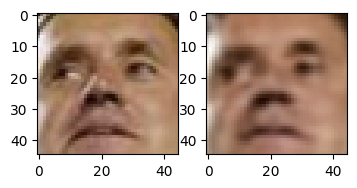

 60%|██████    | 30/50 [00:50<00:33,  1.66s/it]

epoch:29, cur train loss: 0.0016122580514244182, curr test loss: 0.0015787721411990269


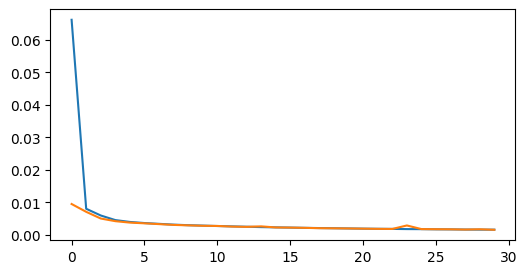

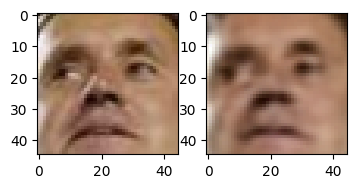

 62%|██████▏   | 31/50 [00:52<00:31,  1.66s/it]

epoch:30, cur train loss: 0.001563366779716938, curr test loss: 0.0015744669695517846


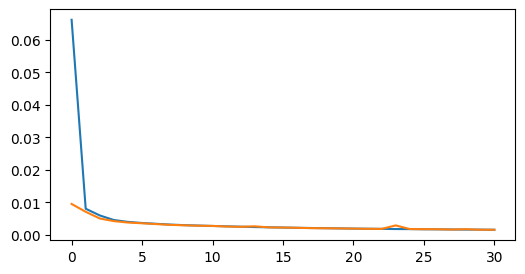

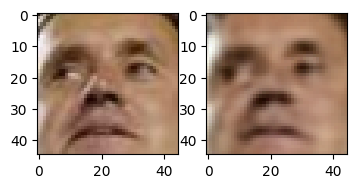

 64%|██████▍   | 32/50 [00:54<00:29,  1.65s/it]

epoch:31, cur train loss: 0.0015417583905460545, curr test loss: 0.0015372840709806908


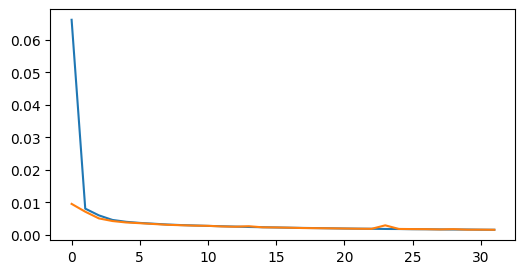

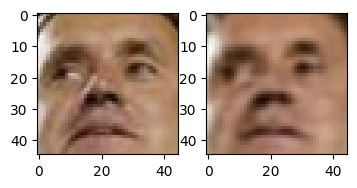

 66%|██████▌   | 33/50 [00:55<00:27,  1.64s/it]

epoch:32, cur train loss: 0.001522519562603034, curr test loss: 0.0015155775029034842


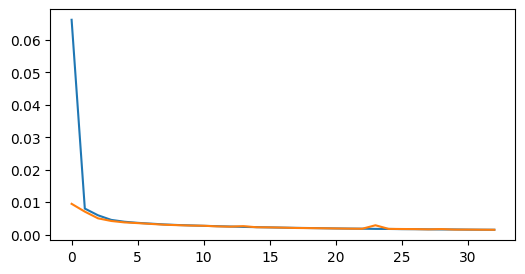

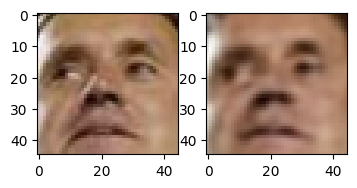

 68%|██████▊   | 34/50 [00:57<00:26,  1.65s/it]

epoch:33, cur train loss: 0.00149757913528177, curr test loss: 0.0015041543492337777


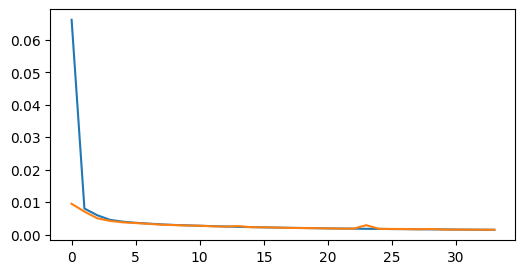

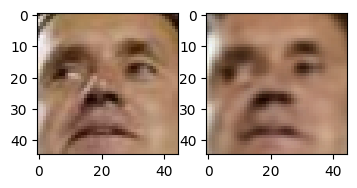

 70%|███████   | 35/50 [00:59<00:24,  1.65s/it]

epoch:34, cur train loss: 0.0014878649778468796, curr test loss: 0.001496851954254366


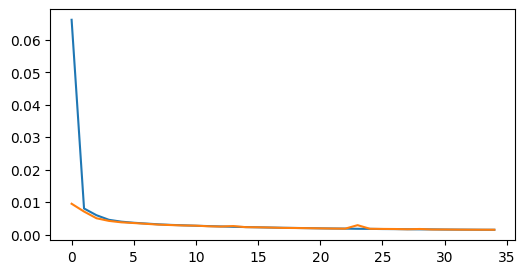

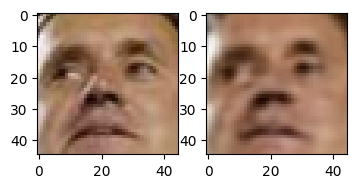

 72%|███████▏  | 36/50 [01:00<00:23,  1.65s/it]

epoch:35, cur train loss: 0.0014457352795278478, curr test loss: 0.0014912430917666782


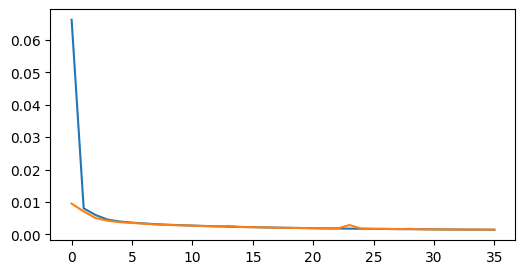

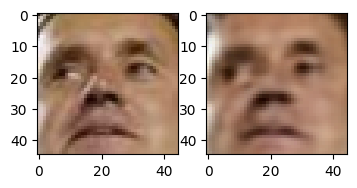

 74%|███████▍  | 37/50 [01:02<00:21,  1.66s/it]

epoch:36, cur train loss: 0.0014477197171362769, curr test loss: 0.0014150386421187293


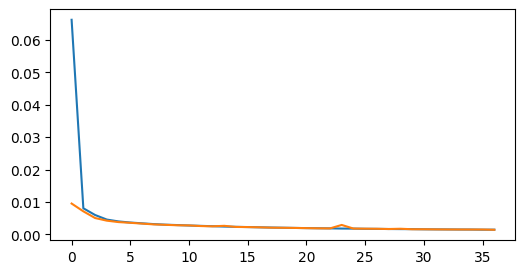

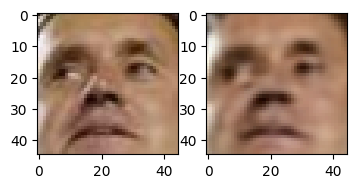

 76%|███████▌  | 38/50 [01:04<00:19,  1.65s/it]

epoch:37, cur train loss: 0.0013855731826635253, curr test loss: 0.0013929176798445127


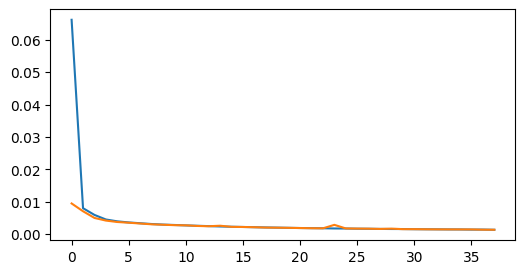

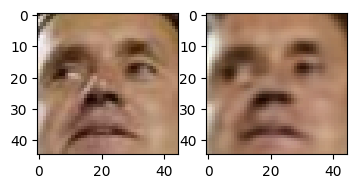

 78%|███████▊  | 39/50 [01:05<00:18,  1.65s/it]

epoch:38, cur train loss: 0.0013740458180341879, curr test loss: 0.0013488330046779343


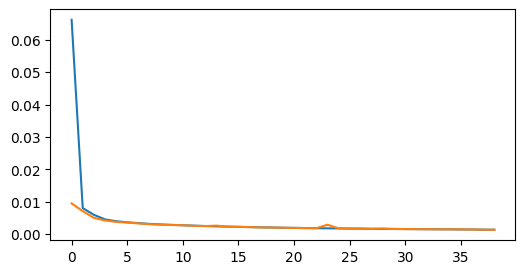

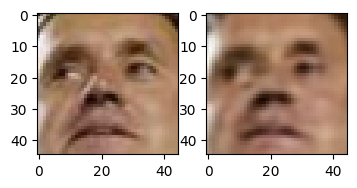

 80%|████████  | 40/50 [01:07<00:16,  1.65s/it]

epoch:39, cur train loss: 0.0012863288056510298, curr test loss: 0.001231330563314259


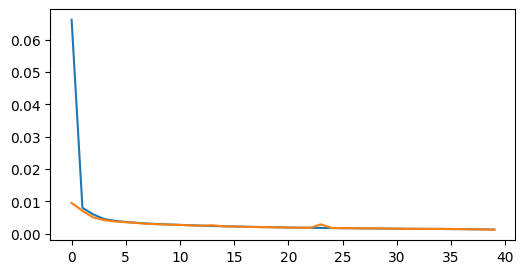

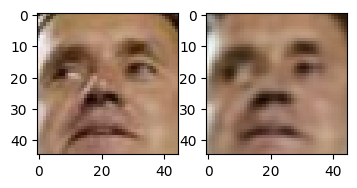

 82%|████████▏ | 41/50 [01:09<00:14,  1.65s/it]

epoch:40, cur train loss: 0.0012040369317133236, curr test loss: 0.0013420213335415437


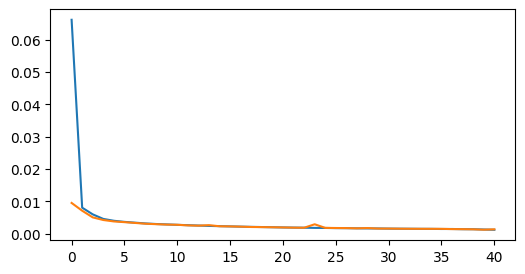

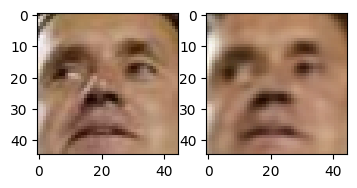

 84%|████████▍ | 42/50 [01:10<00:13,  1.72s/it]

epoch:41, cur train loss: 0.0011648857881805723, curr test loss: 0.0012137125650908622


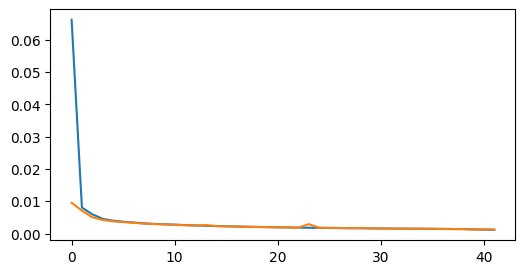

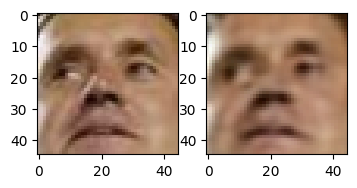

 86%|████████▌ | 43/50 [01:12<00:11,  1.71s/it]

epoch:42, cur train loss: 0.0011387082590016506, curr test loss: 0.0011403855945294101


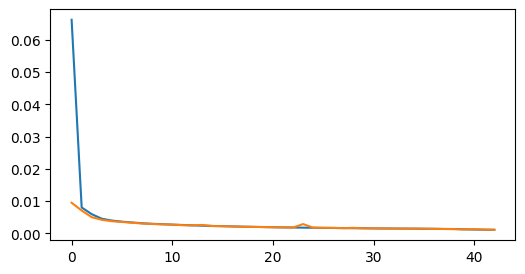

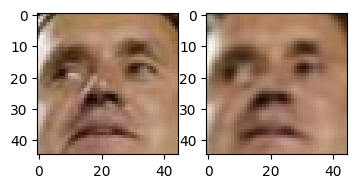

 88%|████████▊ | 44/50 [01:14<00:10,  1.69s/it]

epoch:43, cur train loss: 0.001113394875843983, curr test loss: 0.0011268677189946175


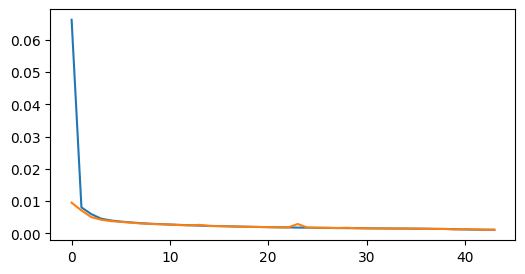

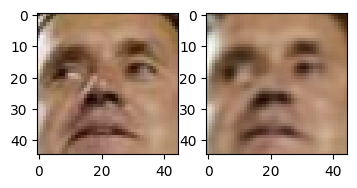

 90%|█████████ | 45/50 [01:15<00:08,  1.68s/it]

epoch:44, cur train loss: 0.0010912311861834602, curr test loss: 0.0012030902629097302


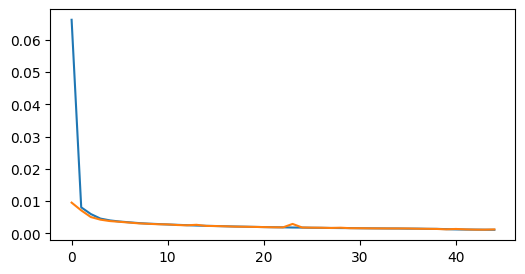

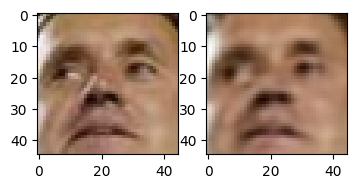

 92%|█████████▏| 46/50 [01:17<00:06,  1.67s/it]

epoch:45, cur train loss: 0.001083641482428993, curr test loss: 0.0010877175511614908


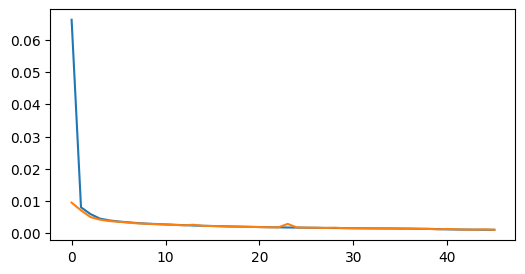

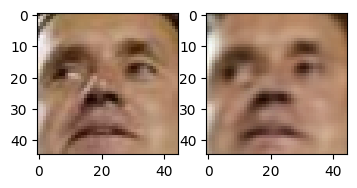

 94%|█████████▍| 47/50 [01:19<00:04,  1.67s/it]

epoch:46, cur train loss: 0.0010608962958540452, curr test loss: 0.0012543498083860392


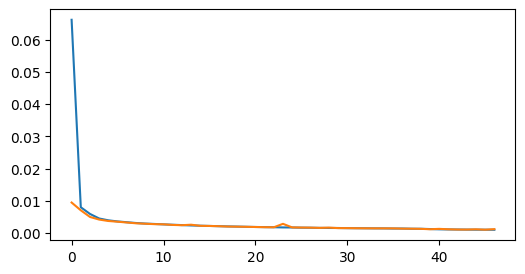

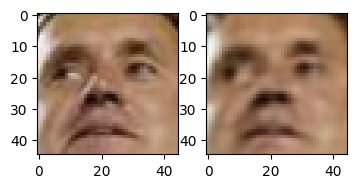

 96%|█████████▌| 48/50 [01:20<00:03,  1.66s/it]

epoch:47, cur train loss: 0.0010418922725536138, curr test loss: 0.0010660795073601462


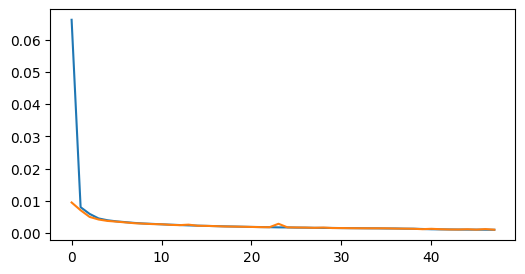

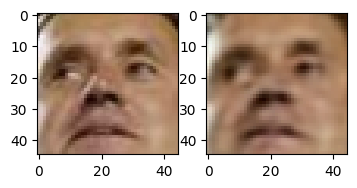

 98%|█████████▊| 49/50 [01:22<00:01,  1.68s/it]

epoch:48, cur train loss: 0.0010324978895480637, curr test loss: 0.0010415186878249404


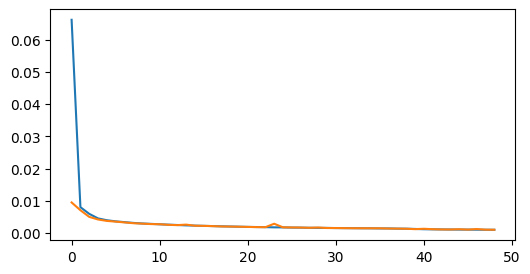

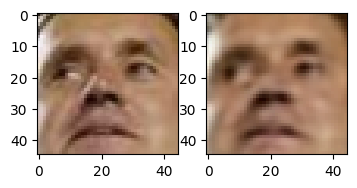

100%|██████████| 50/50 [01:24<00:00,  1.69s/it]

epoch:49, cur train loss: 0.0010074844296254655, curr test loss: 0.0010225104689154598


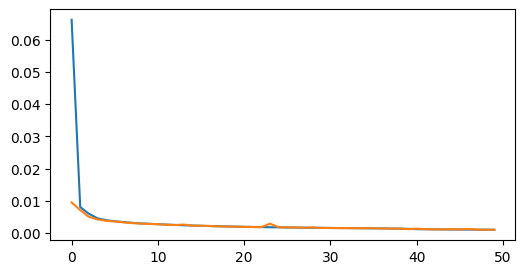

In [33]:
from tqdm import tqdm
epoch = 50
train_loss = []
test_loss = []
val_vis = X_test_tensor[0:1].to(device) 
for i in tqdm(range(epoch)):
    model.train()
    epoch_loss = {'train': [], 'test': []}
    
    for batch in train_dataloader:
        optimizer.zero_grad()
        batch = batch[0].to(device)

        pred = model(batch)

        loss = criterion(pred[0], batch)

        loss.backward()
        optimizer.step()
        epoch_loss['train'].append(loss.item())
    eplosstr = np.mean(epoch_loss['train'])
    train_loss.append(eplosstr)

    model.eval()
    for batch in test_dataloader:
        with torch.no_grad():
            batch = batch[0].to(device)
            pred = model(batch)
            loss = criterion(pred[0], batch)
            epoch_loss['test'].append(loss.item())
    eplosstest = np.mean(epoch_loss['test'])
    test_loss.append(eplosstest)

    with torch.no_grad():
        recon_vis, _ = model(val_vis)
        
    fig, axes = plt.subplots(1, 2, figsize=(4,2))
    axes[0].imshow(val_vis[0].cpu().permute(1,2,0).clamp(0,1))
    axes[1].imshow(recon_vis[0].cpu().permute(1,2,0).clamp(0,1))
    plt.show()

    plt.figure(figsize=(6,3))
    plt.plot(train_loss, label='train')
    plt.plot(test_loss, label='val')


    
    print(f'epoch:{i}, cur train loss: {eplosstr}, curr test loss: {eplosstest}')
    



Давайте посмотрим, как наш тренированный автоэнкодер кодирует и восстанавливает картинки:

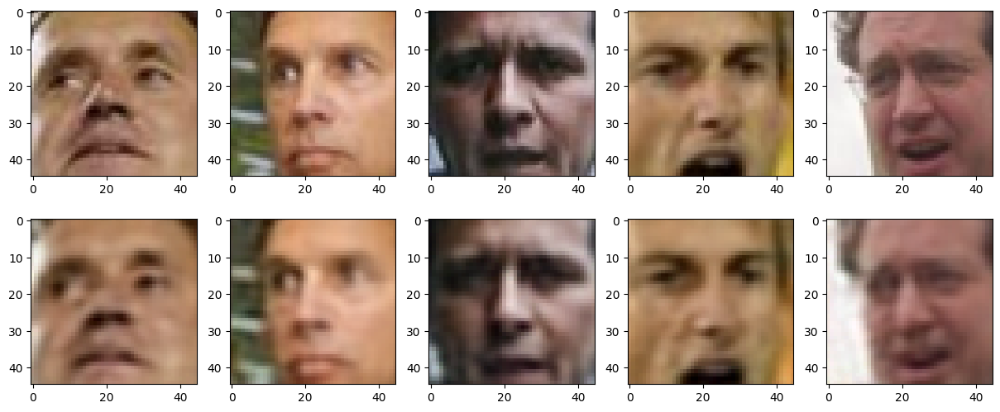

In [34]:
model.eval()
val_subset = X_test_tensor[:5].to(device)
with torch.no_grad():
    recon_subset, _ = model(val_subset)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i in range(5):
    axes[0, i].imshow(val_subset[i].cpu().permute(1, 2, 0).clamp(0, 1))
    axes[1, i].imshow(recon_subset[i].cpu().permute(1, 2, 0).clamp(0, 1))

plt.show()

Что вы можете сказать про результат?

# Результат хороший #учитывая что мы полностью разрушаем пространственную информацию 

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэнкодер и получать реконструкцию, а попробуем создать что-то НОВОЕ!

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__ Если вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

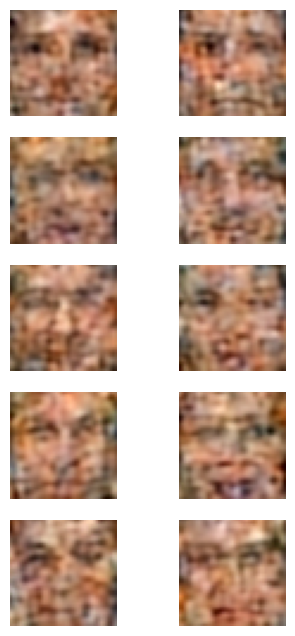

In [35]:

model.eval()
latents = []
with torch.no_grad():
    for batch in train_dataloader:
        img = batch[0].to(device)
        recon, latent = model(img)         
        latents.append(latent.cpu())
latents = torch.cat(latents, dim=0)     

mean = latents.mean(dim=0)               
std  = latents.std(dim=0)                


z = mean[None, :] + std[None, :] * torch.randn(25, 128*3*3)
z = z.to(device)


with torch.no_grad():
    fake = model.dec(z)                  

fig, axes = plt.subplots(5, 2, figsize=(4,8))
for i, ax in enumerate(axes.flat):
    ax.imshow(fake[i].cpu().permute(1,2,0).clamp(0,1))
plt.show()

## 1.5 Time to make fun! (3 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с атрибутами, скачанный вместе с картинками. В нем указаны имена изображений и присутствубщие атрибуты (улыбки, очки и прочее интересное).

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких.

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей.

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

In [106]:
full_images = torch.cat([X_train_tensor, X_test_tensor], dim=0)   
full_attrs  = pd.concat([y_train, y_test], ignore_index=True)    


smile_col = 'Smiling'
sorted_attrs = full_attrs.sort_values(smile_col)
fun_idx = sorted_attrs.tail(20).index   
sad_idx = sorted_attrs.head(20).index


fun_batch = full_images[fun_idx].to(device)   #
sad_batch = full_images[sad_idx].to(device)




In [111]:
sad_idx

Index([ 6453,  5451, 11590,  9530,  8222, 10646,  1127,  1361,  5315, 11691,
        3755,  3837,  9275, 11395,  6111,  2958, 10140,  5196, 10825,  7562],
      dtype='int64')

In [ ]:
with torch.no_grad():
    emb_fun = model.enc(fun_batch)    
    emb_sad = model.enc(sad_batch)

mean_fun = emb_fun.mean(dim=0)
mean_sad = emb_sad.mean(dim=0)
smile_vector = mean_fun - mean_sad

In [123]:

idx = sad_idx[2] 
img_sad = full_images[idx].unsqueeze(0).to(device) 

with torch.no_grad():
    _, latent_sad = model(img_sad)         
    latent_smiled = latent_sad + smile_vector
    img_smiled = model.dec(latent_smiled)

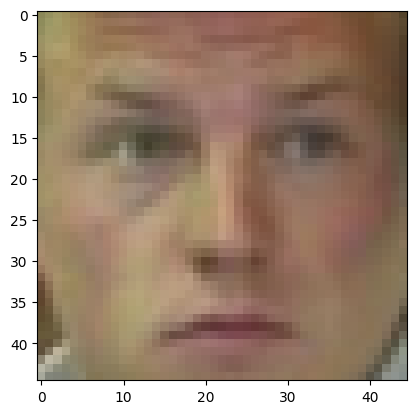

In [141]:
plt.imshow(img_sad[0].cpu().permute(1, 2, 0).clamp(0, 1).numpy())

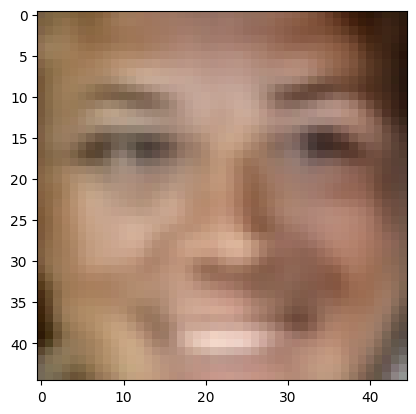

In [143]:
plt.imshow(img_smiled[0].cpu().permute(1, 2, 0).clamp(0, 1).numpy())

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... В общем, все, на что хватит фантазии и на что есть атрибуты в `attrs`:)

# Часть 2: Variational Autoencoder (10 баллов)

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [2]:
import torchvision.transforms as transforms


In [22]:
batch_size = 128
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

In [28]:
class VAE(nn.Module):
    def __init__(self, latent_dim = 128):
        super(VAE, self).__init__()
        

        self.enc = nn.Sequential(
            nn.Conv2d(1, 32, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 512), 
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(512, latent_dim)
        self.fc_logsigma = nn.Linear(512, latent_dim)
        

        self.decoder_input = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.ReLU()
        )
        self.dec = nn.Sequential(
            nn.Linear(512, 64 * 7 * 7), 
            nn.ReLU(),
            nn.Unflatten(1, (64, 7, 7)),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1), 
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 3, stride=2, padding=1, output_padding=1), 
            nn.Sigmoid()
        )


    
    def encode(self, x):

        x = self.enc(x)
        mu = self.fc_mu(x)
        logsigma = self.fc_logsigma(x)#############################################################################

        return mu, logsigma

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            sigma = torch.exp(0.5*logsigma)############
            
            eps = torch.randn_like(sigma)
            return mu + eps * sigma

        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu.
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu

    def decode(self, z):
        reconstruction = self.decoder_input(z)
        
        return self.dec(reconstruction)




    def forward(self, x):
        mu, logsigma = self.encode(x)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z)



        return mu, logsigma, reconstruction

Определим лосс и его компоненты для VAE:

Надеюсь, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [29]:
def KL_divergence(mu, logsigma):
    kl = -0.5 * torch.sum(1 + logsigma - mu.pow(2) - logsigma.exp(), dim=1)
    return kl.mean()

def log_likelihood(x, reconstruction):
    loss = nn.BCELoss(reduction = 'sum')
    return loss(reconstruction, x) / x.size(0)

def loss_vae(x, mu, logsigma, reconstruction):
    return KL_divergence(mu, logsigma) + log_likelihood(x, reconstruction)

И обучим модель:

In [30]:

criterion = loss_vae

model = VAE().to(device)

optimizer = optim.Adam(model.parameters(), lr = 3e-4 )

  0%|          | 0/50 [00:00<?, ?it/s]

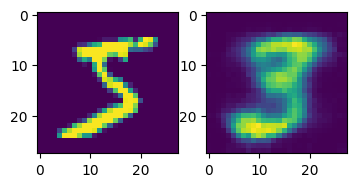

  2%|▏         | 1/50 [00:09<07:45,  9.50s/it]

epoch:0, cur train loss: 204.457133994682, curr test loss: 153.70586771904667


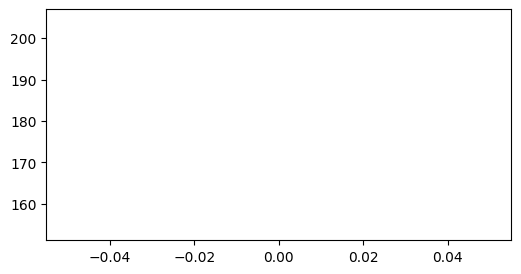

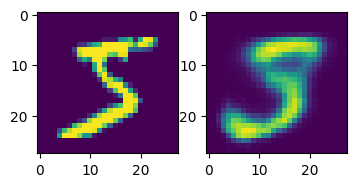

  4%|▍         | 2/50 [00:19<07:42,  9.63s/it]

epoch:1, cur train loss: 146.80002185683261, curr test loss: 127.95062545583218


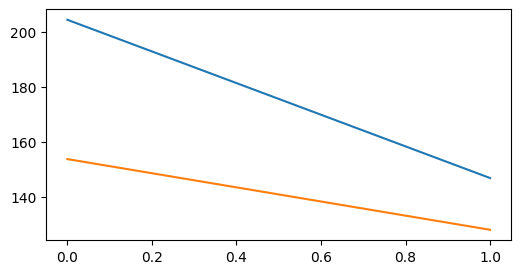

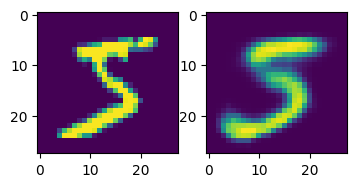

  6%|▌         | 3/50 [00:28<07:32,  9.63s/it]

epoch:2, cur train loss: 131.25566938843554, curr test loss: 115.62442315982867


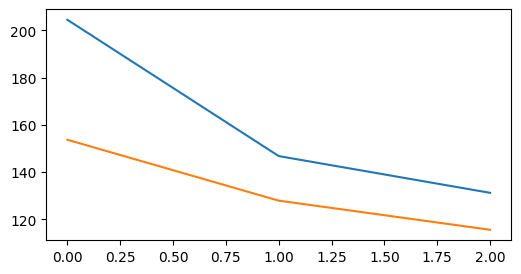

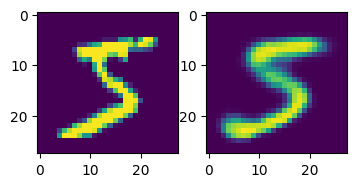

  8%|▊         | 4/50 [00:38<07:20,  9.58s/it]

epoch:3, cur train loss: 120.28969461729785, curr test loss: 107.52519341963756


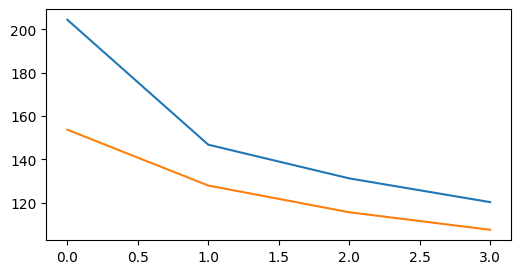

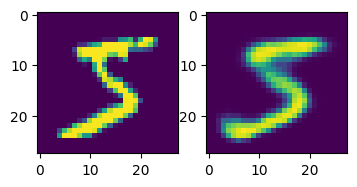

 10%|█         | 5/50 [00:47<07:11,  9.59s/it]

epoch:4, cur train loss: 113.94618231604602, curr test loss: 103.7690153484103


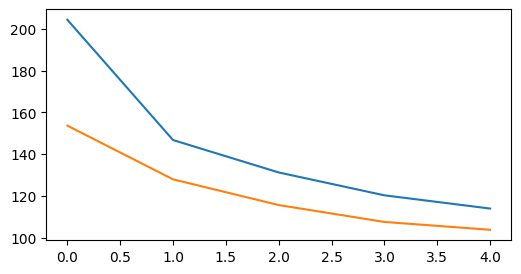

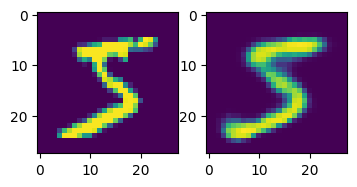

 12%|█▏        | 6/50 [00:57<07:00,  9.55s/it]

epoch:5, cur train loss: 110.25070086318547, curr test loss: 101.54425406154198


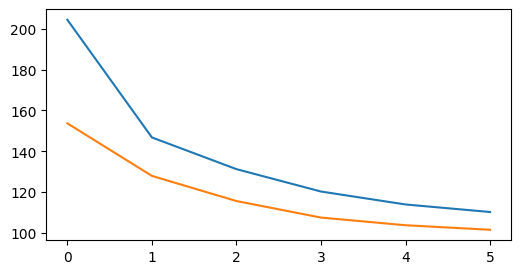

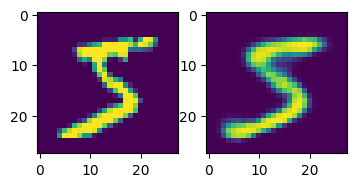

 14%|█▍        | 7/50 [01:06<06:50,  9.54s/it]

epoch:6, cur train loss: 107.82201149621244, curr test loss: 98.82335363460493


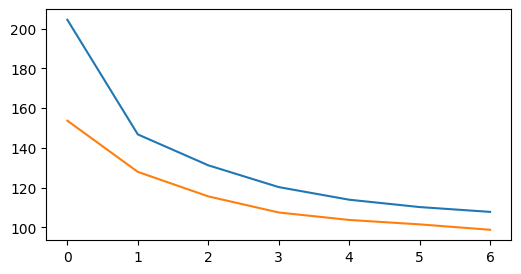

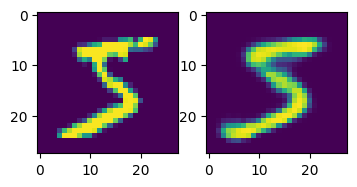

 16%|█▌        | 8/50 [01:16<06:40,  9.54s/it]

epoch:7, cur train loss: 106.087329221941, curr test loss: 97.29246347161788


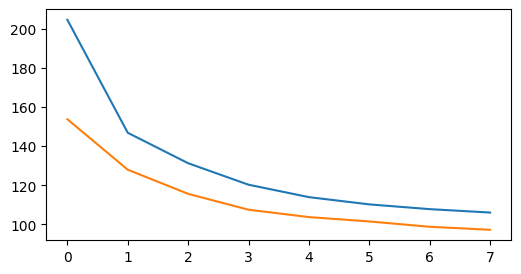

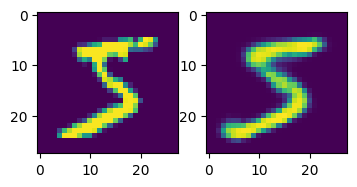

 18%|█▊        | 9/50 [01:25<06:30,  9.52s/it]

epoch:8, cur train loss: 104.74853302522509, curr test loss: 96.69507936888104


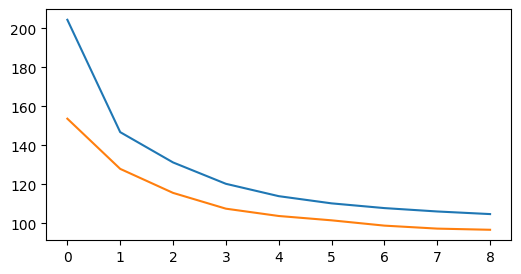

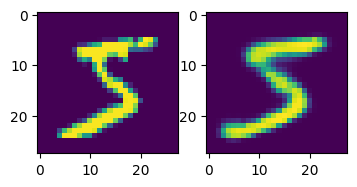

 20%|██        | 10/50 [01:35<06:21,  9.54s/it]

epoch:9, cur train loss: 103.71790573998555, curr test loss: 94.45931881288939


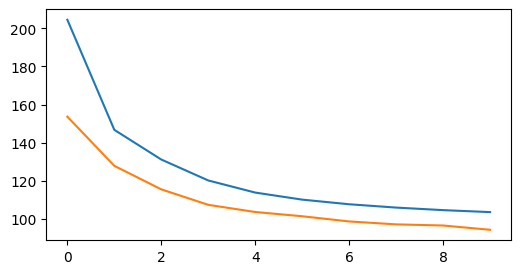

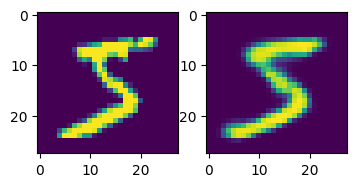

 22%|██▏       | 11/50 [01:45<06:11,  9.53s/it]

epoch:10, cur train loss: 102.78851650213636, curr test loss: 93.69289176071746


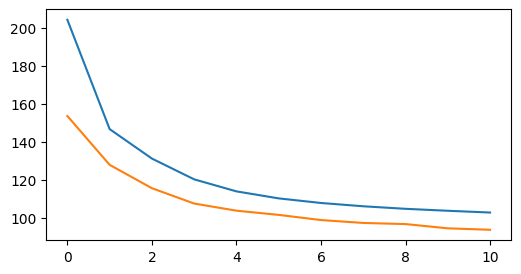

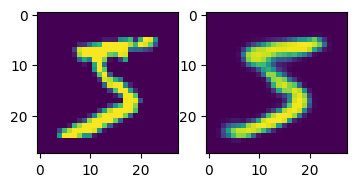

 24%|██▍       | 12/50 [01:54<06:02,  9.53s/it]

epoch:11, cur train loss: 102.11269163932882, curr test loss: 93.78171124035799


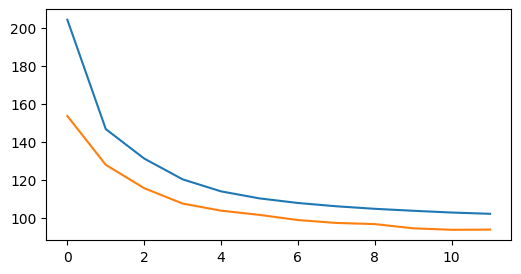

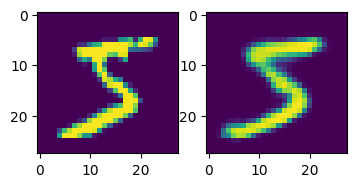

 26%|██▌       | 13/50 [02:04<05:53,  9.55s/it]

epoch:12, cur train loss: 101.48380746414412, curr test loss: 93.33315460591376


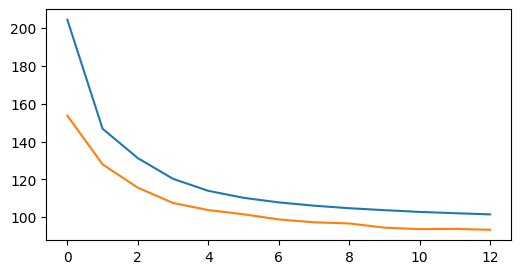

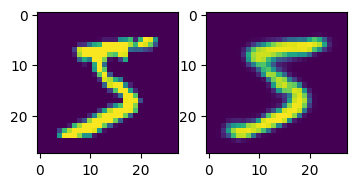

 28%|██▊       | 14/50 [02:14<05:46,  9.63s/it]

epoch:13, cur train loss: 100.92369486273988, curr test loss: 92.97878352298012


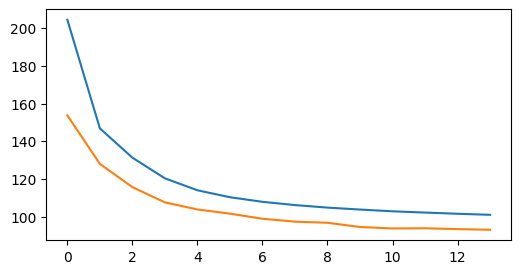

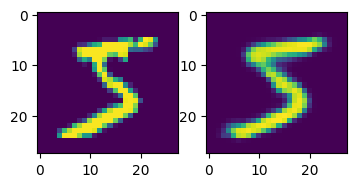

 30%|███       | 15/50 [02:23<05:37,  9.63s/it]

epoch:14, cur train loss: 100.53742922394514, curr test loss: 92.12457410595086


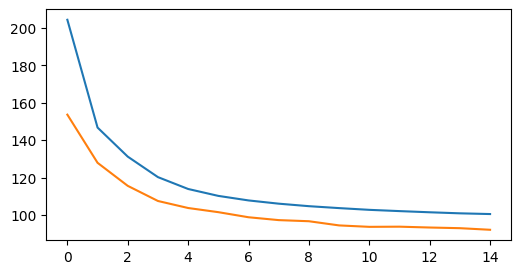

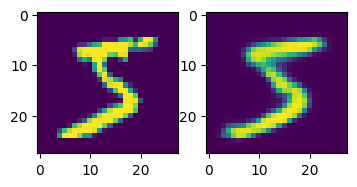

 32%|███▏      | 16/50 [02:33<05:26,  9.60s/it]

epoch:15, cur train loss: 100.1437977870136, curr test loss: 92.13001106358782


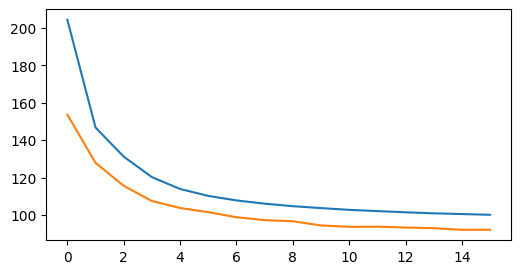

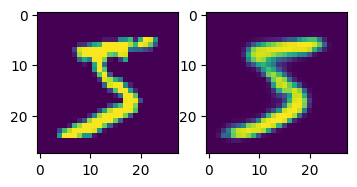

 34%|███▍      | 17/50 [02:42<05:17,  9.61s/it]

epoch:16, cur train loss: 99.8156433918837, curr test loss: 91.89659949194026


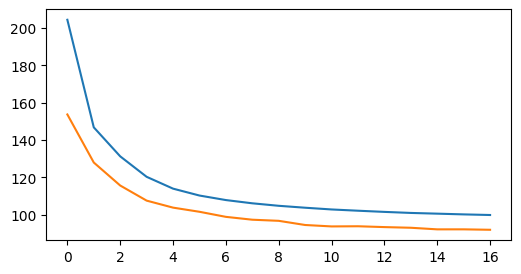

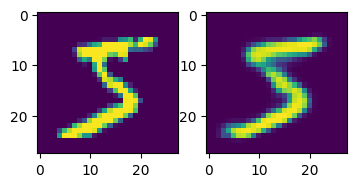

 36%|███▌      | 18/50 [02:52<05:07,  9.59s/it]

epoch:17, cur train loss: 99.49375255072295, curr test loss: 91.67859582055974


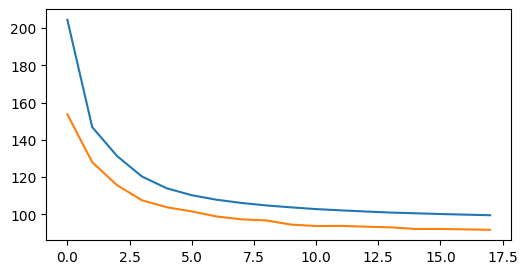

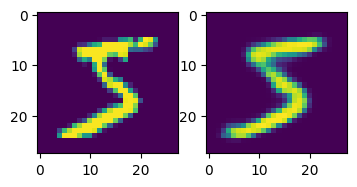

 38%|███▊      | 19/50 [03:01<04:57,  9.60s/it]

epoch:18, cur train loss: 99.17340587298753, curr test loss: 91.38754784306393


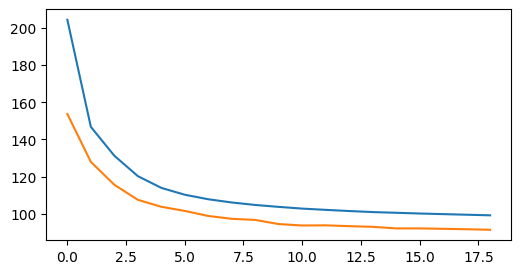

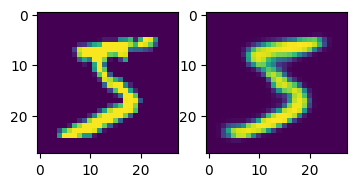

 40%|████      | 20/50 [03:11<04:47,  9.60s/it]

epoch:19, cur train loss: 98.86782905236998, curr test loss: 90.50034409535083


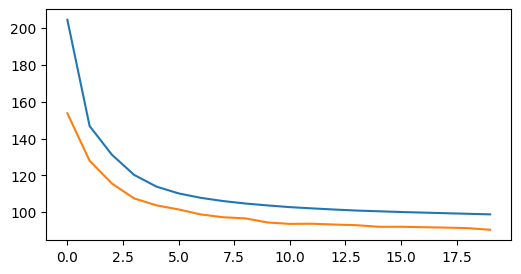

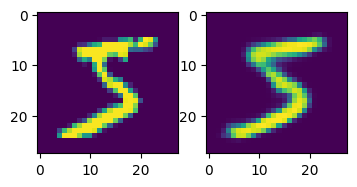

 42%|████▏     | 21/50 [03:21<04:38,  9.60s/it]

epoch:20, cur train loss: 98.67387521902381, curr test loss: 90.64598595341549


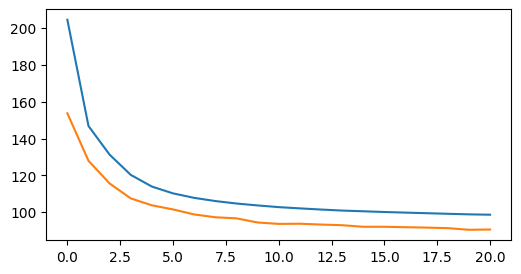

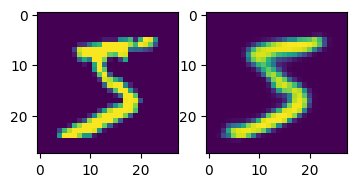

 44%|████▍     | 22/50 [03:30<04:28,  9.61s/it]

epoch:21, cur train loss: 98.42797451385303, curr test loss: 90.50454837461061


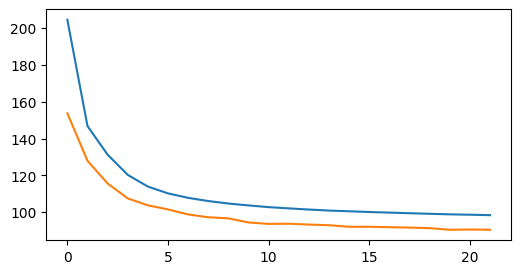

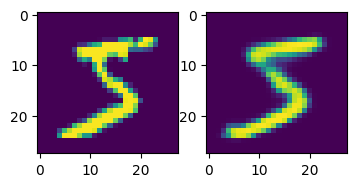

 46%|████▌     | 23/50 [03:40<04:19,  9.61s/it]

epoch:22, cur train loss: 98.24300678960805, curr test loss: 90.87617724454856


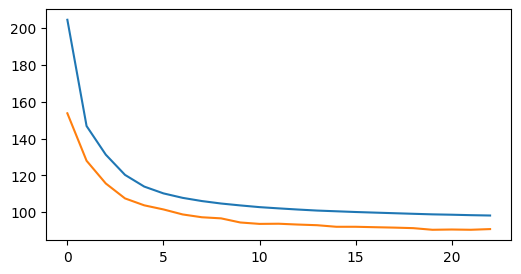

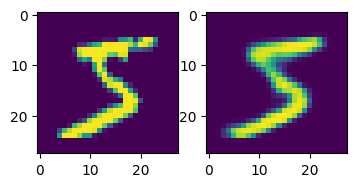

 48%|████▊     | 24/50 [03:49<04:09,  9.60s/it]

epoch:23, cur train loss: 98.08082837590784, curr test loss: 90.44777341432209


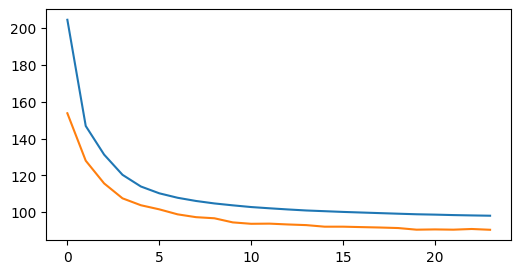

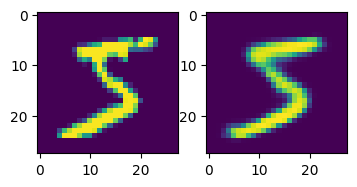

 50%|█████     | 25/50 [03:59<03:59,  9.59s/it]

epoch:24, cur train loss: 97.82925579339457, curr test loss: 90.00551315500766


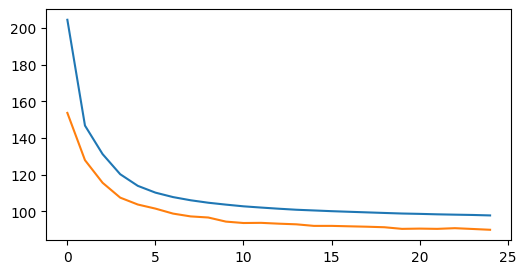

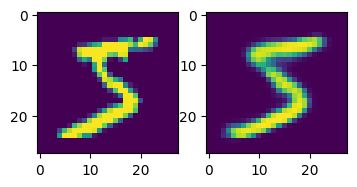

 52%|█████▏    | 26/50 [04:09<03:49,  9.57s/it]

epoch:25, cur train loss: 97.66927941165753, curr test loss: 89.89890192732027


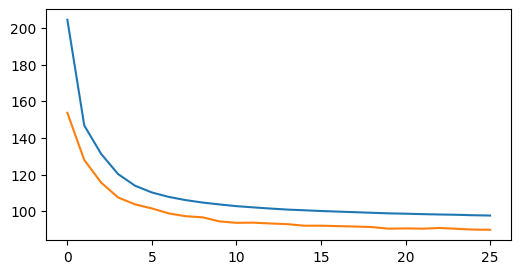

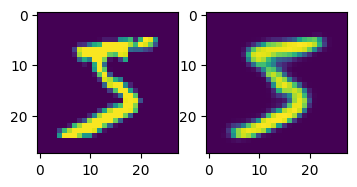

 54%|█████▍    | 27/50 [04:18<03:40,  9.57s/it]

epoch:26, cur train loss: 97.48846040249887, curr test loss: 89.76102225388152


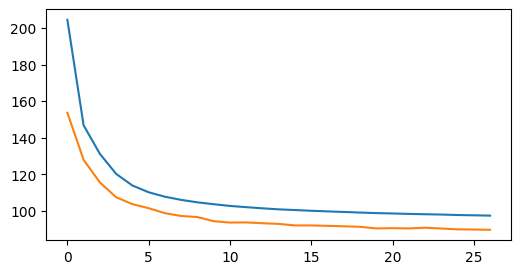

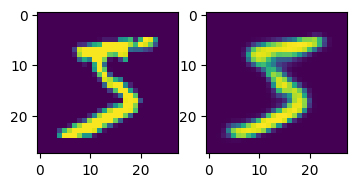

 56%|█████▌    | 28/50 [04:28<03:32,  9.65s/it]

epoch:27, cur train loss: 97.30797197874675, curr test loss: 89.79064477848101


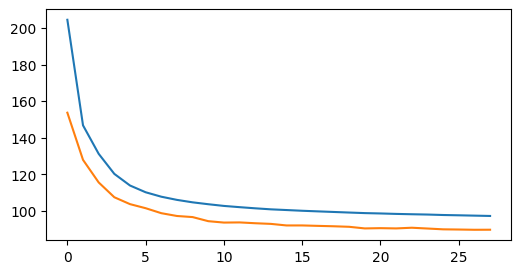

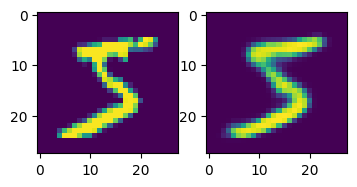

 58%|█████▊    | 29/50 [04:38<03:23,  9.69s/it]

epoch:28, cur train loss: 97.19000865553996, curr test loss: 90.01158200034612


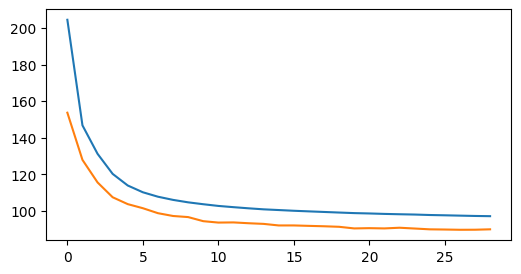

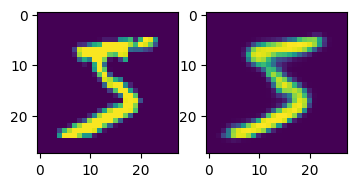

 60%|██████    | 30/50 [04:47<03:13,  9.67s/it]

epoch:29, cur train loss: 97.04911809079428, curr test loss: 89.76389892191827


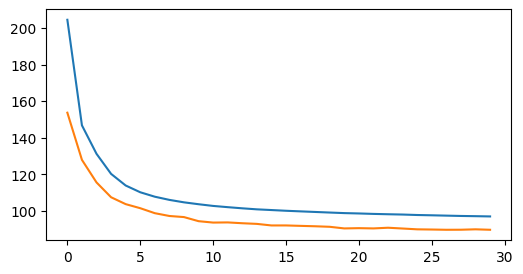

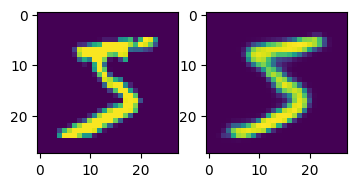

 62%|██████▏   | 31/50 [04:57<03:03,  9.67s/it]

epoch:30, cur train loss: 96.90282393010186, curr test loss: 89.16047919551029


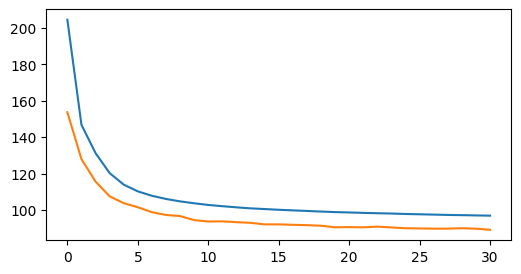

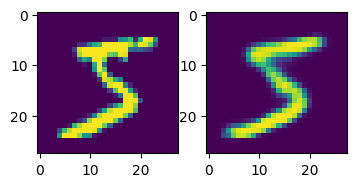

 64%|██████▍   | 32/50 [05:07<02:53,  9.63s/it]

epoch:31, cur train loss: 96.76571660153647, curr test loss: 89.44278494919402


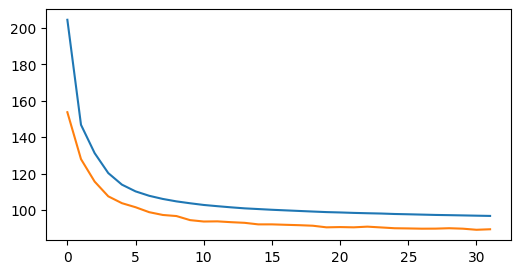

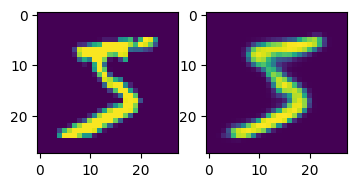

 66%|██████▌   | 33/50 [05:16<02:43,  9.62s/it]

epoch:32, cur train loss: 96.62371969324694, curr test loss: 89.12035302270817


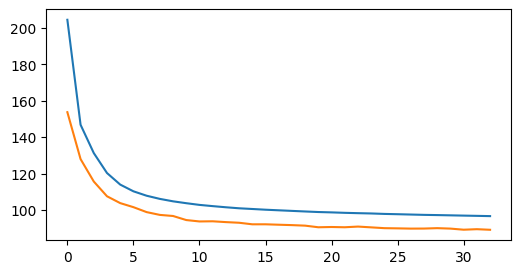

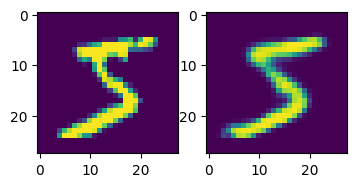

 68%|██████▊   | 34/50 [05:26<02:34,  9.63s/it]

epoch:33, cur train loss: 96.50743903381738, curr test loss: 89.77449016329608


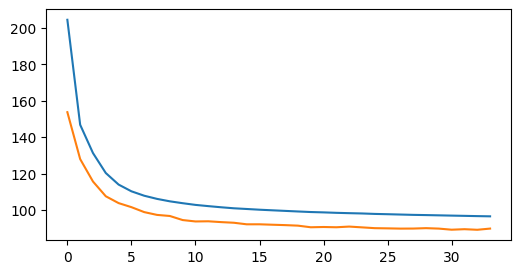

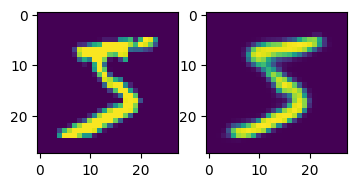

 70%|███████   | 35/50 [05:35<02:24,  9.64s/it]

epoch:34, cur train loss: 96.39236856879457, curr test loss: 89.67899515658995


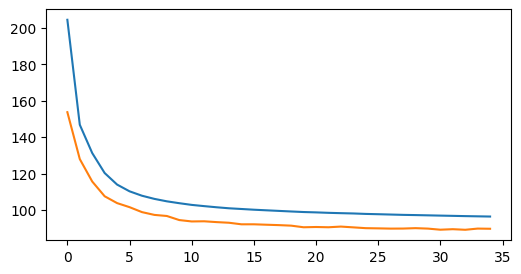

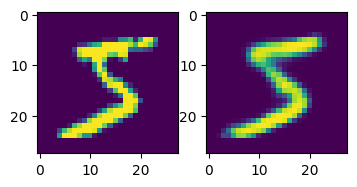

 72%|███████▏  | 36/50 [05:45<02:14,  9.61s/it]

epoch:35, cur train loss: 96.34558121736116, curr test loss: 88.84264084055454


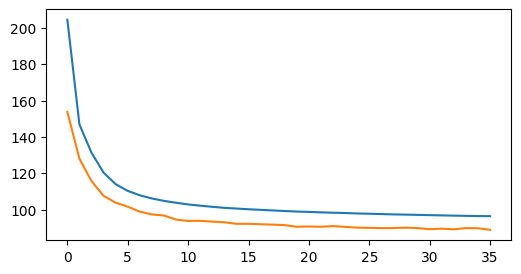

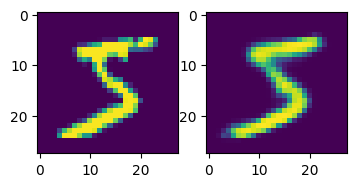

 74%|███████▍  | 37/50 [05:55<02:04,  9.60s/it]

epoch:36, cur train loss: 96.23027394829528, curr test loss: 89.64515975759


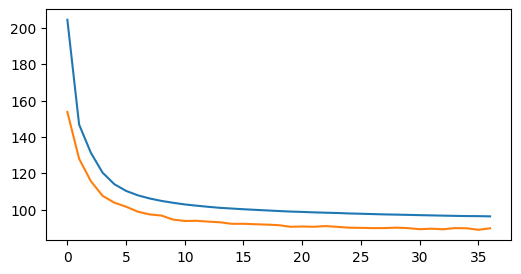

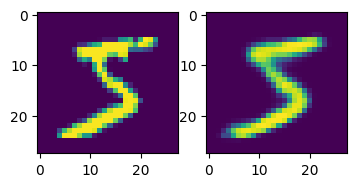

 76%|███████▌  | 38/50 [06:04<01:55,  9.59s/it]

epoch:37, cur train loss: 96.08702079268662, curr test loss: 88.6533944818038


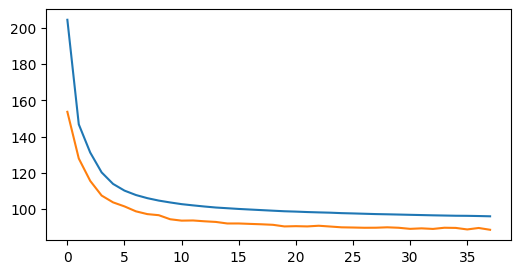

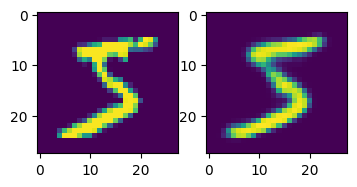

 78%|███████▊  | 39/50 [06:14<01:45,  9.58s/it]

epoch:38, cur train loss: 96.01103550437162, curr test loss: 88.82313045067123


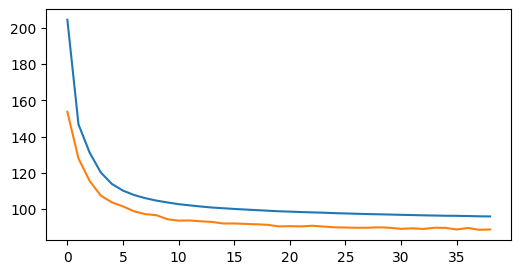

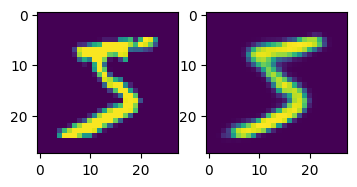

 80%|████████  | 40/50 [06:23<01:35,  9.59s/it]

epoch:39, cur train loss: 95.9100205964371, curr test loss: 88.73387986195239


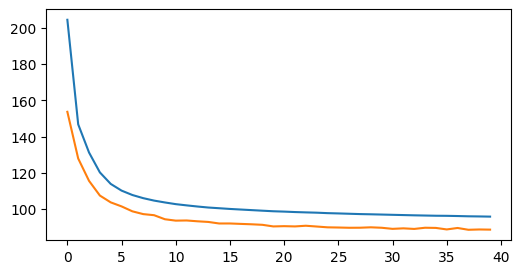

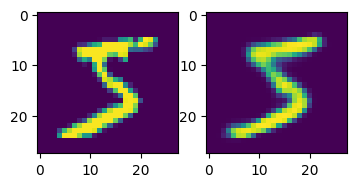

 82%|████████▏ | 41/50 [06:33<01:26,  9.59s/it]

epoch:40, cur train loss: 95.85840762856164, curr test loss: 89.48455491850648


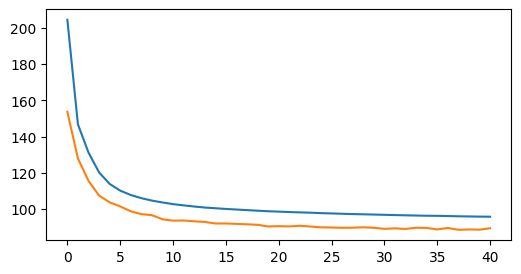

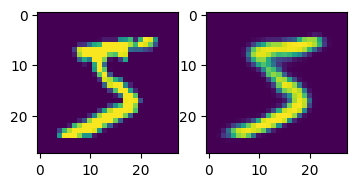

 84%|████████▍ | 42/50 [06:43<01:16,  9.59s/it]

epoch:41, cur train loss: 95.73461411400899, curr test loss: 88.51104591466203


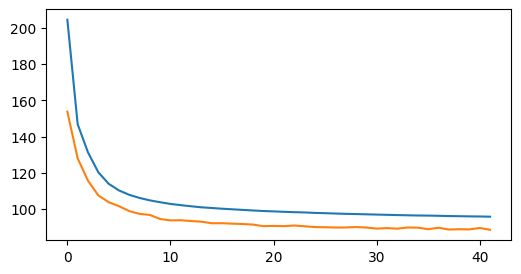

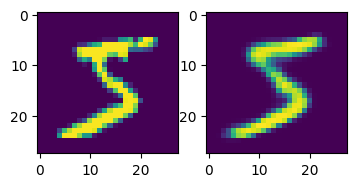

 86%|████████▌ | 43/50 [06:52<01:07,  9.67s/it]

epoch:42, cur train loss: 95.65744983209476, curr test loss: 88.83175668837148


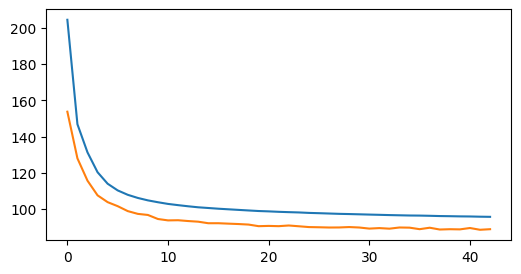

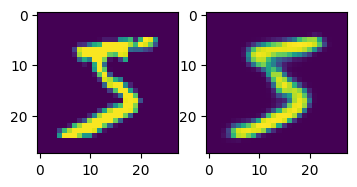

 88%|████████▊ | 44/50 [07:02<00:57,  9.65s/it]

epoch:43, cur train loss: 95.59585779511345, curr test loss: 88.59615248668042


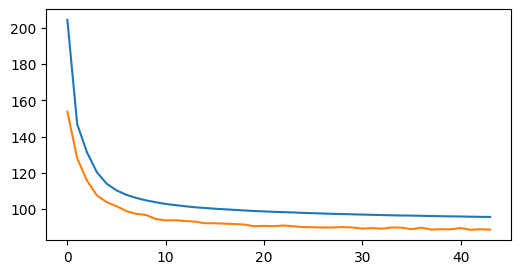

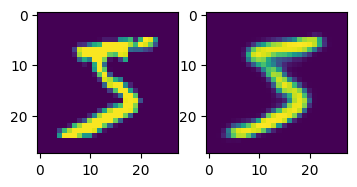

 90%|█████████ | 45/50 [07:12<00:48,  9.65s/it]

epoch:44, cur train loss: 95.49495047953592, curr test loss: 88.60717068442816


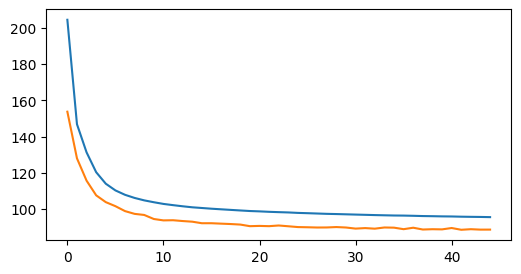

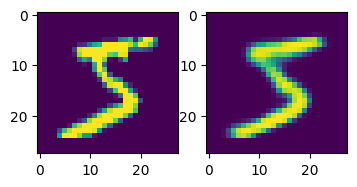

 92%|█████████▏| 46/50 [07:21<00:38,  9.65s/it]

epoch:45, cur train loss: 95.43452940007516, curr test loss: 88.66880730737614


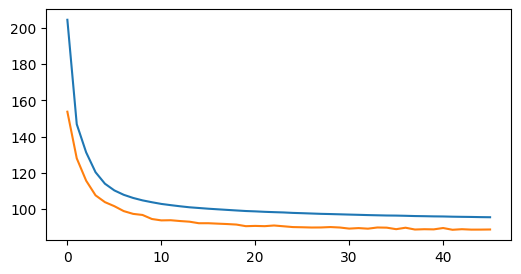

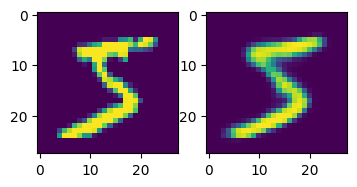

 94%|█████████▍| 47/50 [07:31<00:28,  9.64s/it]

epoch:46, cur train loss: 95.3658575452467, curr test loss: 88.15859869462025


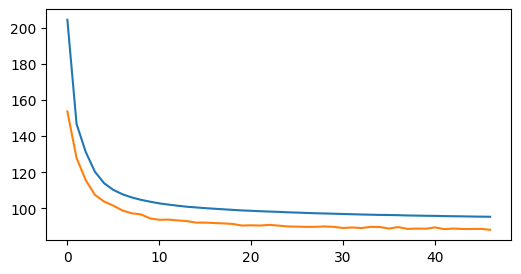

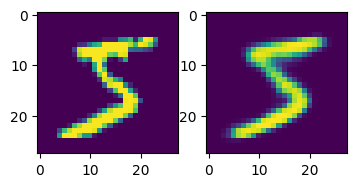

 96%|█████████▌| 48/50 [07:41<00:19,  9.68s/it]

epoch:47, cur train loss: 95.30019308712437, curr test loss: 88.28125106232076


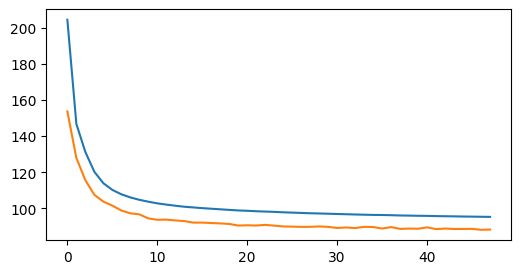

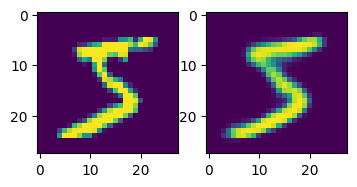

 98%|█████████▊| 49/50 [07:50<00:09,  9.66s/it]

epoch:48, cur train loss: 95.21285508080587, curr test loss: 88.48856015748615


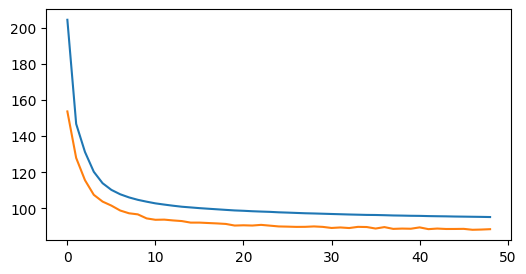

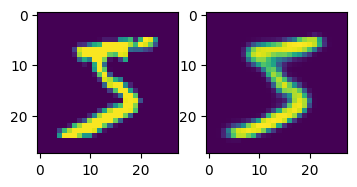

100%|██████████| 50/50 [08:00<00:00,  9.61s/it]

epoch:49, cur train loss: 95.13319658877245, curr test loss: 88.54530817345727


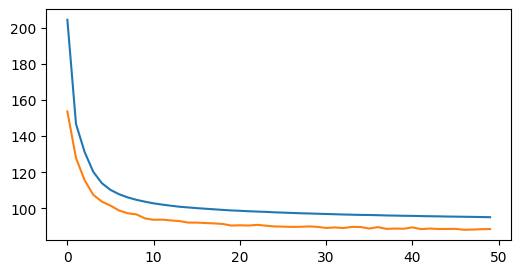

In [31]:
from tqdm import tqdm
epoch = 50
train_loss = []
test_loss = []
val_vis = train_dataset[0][0].unsqueeze(0).to(device)   
for i in tqdm(range(epoch)):
    model.train()
    epoch_loss = {'train': [], 'test': []}
    
    for batch in train_loader:
        optimizer.zero_grad()
        batch = batch[0].to(device)

        mu, logsigma, recon = model(batch) 
        loss = criterion(batch, mu, logsigma, recon)

        loss.backward()
        optimizer.step()
        epoch_loss['train'].append(loss.item())
    eplosstr = np.mean(epoch_loss['train'])
    train_loss.append(eplosstr)

    model.eval()
    for batch in test_loader:
        with torch.no_grad():
            batch = batch[0].to(device)
            mu, logsigma, recon = model(batch) 
            loss = criterion(batch, mu, logsigma, recon)
            epoch_loss['test'].append(loss.item())
    eplosstest = np.mean(epoch_loss['test'])
    test_loss.append(eplosstest)

    with torch.no_grad():
        _, _, recon_vis = model(val_vis)
        
    fig, axes = plt.subplots(1, 2, figsize=(4,2))
    axes[0].imshow(val_vis[0].cpu().permute(1,2,0).clamp(0,1))
    axes[1].imshow(recon_vis[0].cpu().permute(1,2,0).clamp(0,1))
    plt.show()

    plt.figure(figsize=(6,3))
    plt.plot(train_loss, label='train')
    plt.plot(test_loss, label='val')


    
    print(f'epoch:{i}, cur train loss: {eplosstr}, curr test loss: {eplosstest}')

Давайте посмотрим, как наш тренированный VAE кодирует и восстанавливает картинки:

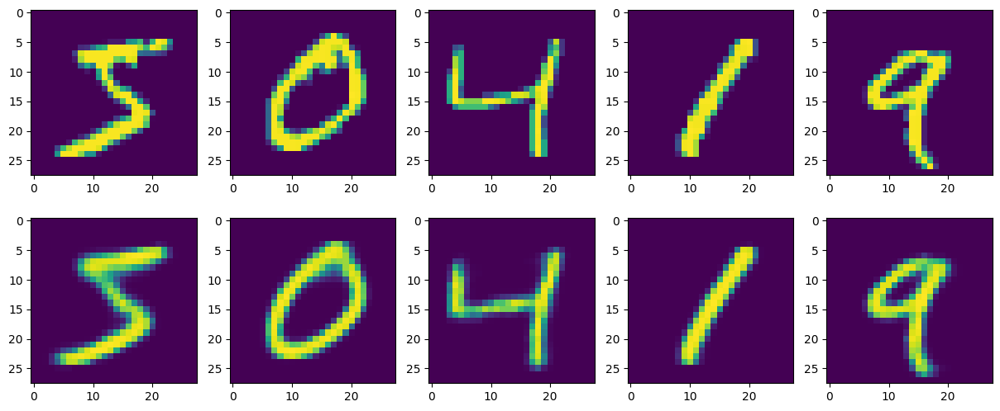

In [33]:
model.eval()
images = torch.stack([train_dataset[i][0] for i in range(5)]).to(device)

val_subset =images.to(device)
with torch.no_grad():
    _, _, recon_subset = model(val_subset)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i in range(5):
    axes[0, i].imshow(val_subset[i].cpu().permute(1, 2, 0).clamp(0, 1))
    axes[1, i].imshow(recon_subset[i].cpu().permute(1, 2, 0).clamp(0, 1))

plt.show()

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

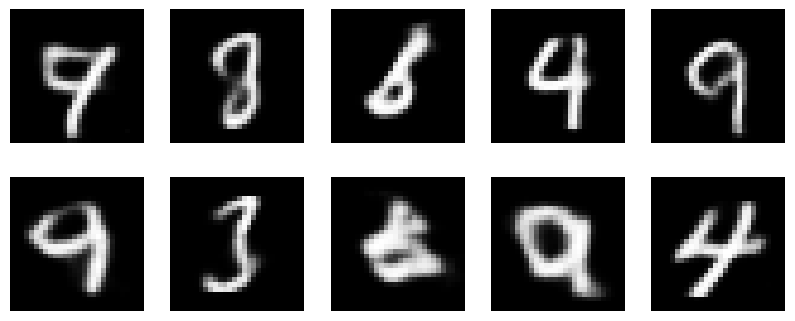

In [37]:
# вспомните про замечание из этого же пункта обычного AE про распределение латентных переменных
#в лекциях говорилось, что vae итак подогнан под нормальное распределение


latent_dim = 128
z = torch.randn(10, latent_dim).to(device)

with torch.no_grad():
    fake = model.decode(z) 


fig, axes = plt.subplots(2, 5, figsize=(10, 4))
for i, ax in enumerate(axes.flat):
    ax.imshow(fake[i].cpu().squeeze(), cmap='gray')  
    ax.axis('off')
plt.show()

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок лиц выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве.

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве.

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

In [63]:

# судя по всему про лица опечатка


from sklearn.manifold import TSNE

model.eval()
latent_vectors = []
labels = []         


with torch.no_grad():
    for batch_x, batch_y in test_loader: 
        x = batch_x.to(device)
        mu, _, _ = model(x)               
        latent_vectors.append(mu.cpu().numpy())
        labels.append(batch_y.numpy())

latent_vectors = np.concatenate(latent_vectors, axis=0)
labels = np.concatenate(labels, axis=0)

In [64]:
tsne = TSNE(n_components=2)
latent_2d = tsne.fit_transform(latent_vectors)

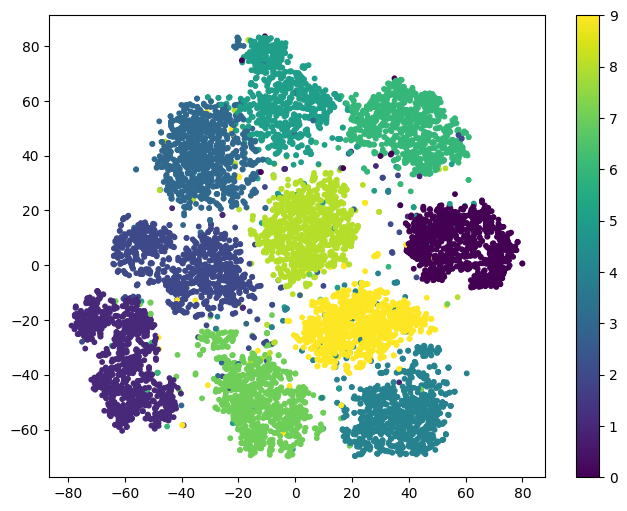

In [65]:

plt.figure(figsize=(8,6))
scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels, s=10)
plt.colorbar(scatter)

Что вы думаете о виде латентного представления?

# Видно чёткое разделений латентных представлений на группы по классам

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер.
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица).
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки.

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

In [112]:
class CVAE(nn.Module):
    def __init__(self, latent_dim = 128, num_classes = 10):
        super(CVAE, self).__init__()

        self.num_classes = num_classes

        self.enc = nn.Sequential(
            nn.Conv2d(1 + num_classes, 32, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(64 * 7 * 7, 512), 
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(512, latent_dim)
        self.fc_logsigma = nn.Linear(512, latent_dim)
        

        self.decoder_input = nn.Sequential(
            nn.Linear(latent_dim + num_classes, 512),
            nn.ReLU()
        )
        self.dec = nn.Sequential(
            nn.Linear(512, 64 * 7 * 7), 
            nn.ReLU(),
            nn.Unflatten(1, (64, 7, 7)),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1), 
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, 3, stride=2, padding=1, output_padding=1), 
            nn.Sigmoid()
        )


    def onehot(self, class_num):
        onehot = F.one_hot(class_num, num_classes=self.num_classes).float()
        onehot = onehot.view(-1, self.num_classes, 1, 1).expand(-1, -1, 28, 28)
        return onehot
        
    def encode(self, x, class_num):
        onehot = self.onehot(class_num)
        x = torch.cat([x, onehot], dim=1)
        x = self.enc(x)
        mu = self.fc_mu(x)
        logsigma = self.fc_logsigma(x)
        return mu, logsigma, onehot

        

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            sigma = torch.exp(0.5*logsigma)############
            
            eps = torch.randn_like(sigma)
            return mu + eps * sigma

        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu.
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu

    def decode(self, z, onehot):
        class_vec = onehot.mean(dim=[2, 3]) 
        z = torch.cat([z, class_vec], dim=1) 
        reconstruction = self.decoder_input(z)
        reconstruction = self.dec(reconstruction)
        return reconstruction




    def forward(self, x, class_num):
        mu, logsigma, onehot = self.encode(x, class_num)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z, onehot)
        return mu, logsigma, reconstruction

In [113]:
batch_size = 128
# MNIST Dataset
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

In [114]:
criterion = loss_vae

model = CVAE().to(device)

optimizer = optim.Adam(model.parameters(), lr = 3e-4 )

  0%|          | 0/50 [00:00<?, ?it/s]

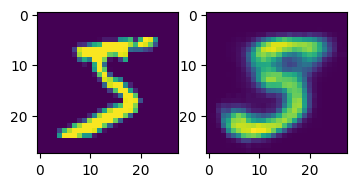

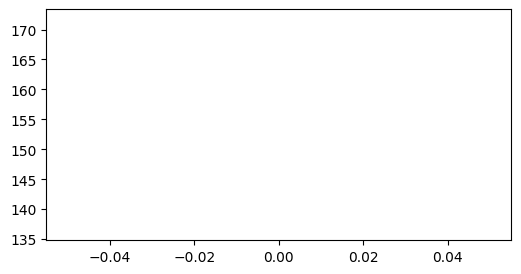

  2%|▏         | 1/50 [00:09<07:42,  9.44s/it]

epoch:0, cur train loss: 171.6279, curr test loss: 136.5740


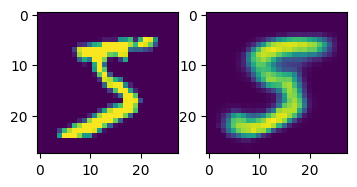

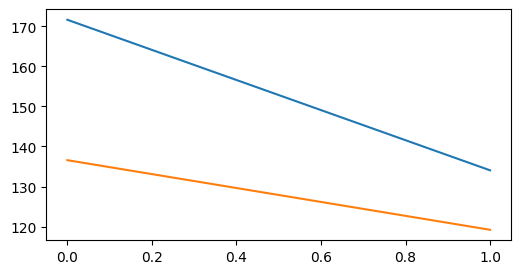

  4%|▍         | 2/50 [00:18<07:33,  9.44s/it]

epoch:1, cur train loss: 134.0407, curr test loss: 119.1961


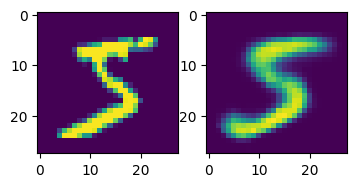

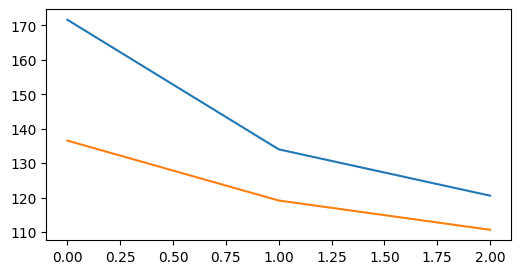

  6%|▌         | 3/50 [00:28<07:24,  9.46s/it]

epoch:2, cur train loss: 120.6051, curr test loss: 110.7054


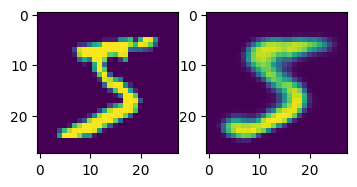

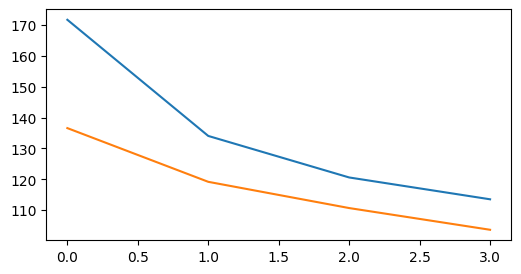

  8%|▊         | 4/50 [00:37<07:16,  9.48s/it]

epoch:3, cur train loss: 113.5422, curr test loss: 103.6795


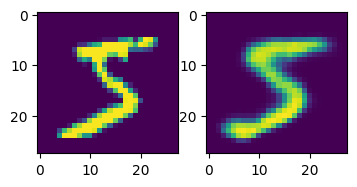

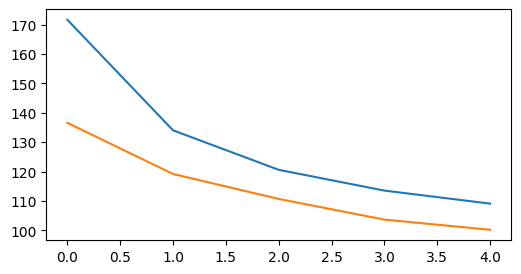

 10%|█         | 5/50 [00:47<07:06,  9.47s/it]

epoch:4, cur train loss: 109.1171, curr test loss: 100.2202


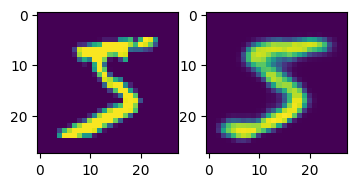

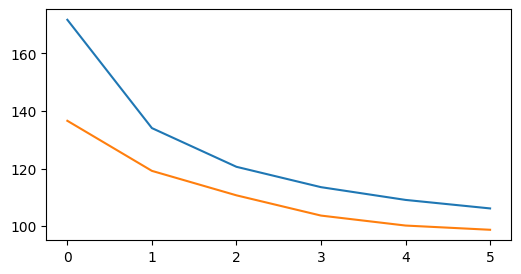

 12%|█▏        | 6/50 [00:56<06:55,  9.45s/it]

epoch:5, cur train loss: 106.1636, curr test loss: 98.7537


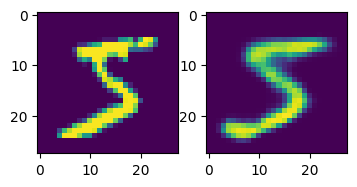

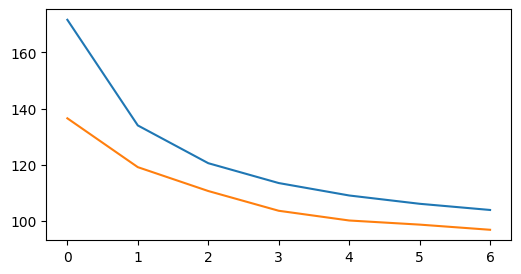

 14%|█▍        | 7/50 [01:06<06:49,  9.53s/it]

epoch:6, cur train loss: 103.9624, curr test loss: 96.9172


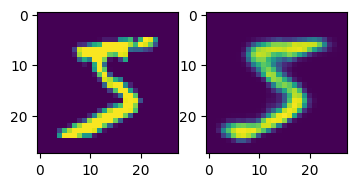

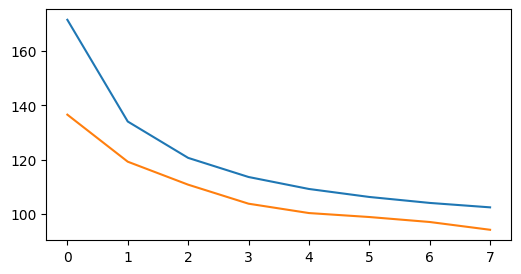

 16%|█▌        | 8/50 [01:15<06:39,  9.51s/it]

epoch:7, cur train loss: 102.3275, curr test loss: 94.0411


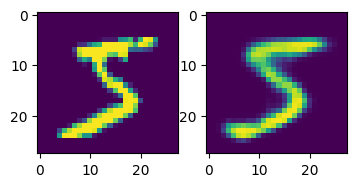

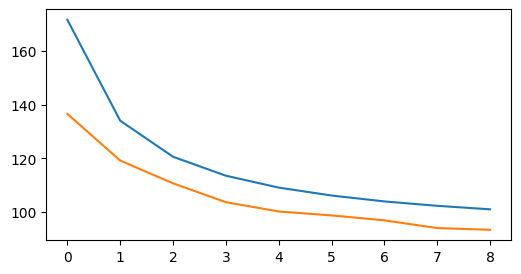

 18%|█▊        | 9/50 [01:25<06:29,  9.49s/it]

epoch:8, cur train loss: 101.0212, curr test loss: 93.4017


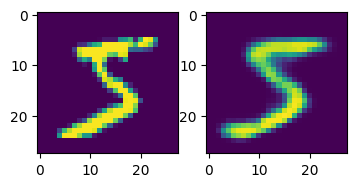

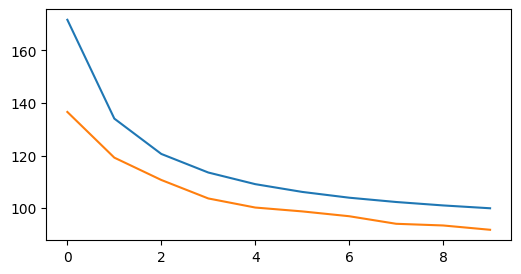

 20%|██        | 10/50 [01:34<06:19,  9.49s/it]

epoch:9, cur train loss: 99.9439, curr test loss: 91.7635


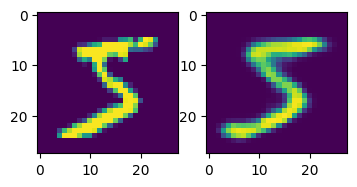

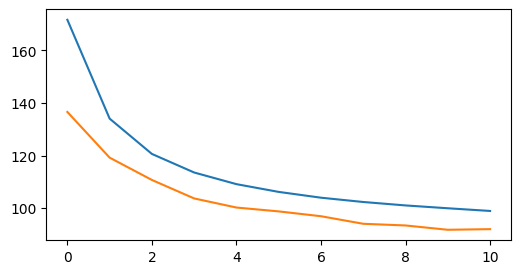

 22%|██▏       | 11/50 [01:44<06:09,  9.48s/it]

epoch:10, cur train loss: 98.9209, curr test loss: 92.0035


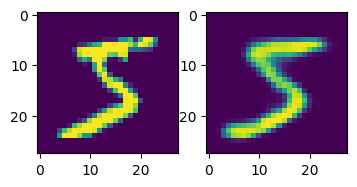

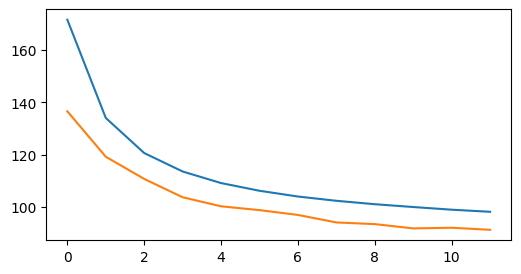

 24%|██▍       | 12/50 [01:53<05:59,  9.47s/it]

epoch:11, cur train loss: 98.1194, curr test loss: 91.2325


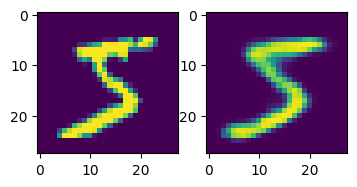

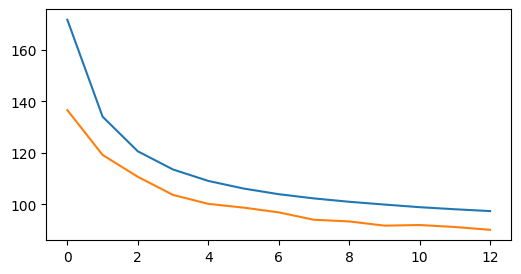

 26%|██▌       | 13/50 [02:03<05:49,  9.44s/it]

epoch:12, cur train loss: 97.4092, curr test loss: 90.1578


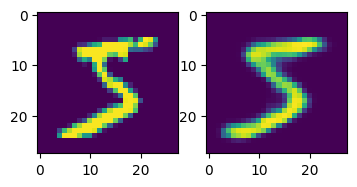

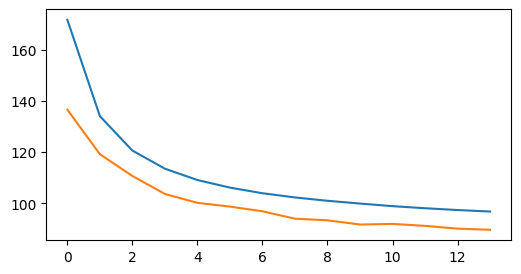

 28%|██▊       | 14/50 [02:12<05:39,  9.43s/it]

epoch:13, cur train loss: 96.8277, curr test loss: 89.7117


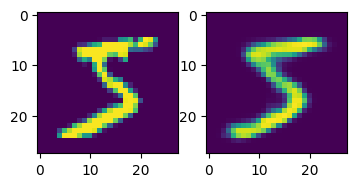

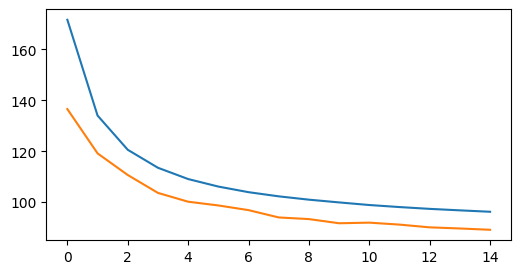

 30%|███       | 15/50 [02:21<05:30,  9.43s/it]

epoch:14, cur train loss: 96.2745, curr test loss: 89.2042


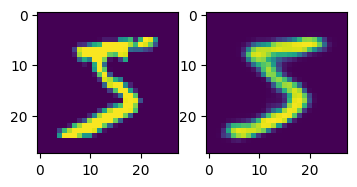

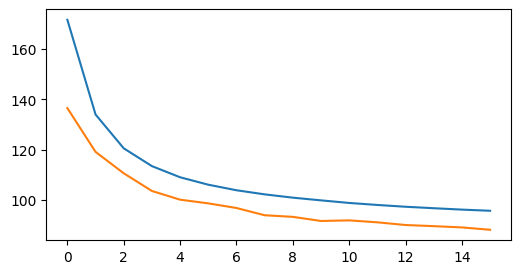

 32%|███▏      | 16/50 [02:31<05:20,  9.43s/it]

epoch:15, cur train loss: 95.8177, curr test loss: 88.2708


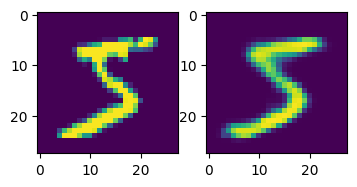

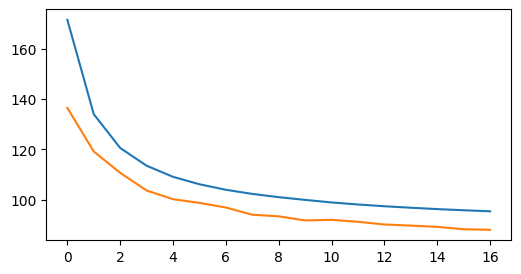

 34%|███▍      | 17/50 [02:40<05:12,  9.47s/it]

epoch:16, cur train loss: 95.4033, curr test loss: 88.0478


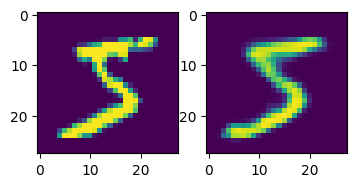

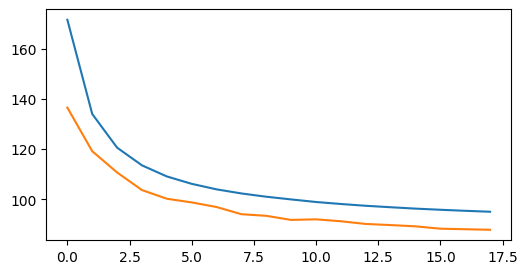

 36%|███▌      | 18/50 [02:50<05:02,  9.46s/it]

epoch:17, cur train loss: 95.0292, curr test loss: 87.8332


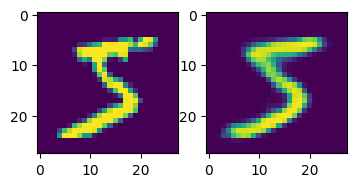

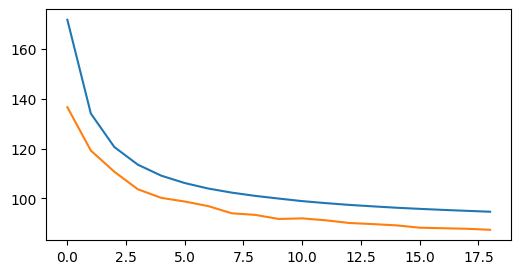

 38%|███▊      | 19/50 [02:59<04:52,  9.43s/it]

epoch:18, cur train loss: 94.6693, curr test loss: 87.4301


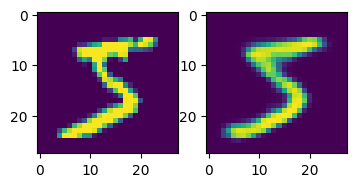

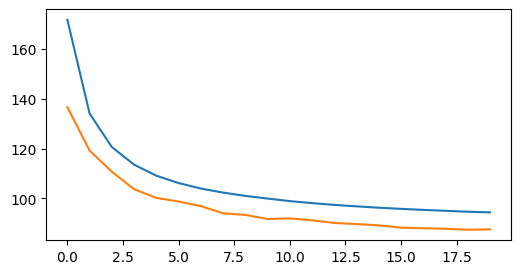

 40%|████      | 20/50 [03:09<04:41,  9.39s/it]

epoch:19, cur train loss: 94.4019, curr test loss: 87.6284


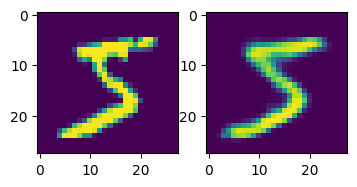

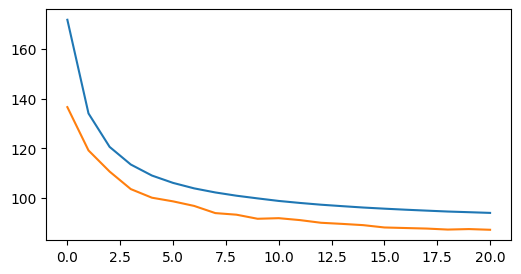

 42%|████▏     | 21/50 [03:18<04:33,  9.42s/it]

epoch:20, cur train loss: 94.1214, curr test loss: 87.3464


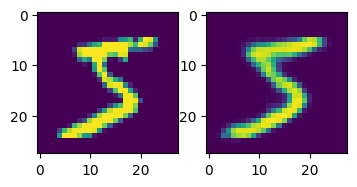

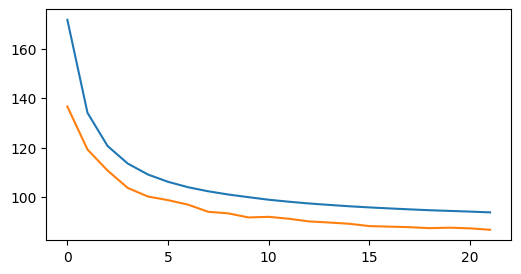

 44%|████▍     | 22/50 [03:28<04:24,  9.44s/it]

epoch:21, cur train loss: 93.8138, curr test loss: 86.7773


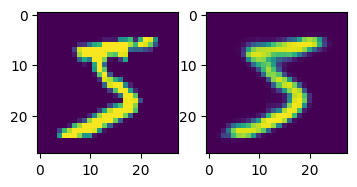

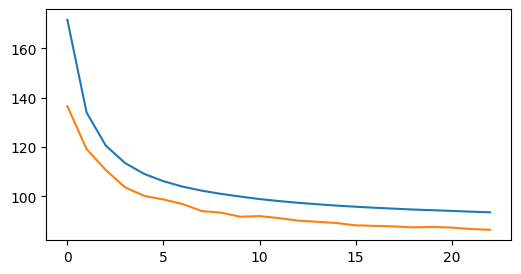

 46%|████▌     | 23/50 [03:37<04:14,  9.41s/it]

epoch:22, cur train loss: 93.5589, curr test loss: 86.4657


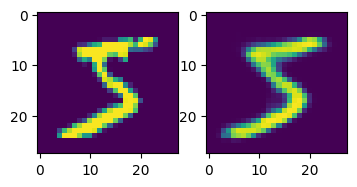

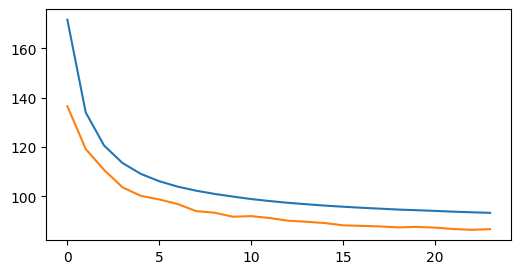

 48%|████▊     | 24/50 [03:46<04:04,  9.40s/it]

epoch:23, cur train loss: 93.3330, curr test loss: 86.7161


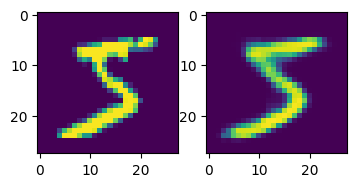

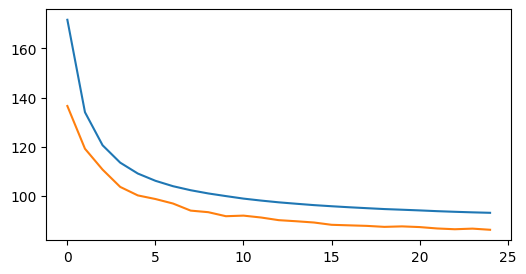

 50%|█████     | 25/50 [03:56<03:55,  9.43s/it]

epoch:24, cur train loss: 93.1469, curr test loss: 86.2477


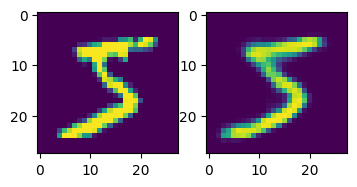

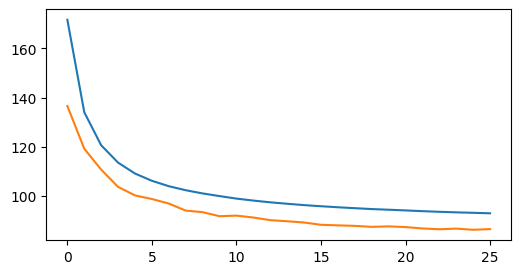

 52%|█████▏    | 26/50 [04:05<03:46,  9.42s/it]

epoch:25, cur train loss: 92.9438, curr test loss: 86.5276


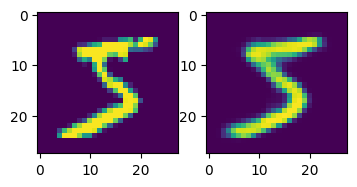

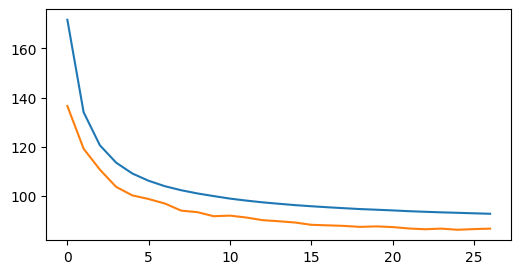

 54%|█████▍    | 27/50 [04:15<03:37,  9.44s/it]

epoch:26, cur train loss: 92.7537, curr test loss: 86.7055


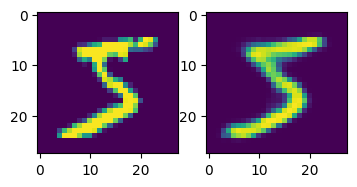

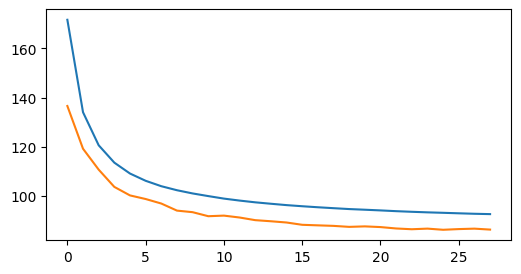

 56%|█████▌    | 28/50 [04:24<03:28,  9.46s/it]

epoch:27, cur train loss: 92.6141, curr test loss: 86.3253


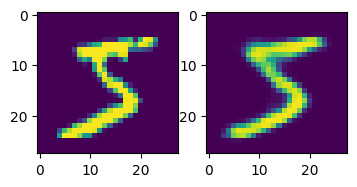

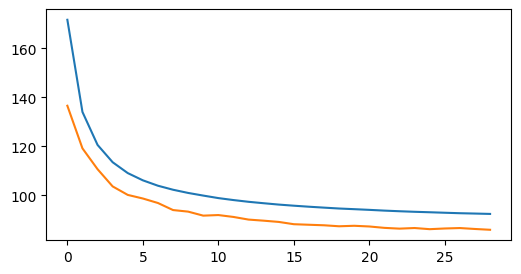

 58%|█████▊    | 29/50 [04:34<03:18,  9.47s/it]

epoch:28, cur train loss: 92.4650, curr test loss: 86.0004


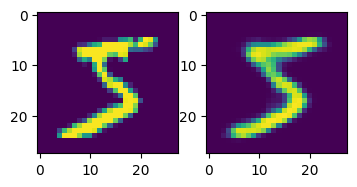

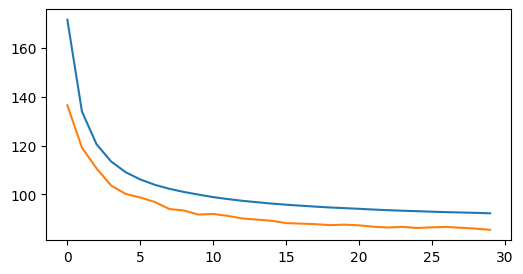

 60%|██████    | 30/50 [04:43<03:10,  9.54s/it]

epoch:29, cur train loss: 92.2713, curr test loss: 85.5232


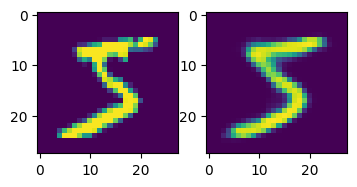

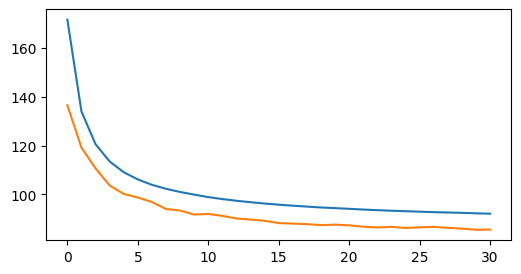

 62%|██████▏   | 31/50 [04:53<03:00,  9.52s/it]

epoch:30, cur train loss: 92.1197, curr test loss: 85.5938


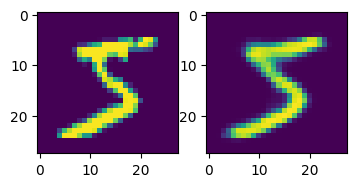

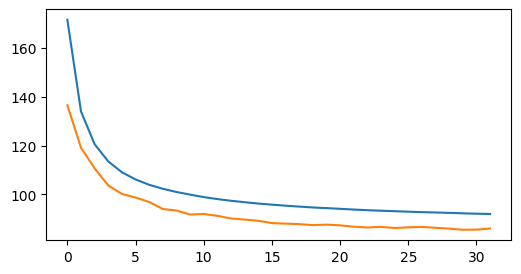

 64%|██████▍   | 32/50 [05:02<02:51,  9.54s/it]

epoch:31, cur train loss: 92.0003, curr test loss: 86.0392


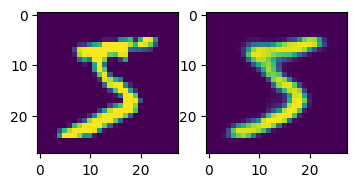

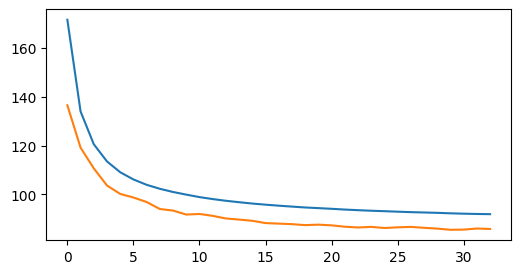

 66%|██████▌   | 33/50 [05:12<02:41,  9.51s/it]

epoch:32, cur train loss: 91.9235, curr test loss: 85.8556


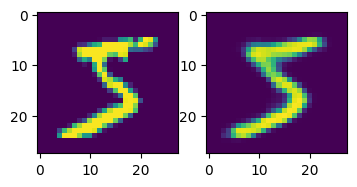

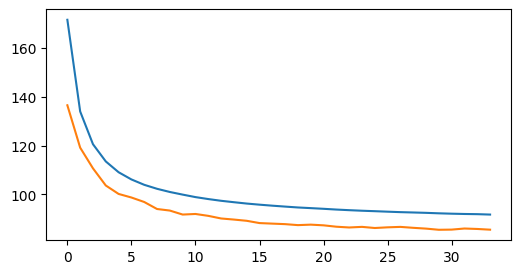

 68%|██████▊   | 34/50 [05:21<02:32,  9.50s/it]

epoch:33, cur train loss: 91.7604, curr test loss: 85.5648


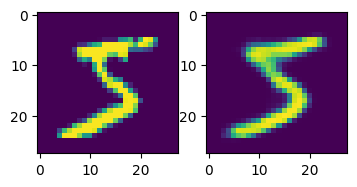

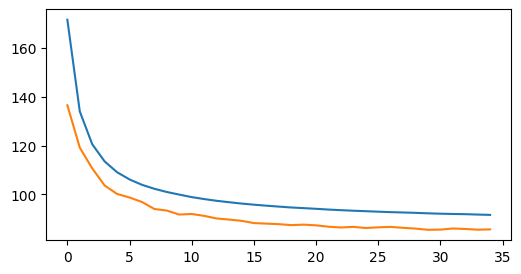

 70%|███████   | 35/50 [05:31<02:22,  9.50s/it]

epoch:34, cur train loss: 91.6280, curr test loss: 85.6857


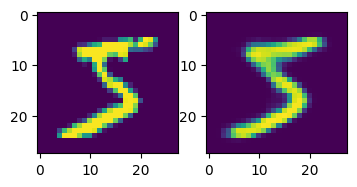

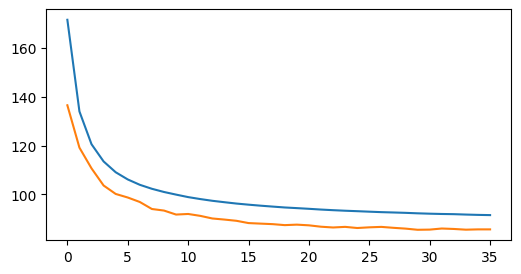

 72%|███████▏  | 36/50 [05:40<02:12,  9.47s/it]

epoch:35, cur train loss: 91.5401, curr test loss: 85.6848


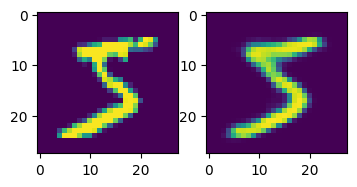

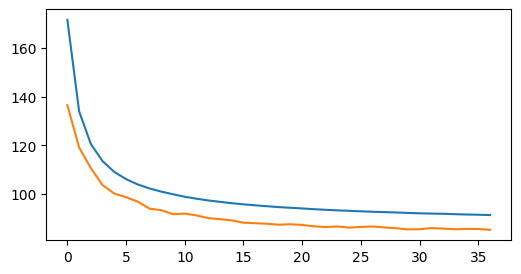

 74%|███████▍  | 37/50 [05:50<02:02,  9.45s/it]

epoch:36, cur train loss: 91.4001, curr test loss: 85.3554


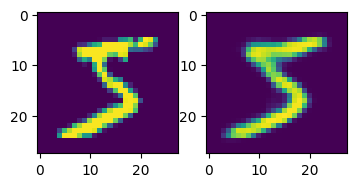

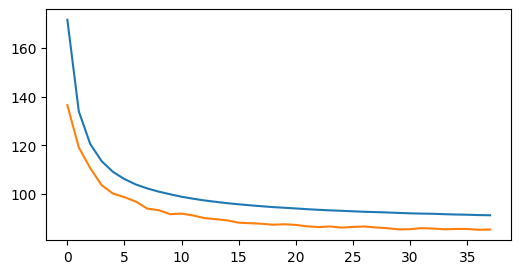

 76%|███████▌  | 38/50 [05:59<01:53,  9.45s/it]

epoch:37, cur train loss: 91.3160, curr test loss: 85.4528


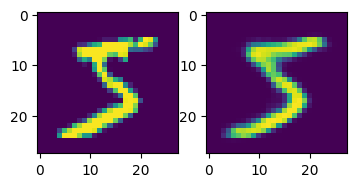

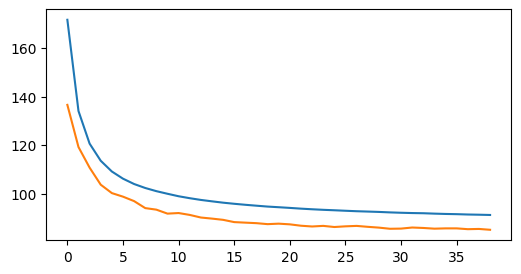

 78%|███████▊  | 39/50 [06:09<01:44,  9.46s/it]

epoch:38, cur train loss: 91.2099, curr test loss: 85.1091


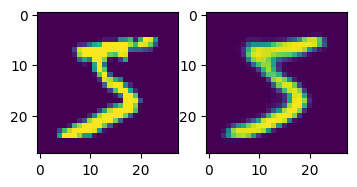

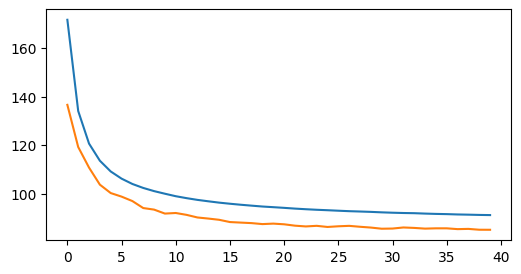

 80%|████████  | 40/50 [06:18<01:34,  9.47s/it]

epoch:39, cur train loss: 91.1417, curr test loss: 85.0882


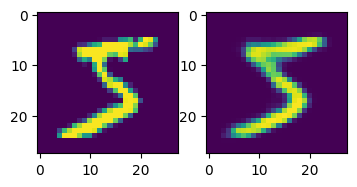

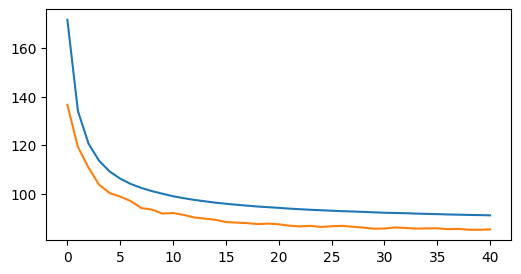

 82%|████████▏ | 41/50 [06:28<01:25,  9.48s/it]

epoch:40, cur train loss: 91.0377, curr test loss: 85.2479


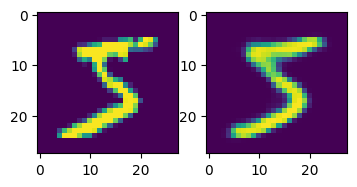

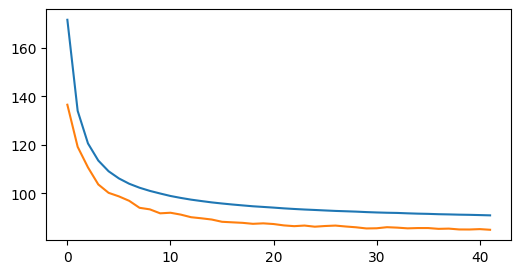

 84%|████████▍ | 42/50 [06:37<01:15,  9.49s/it]

epoch:41, cur train loss: 90.9254, curr test loss: 84.9738


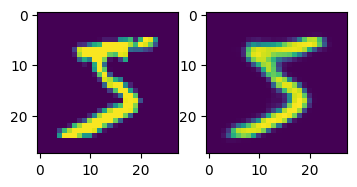

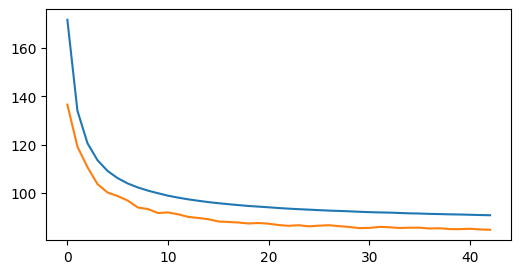

 86%|████████▌ | 43/50 [06:46<01:06,  9.46s/it]

epoch:42, cur train loss: 90.8438, curr test loss: 84.8279


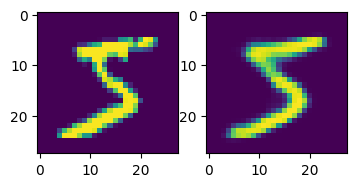

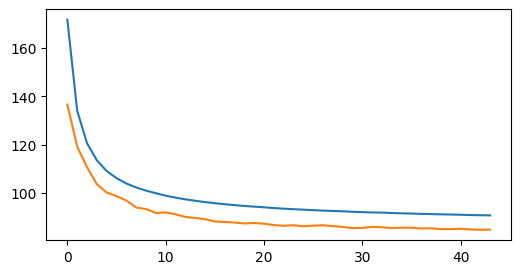

 88%|████████▊ | 44/50 [06:56<00:56,  9.43s/it]

epoch:43, cur train loss: 90.7743, curr test loss: 84.9007


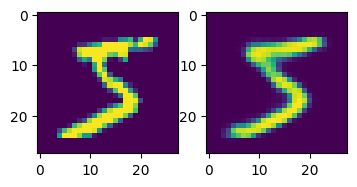

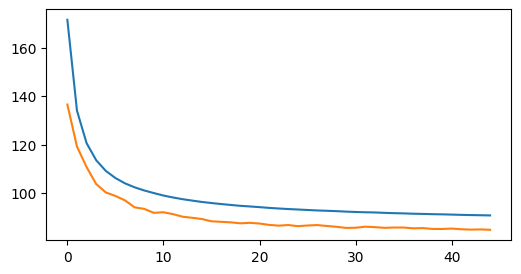

 90%|█████████ | 45/50 [07:05<00:47,  9.44s/it]

epoch:44, cur train loss: 90.7008, curr test loss: 84.7571


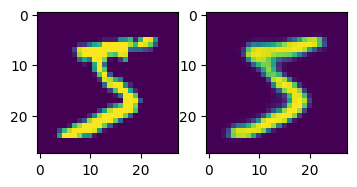

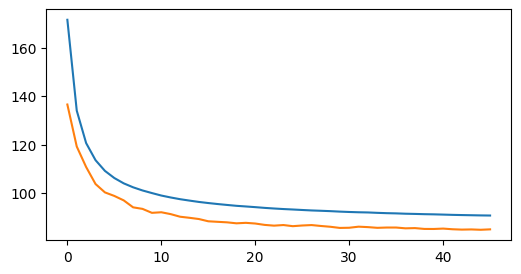

 92%|█████████▏| 46/50 [07:15<00:37,  9.45s/it]

epoch:45, cur train loss: 90.6531, curr test loss: 84.9310


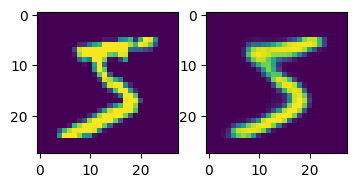

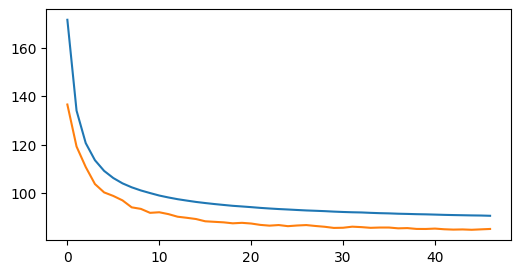

 94%|█████████▍| 47/50 [07:24<00:28,  9.45s/it]

epoch:46, cur train loss: 90.5458, curr test loss: 85.0950


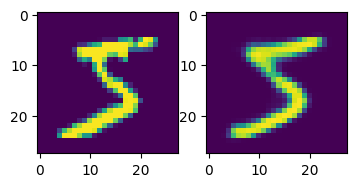

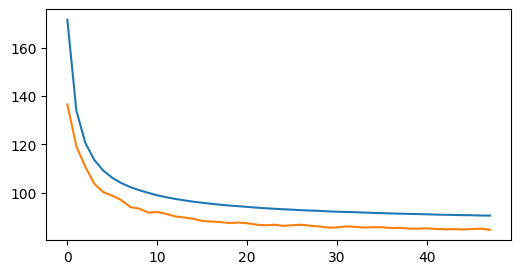

 96%|█████████▌| 48/50 [07:34<00:18,  9.45s/it]

epoch:47, cur train loss: 90.4911, curr test loss: 84.6358


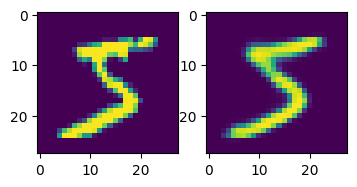

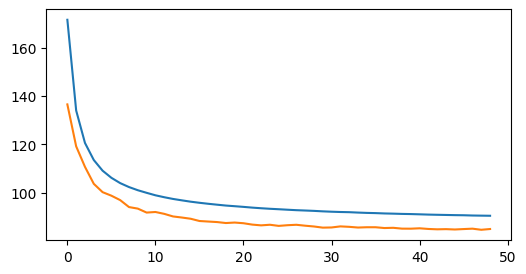

 98%|█████████▊| 49/50 [07:43<00:09,  9.43s/it]

epoch:48, cur train loss: 90.4424, curr test loss: 84.9507


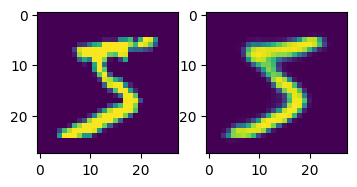

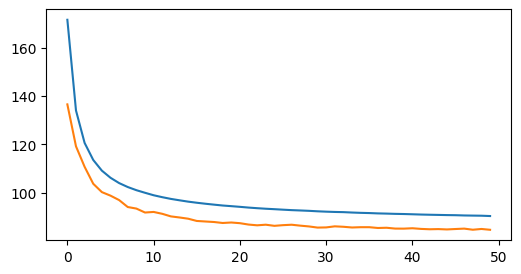

100%|██████████| 50/50 [07:52<00:00,  9.46s/it]

epoch:49, cur train loss: 90.3088, curr test loss: 84.6146


In [116]:
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt

epoch = 50
train_loss = []
test_loss = []


val_img, val_label = train_dataset[0]
val_vis = val_img.unsqueeze(0).to(device)           
val_label = torch.tensor([val_label]).to(device)    

for i in tqdm(range(epoch)):
    model.train()
    epoch_loss = {'train': [], 'test': []}

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        mu, logsigma, recon = model(images, labels)
        loss = criterion(images, mu, logsigma, recon)  
        loss.backward()
        optimizer.step()
        epoch_loss['train'].append(loss.item())

    train_loss.append(np.mean(epoch_loss['train']))

    model.eval()
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        with torch.no_grad():
            mu, logsigma, recon = model(images, labels)
            loss = criterion(images, mu, logsigma, recon)   
            epoch_loss['test'].append(loss.item())

    test_loss.append(np.mean(epoch_loss['test']))

  
    with torch.no_grad():
        _, _, recon_vis = model(val_vis, val_label)

    fig, axes = plt.subplots(1, 2, figsize=(4, 2))
    axes[0].imshow(val_vis[0].cpu().squeeze())
    axes[1].imshow(recon_vis[0].cpu().squeeze())

   
    plt.show()

    plt.figure(figsize=(6, 3))
    plt.plot(train_loss, label='train')
    plt.plot(test_loss, label='val')

    plt.show()

    print(f'epoch:{i}, cur train loss: {train_loss[-1]:.4f}, curr test loss: {test_loss[-1]:.4f}')

### Sampling


Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

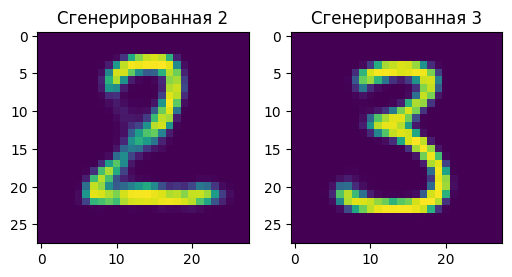

In [127]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

latent_dim = 128
z = torch.randn(1, latent_dim).to(device) 

def generate_digit(model, z, class_idx):
    num_classes = model.num_classes
    onehot = F.one_hot(torch.tensor([class_idx]), num_classes=num_classes).float()
    onehot = onehot.view(1, num_classes, 1, 1).expand(-1, -1, 28, 28).to(device)
    with torch.no_grad():
        reconstruction = model.decode(z, onehot) 
    return reconstruction.squeeze().cpu().numpy()

# Пример: генерируем 5 и 7
digit_5 = generate_digit(model, z, 2)
digit_7 = generate_digit(model, z, 3)

# Визуализация
fig, axes = plt.subplots(1, 2, figsize=(6, 3))
axes[0].imshow(digit_5)
axes[0].set_title('Сгенерированная 2')
axes[1].imshow(digit_7)
axes[1].set_title('Сгенерированная 3')

plt.show()

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.

In [128]:
latent_vectors = []
labels_list = []


model.eval()

with torch.no_grad():
    for batch_x, batch_y in test_loader:
        x = batch_x.to(device)
        y = batch_y.to(device)

        mu, _, _ = model.encode(x, y)  
        latent_vectors.append(mu.cpu().numpy())
        labels_list.append(batch_y.numpy()) 

latent_vectors = np.concatenate(latent_vectors, axis=0)
labels = np.concatenate(labels_list, axis=0)


tsne = TSNE(n_components=2)
latent_2d = tsne.fit_transform(latent_vectors)



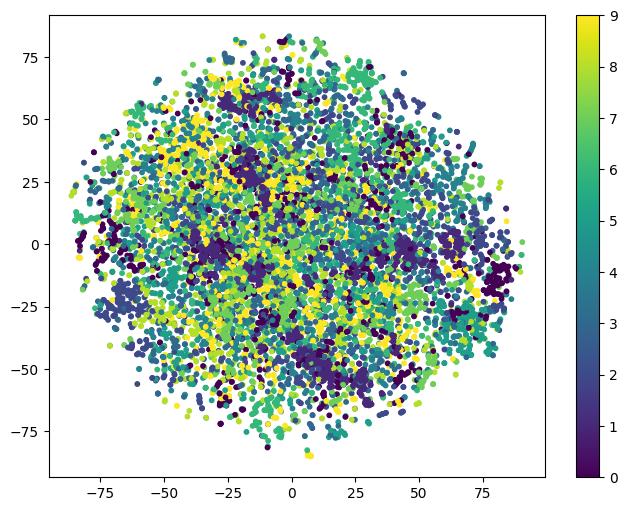

In [129]:

plt.figure(figsize=(8,6))
scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels, s=10)
plt.colorbar(scatter)

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?

# Я переопределял модели, поэтому построить графики рядом не получится, но сразу видно отличия 

# На граике видно, что латентные представления картинок распределены равномерно, скорее всего это из-за того, что модели не нужно выучивать какой именно это класс, ведь мы передаём его явно

# BONUS 1: Denoising (2 балла)



У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума.
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

<a href="https://ibb.co/YbRJ1nZ"><img src="https://i.ibb.co/0QD164t/Screen-Shot-2020-06-04-at-4-49-50-PM.png" alt="Screen-Shot-2020-06-04-at-4-49-50-PM" border="0"></a>

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом.

В питоне шум можно добавить так:

In [146]:

#X_noisy = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape)

In [148]:
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(images, test_size = 0.05, shuffle = True) # 750 на тест
X_train_tensor = torch.tensor(X_train.transpose(0, 3, 1, 2), dtype=torch.float32) / 255.0
X_test_tensor   = torch.tensor(X_test.transpose(0, 3, 1, 2), dtype=torch.float32) / 255.0

from torch.utils.data import TensorDataset, DataLoader
batch_size = 32
train_dataset = TensorDataset(X_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True )
test_dataset = TensorDataset(X_test_tensor)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = True )


In [163]:
#просто убрал уменьшение размерности картинки
class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()

        
        self.enc = nn.Sequential(
            nn.Conv2d(3, 16, 3, padding = 1),
            nn.ReLU(),
            nn.Conv2d(16, 32, 3, padding = 1), 
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, padding = 1), 
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, padding = 1), 
            nn.ReLU(),
                       #    output_padding=1 
        )
        
        self.dec = nn.Sequential(
            nn.ConvTranspose2d(128, 128, 3, padding = 1), 
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 3, padding = 1), 
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, padding = 1), 
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 3, padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3, 3, padding = 1),
            nn.Sigmoid(),
            
        )

    def forward(self, x):
        latent_code = self.enc(x)
        reconstruction = self.dec(latent_code)
        # реализуйте forward проход автоэнкодера
        # в качестве возвращаемых переменных -- латентное представление картинки (latent_code)
        # и полученная реконструкция изображения (reconstruction)

        return reconstruction, latent_code

    

In [164]:
import torch.optim as optim

criterion = nn.MSELoss()

model = Autoencoder().to(device)

optimizer = optim.Adam(model.parameters(), lr = 3e-4 )


  0%|          | 0/25 [00:00<?, ?it/s]

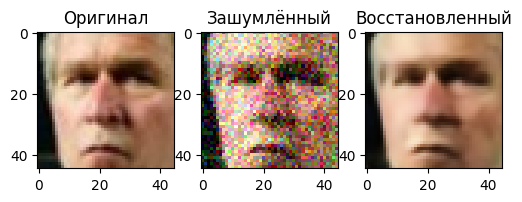

  4%|▍         | 1/25 [00:13<05:25, 13.57s/it]

epoch:0, cur train loss: 0.0015665828161027348, curr test loss: 0.0015510372662295897


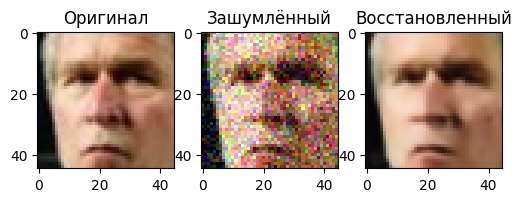

  8%|▊         | 2/25 [00:27<05:10, 13.49s/it]

epoch:1, cur train loss: 0.001530778476113306, curr test loss: 0.001526303334339034


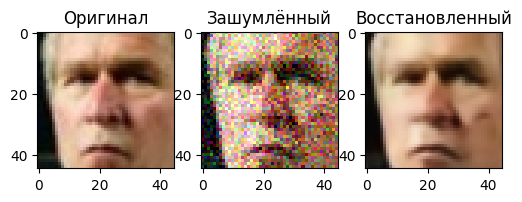

 12%|█▏        | 3/25 [00:40<04:55, 13.42s/it]

epoch:2, cur train loss: 0.001522913053834244, curr test loss: 0.0015104082080402545


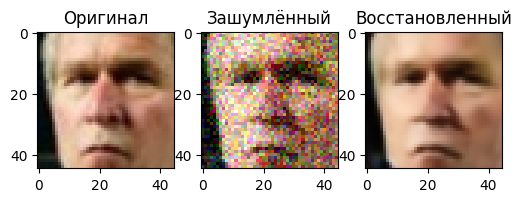

 16%|█▌        | 4/25 [00:53<04:41, 13.41s/it]

epoch:3, cur train loss: 0.0015004050704743475, curr test loss: 0.0014931423744807641


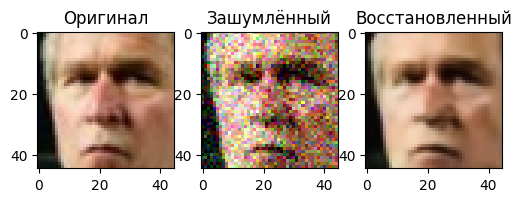

 20%|██        | 5/25 [01:07<04:28, 13.41s/it]

epoch:4, cur train loss: 0.0014861317764124488, curr test loss: 0.0014827916332121407


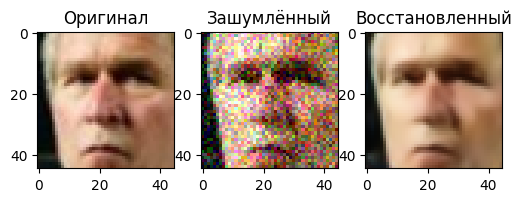

 24%|██▍       | 6/25 [01:20<04:15, 13.45s/it]

epoch:5, cur train loss: 0.0014790776048732154, curr test loss: 0.0016923309470127737


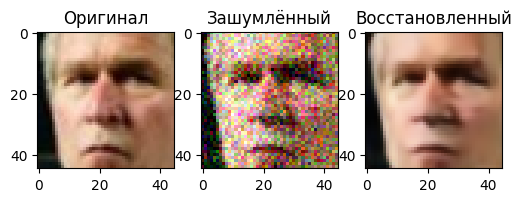

 28%|██▊       | 7/25 [01:34<04:02, 13.48s/it]

epoch:6, cur train loss: 0.0014742069194079055, curr test loss: 0.0014620397206661956


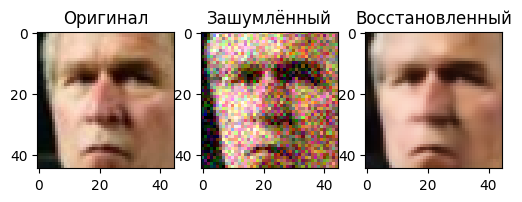

 32%|███▏      | 8/25 [01:47<03:49, 13.48s/it]

epoch:7, cur train loss: 0.0014550351136414063, curr test loss: 0.0014593828236684203


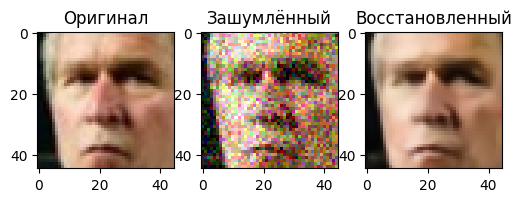

 36%|███▌      | 9/25 [02:01<03:35, 13.48s/it]

epoch:8, cur train loss: 0.0014537784462685093, curr test loss: 0.0014450053817459515


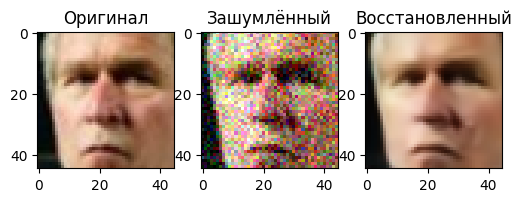

 40%|████      | 10/25 [02:14<03:21, 13.46s/it]

epoch:9, cur train loss: 0.0014457826287059298, curr test loss: 0.001428627924594496


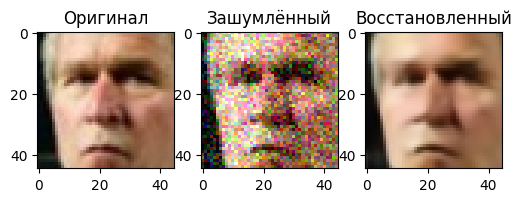

 44%|████▍     | 11/25 [02:28<03:08, 13.45s/it]

epoch:10, cur train loss: 0.0014436791860558036, curr test loss: 0.0014106526893253128


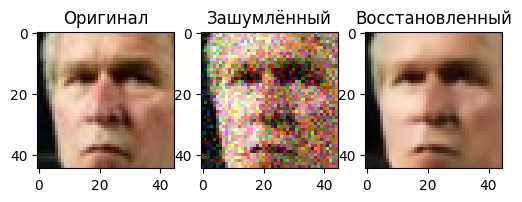

 48%|████▊     | 12/25 [02:41<02:54, 13.44s/it]

epoch:11, cur train loss: 0.001433811695946147, curr test loss: 0.0014123551802532304


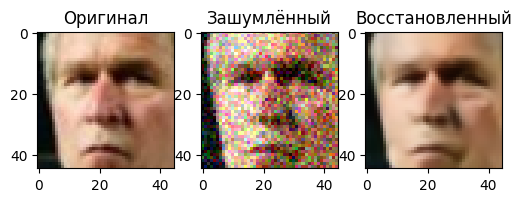

 52%|█████▏    | 13/25 [02:54<02:41, 13.46s/it]

epoch:12, cur train loss: 0.0014246315787643995, curr test loss: 0.0014610768218214314


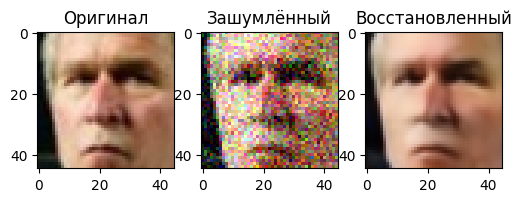

 56%|█████▌    | 14/25 [03:08<02:28, 13.47s/it]

epoch:13, cur train loss: 0.001417639613797045, curr test loss: 0.001448072775799249


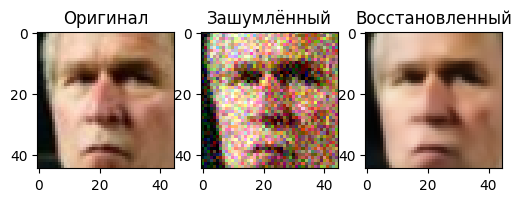

 60%|██████    | 15/25 [03:21<02:14, 13.47s/it]

epoch:14, cur train loss: 0.0014279192659522758, curr test loss: 0.0013959601776496995


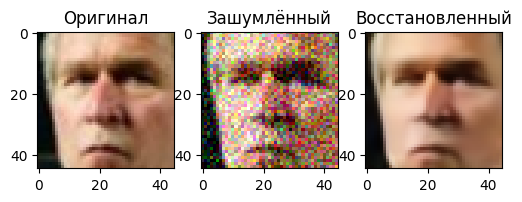

 64%|██████▍   | 16/25 [03:35<02:01, 13.48s/it]

epoch:15, cur train loss: 0.0014080608137371138, curr test loss: 0.0014025613809714006


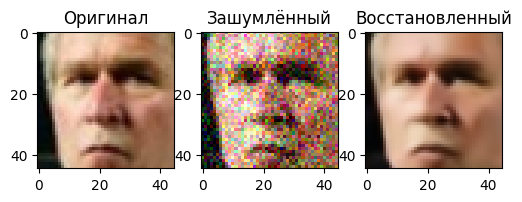

 68%|██████▊   | 17/25 [03:48<01:47, 13.50s/it]

epoch:16, cur train loss: 0.0014090906278423183, curr test loss: 0.0013967011667167146


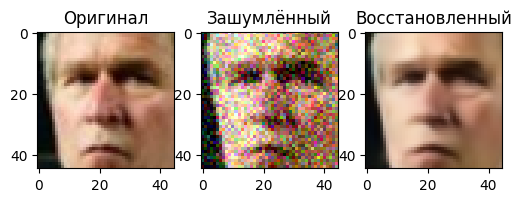

 72%|███████▏  | 18/25 [04:02<01:34, 13.51s/it]

epoch:17, cur train loss: 0.0013981761275064153, curr test loss: 0.0014282691935520796


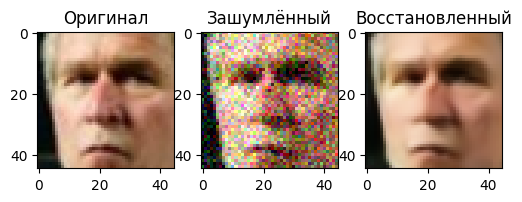

 76%|███████▌  | 19/25 [04:15<01:21, 13.51s/it]

epoch:18, cur train loss: 0.0013981089972512192, curr test loss: 0.0013991410766417782


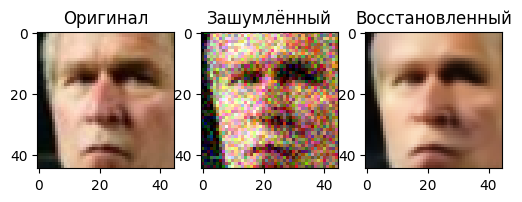

 80%|████████  | 20/25 [04:29<01:08, 13.61s/it]

epoch:19, cur train loss: 0.001390676181751501, curr test loss: 0.0013796634462085507


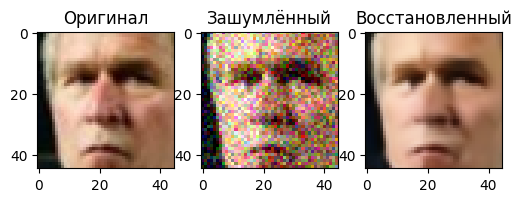

 84%|████████▍ | 21/25 [04:43<00:54, 13.58s/it]

epoch:20, cur train loss: 0.0013869551708326315, curr test loss: 0.0013975428716678704


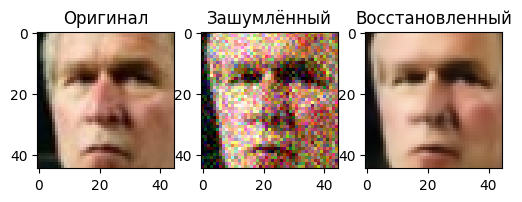

 88%|████████▊ | 22/25 [04:56<00:40, 13.54s/it]

epoch:21, cur train loss: 0.001393323306284864, curr test loss: 0.0014186525284977896


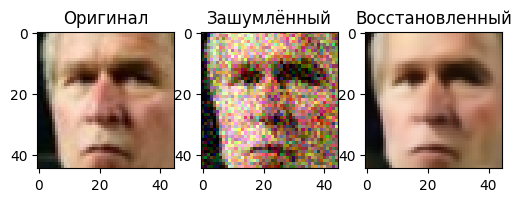

 92%|█████████▏| 23/25 [05:10<00:27, 13.53s/it]

epoch:22, cur train loss: 0.001375726812407184, curr test loss: 0.0015050471993163228


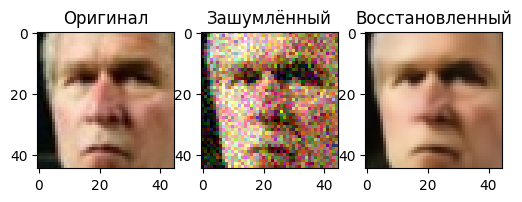

 96%|█████████▌| 24/25 [05:23<00:13, 13.52s/it]

epoch:23, cur train loss: 0.0013760858298162632, curr test loss: 0.0013815914557891943


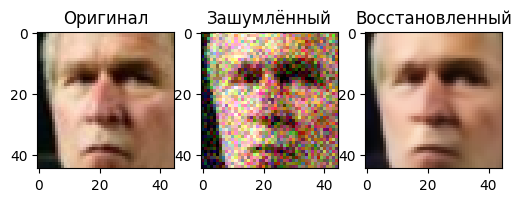

100%|██████████| 25/25 [05:37<00:00, 13.49s/it]

epoch:24, cur train loss: 0.0013760274923418452, curr test loss: 0.0013766899383405135


In [167]:
from tqdm import tqdm
epoch = 25
train_loss = []
test_loss = []
noise_factor = 0.15# со значениями больше, очень тяжело понять что происходит за шумом, модель выдаёт потери возле 0.003 +- 0.0002 для noise = 0.3
val_vis = X_test_tensor[0:1].to(device) 
for i in tqdm(range(epoch)):
    model.train()
    epoch_loss = {'train': [], 'test': []}
    
    for batch in train_dataloader:
        
        optimizer.zero_grad()
        batch = batch[0].to(device)
        noise = batch + noise_factor * torch.randn_like(batch)
        
        pred = model(noise)

        loss = criterion(pred[0], batch)

        loss.backward()
        optimizer.step()
        epoch_loss['train'].append(loss.item())
    eplosstr = np.mean(epoch_loss['train'])
    train_loss.append(eplosstr)

    model.eval()
    for batch in test_dataloader:
        with torch.no_grad():
            
            batch = batch[0].to(device)
            noise = batch + noise_factor * torch.randn_like(batch)
            pred = model(noise)
            loss = criterion(pred[0], batch)
            
            epoch_loss['test'].append(loss.item())
    eplosstest = np.mean(epoch_loss['test'])
    test_loss.append(eplosstest)

    val_clean = X_test_tensor[0:1].to(device)
    val_noisy = val_clean + noise_factor * torch.randn_like(val_clean)
    
    with torch.no_grad():
        recon_vis, _ = model(val_noisy)
    
    fig, axes = plt.subplots(1, 3, figsize=(6,2))
    axes[0].imshow(val_clean[0].cpu().permute(1,2,0).clamp(0,1))
    axes[0].set_title('Оригинал')
    axes[1].imshow(val_noisy[0].cpu().permute(1,2,0).clamp(0,1))
    axes[1].set_title('Зашумлённый')
    axes[2].imshow(recon_vis[0].cpu().permute(1,2,0).clamp(0,1))
    axes[2].set_title('Восстановленный')
    plt.show()


    
    print(f'epoch:{i}, cur train loss: {eplosstr}, curr test loss: {eplosstest}')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40398908..1.3943743].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2539888..1.3843913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.37431225..1.3393923].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2919804..1.1221449].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.28741896..1.2360557].


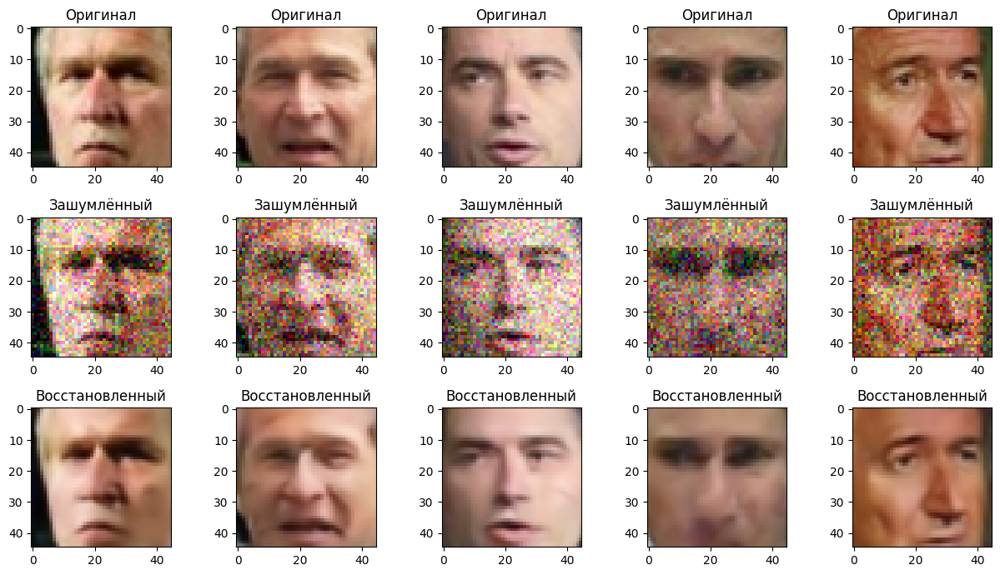

In [168]:
fig, axes = plt.subplots(3, 5, figsize=(5 * 2.5, 7))

with torch.no_grad():
    for i in range(5):
        clean = X_test_tensor[i:i+1].to(device)
        noisy = clean + noise_factor * torch.randn_like(clean)
        recon, _ = model(noisy)

        axes[0, i].imshow(clean[0].cpu().permute(1, 2, 0))
        axes[0, i].set_title('Оригинал')
        axes[1, i].imshow(noisy[0].cpu().permute(1, 2, 0))
        axes[1, i].set_title('Зашумлённый')
        axes[2, i].imshow(recon[0].cpu().permute(1, 2, 0))
        axes[2, i].set_title('Восстановленный')

plt.tight_layout()
plt.show()

# BONUS 2: Image Retrieval (2 балла)



Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентных представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

Немного кода вам в помощь: (feel free to delete everything and write your own)

In [179]:
class VAE(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        self.enc = nn.Sequential(
            nn.Conv2d(3, 32, 3, stride=2, padding=1),   
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),  
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(128 * 6 * 6, 512),
            nn.ReLU()
        )
        self.fc_mu = nn.Linear(512, latent_dim)
        self.fc_logsigma = nn.Linear(512, latent_dim)


        self.decoder_input = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.ReLU()
        )
        self.dec = nn.Sequential(
            nn.Linear(512, 128 * 6 * 6),
            nn.ReLU(),
            nn.Unflatten(1, (128, 6, 6)),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, 3, stride=2, padding=1, output_padding=0),
            nn.Sigmoid()
        )

    def encode(self, x):
        x = self.enc(x)
        mu = self.fc_mu(x)
        logsigma = self.fc_logsigma(x)
        return mu, logsigma

    def gaussian_sampler(self, mu, logsigma):
        if self.training:
            sigma = torch.exp(0.5 * logsigma)
            eps = torch.randn_like(sigma)
            return mu + eps * sigma
        else:
            return mu

    def decode(self, z):
        reconstruction = self.decoder_input(z)
        reconstruction = self.dec(reconstruction)
        return reconstruction

    def forward(self, x):
        mu, logsigma = self.encode(x)
        z = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(z)
        return mu, logsigma, reconstruction

  0%|          | 0/100 [00:00<?, ?it/s]

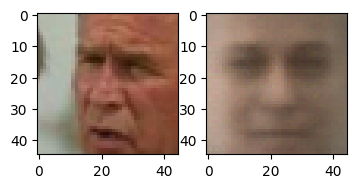

  1%|          | 1/100 [00:02<04:19,  2.63s/it]

epoch:0, cur train loss: 3923.101478830323, curr test loss: 3854.07470703125


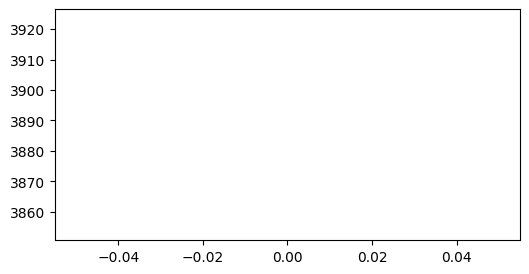

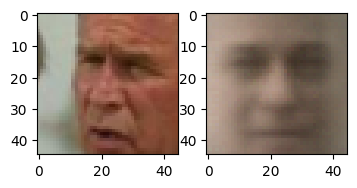

  2%|▏         | 2/100 [00:05<04:15,  2.61s/it]

epoch:1, cur train loss: 3820.0055477991127, curr test loss: 3829.7921549479165


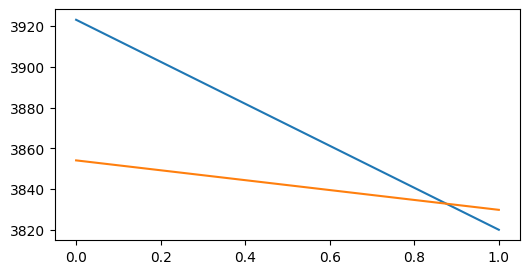

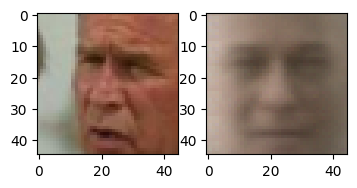

  3%|▎         | 3/100 [00:07<04:11,  2.59s/it]

epoch:2, cur train loss: 3798.6869449078886, curr test loss: 3802.078345889137


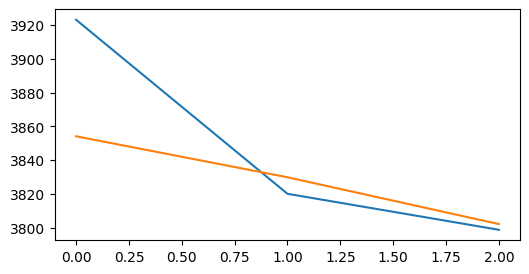

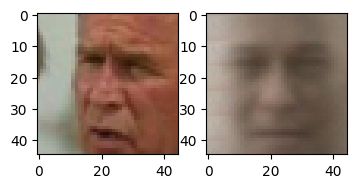

  4%|▍         | 4/100 [00:10<04:08,  2.59s/it]

epoch:3, cur train loss: 3783.444160480938, curr test loss: 3794.3368094308034


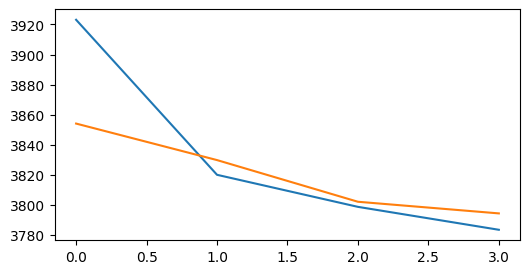

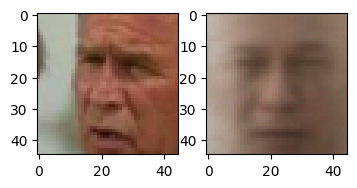

  5%|▌         | 5/100 [00:12<04:05,  2.59s/it]

epoch:4, cur train loss: 3774.227800686341, curr test loss: 3770.872267950149


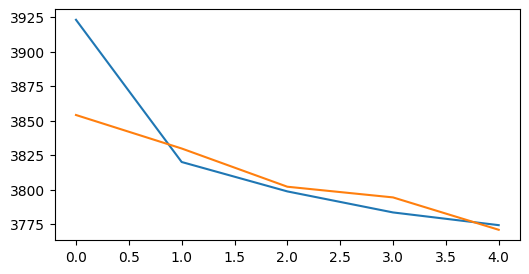

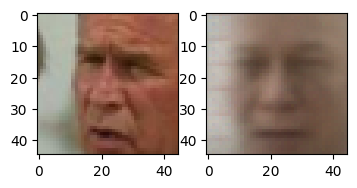

  6%|▌         | 6/100 [00:15<04:15,  2.72s/it]

epoch:5, cur train loss: 3766.740374240729, curr test loss: 3772.422921316964


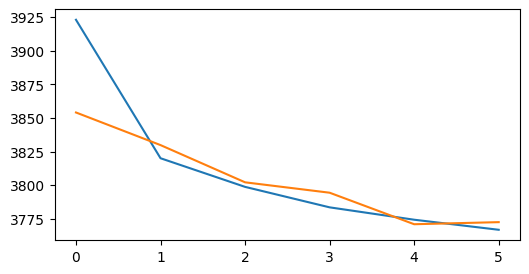

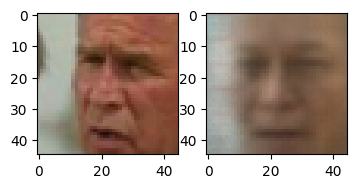

  7%|▋         | 7/100 [00:18<04:07,  2.66s/it]

epoch:6, cur train loss: 3760.3378531609656, curr test loss: 3757.5968075706846


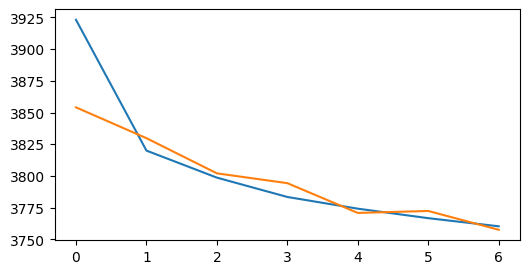

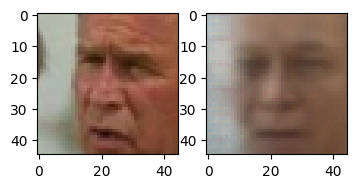

  8%|▊         | 8/100 [00:21<04:03,  2.65s/it]

epoch:7, cur train loss: 3756.0980658567773, curr test loss: 3754.960670107887


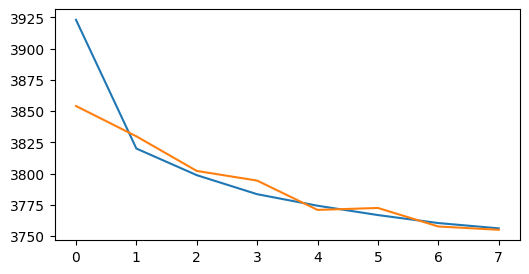

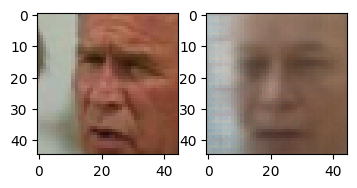

  9%|▉         | 9/100 [00:23<04:00,  2.64s/it]

epoch:8, cur train loss: 3753.0911980748483, curr test loss: 3752.1152227492557


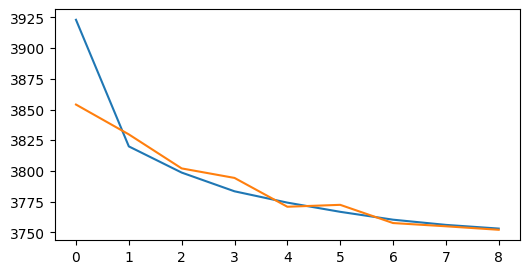

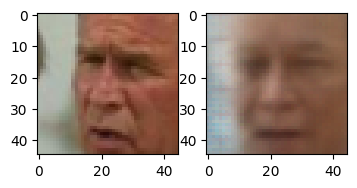

 10%|█         | 10/100 [00:26<03:57,  2.64s/it]

epoch:9, cur train loss: 3750.111727741368, curr test loss: 3739.230712890625


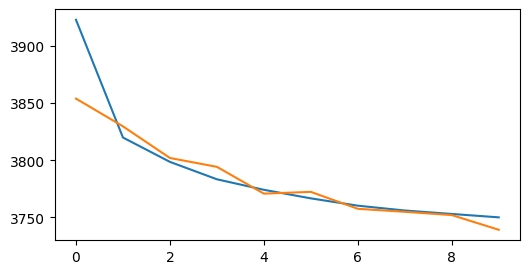

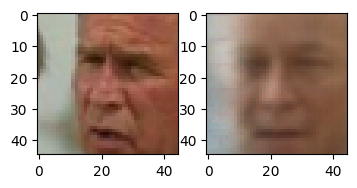

 11%|█         | 11/100 [00:28<03:53,  2.62s/it]

epoch:10, cur train loss: 3747.493187165321, curr test loss: 3734.6103631882443


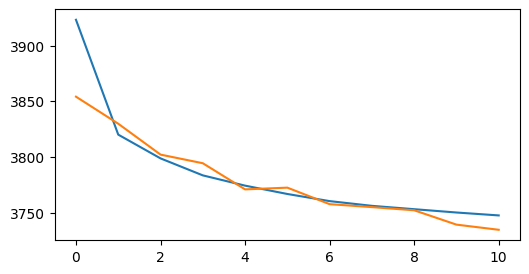

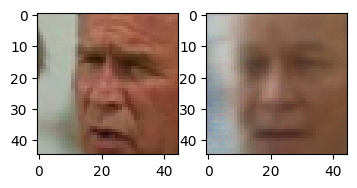

 12%|█▏        | 12/100 [00:31<03:49,  2.61s/it]

epoch:11, cur train loss: 3745.6408285545876, curr test loss: 3737.2594866071427


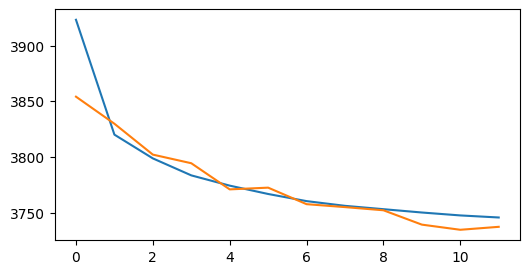

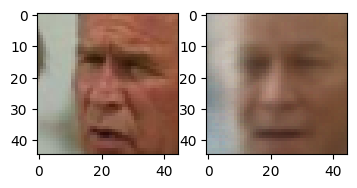

 13%|█▎        | 13/100 [00:34<03:46,  2.60s/it]

epoch:12, cur train loss: 3743.487594409367, curr test loss: 3735.1409040178573


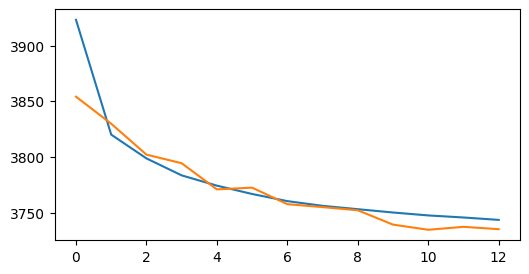

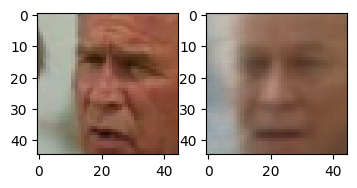

 14%|█▍        | 14/100 [00:36<03:43,  2.60s/it]

epoch:13, cur train loss: 3741.587798213715, curr test loss: 3730.4636579241073


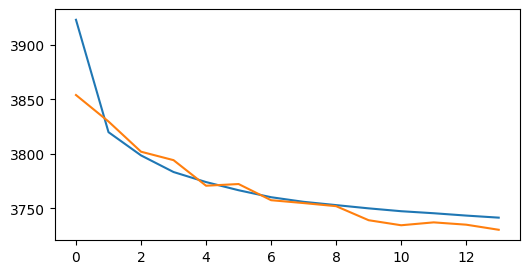

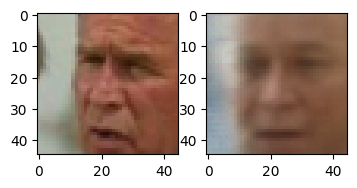

 15%|█▌        | 15/100 [00:39<03:41,  2.60s/it]

epoch:14, cur train loss: 3740.35676001039, curr test loss: 3729.2227841331846


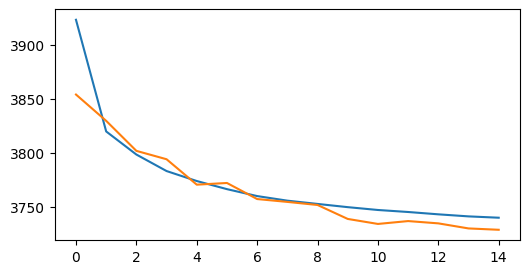

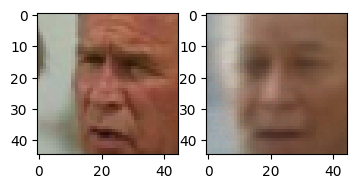

 16%|█▌        | 16/100 [00:41<03:39,  2.61s/it]

epoch:15, cur train loss: 3739.1096303798354, curr test loss: 3728.3293340773807


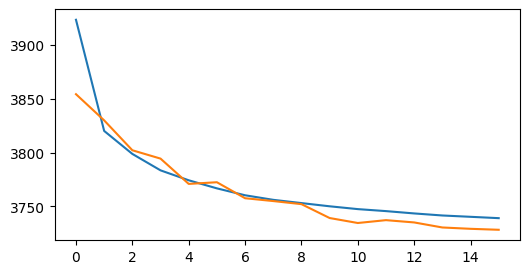

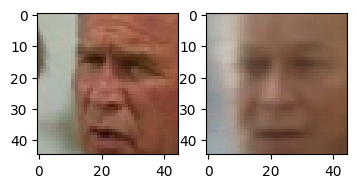

 17%|█▋        | 17/100 [00:44<03:35,  2.60s/it]

epoch:16, cur train loss: 3737.6902261329124, curr test loss: 3726.3043154761904


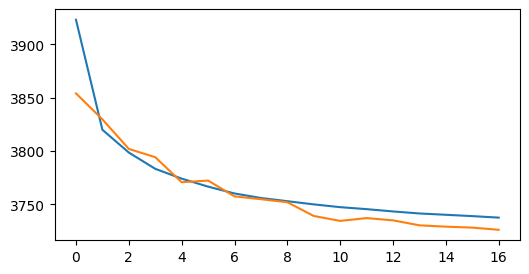

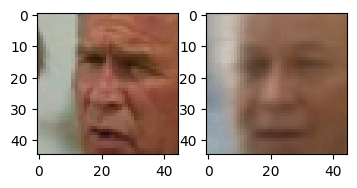

 18%|█▊        | 18/100 [00:47<03:33,  2.60s/it]

epoch:17, cur train loss: 3736.3090145959877, curr test loss: 3723.2742978050596


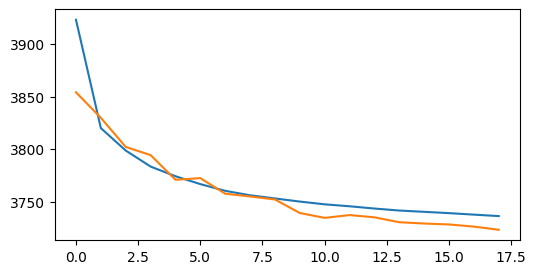

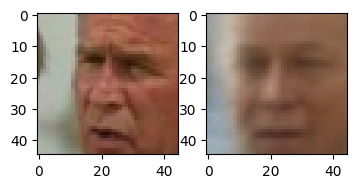

 19%|█▉        | 19/100 [00:49<03:30,  2.59s/it]

epoch:18, cur train loss: 3735.087798213715, curr test loss: 3721.1883719308034


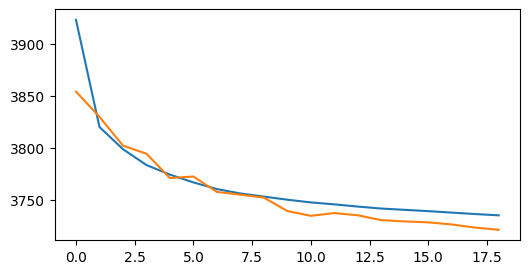

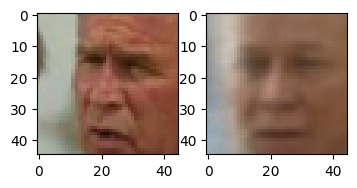

 20%|██        | 20/100 [00:52<03:28,  2.61s/it]

epoch:19, cur train loss: 3733.8930776454604, curr test loss: 3724.413039434524


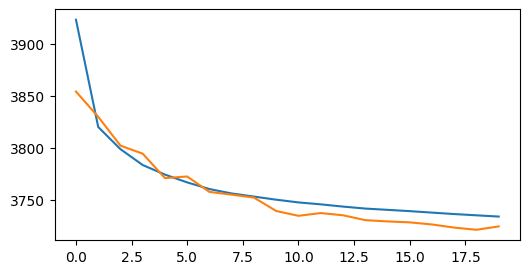

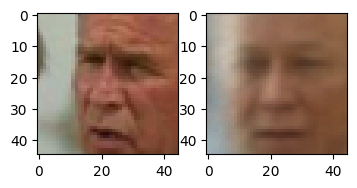

 21%|██        | 21/100 [00:54<03:25,  2.60s/it]

epoch:20, cur train loss: 3733.189096592271, curr test loss: 3720.715576171875


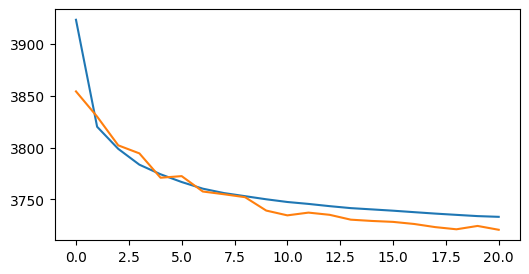

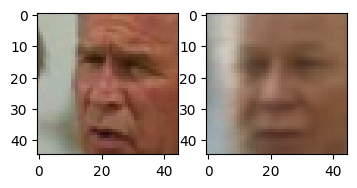

 22%|██▏       | 22/100 [00:57<03:21,  2.59s/it]

epoch:21, cur train loss: 3732.2438028242887, curr test loss: 3720.6417294456846


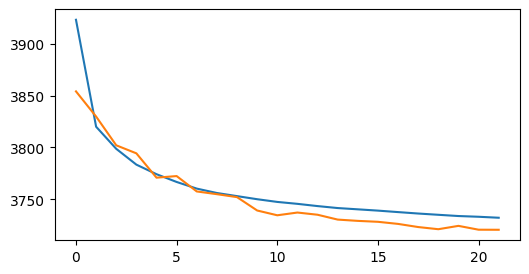

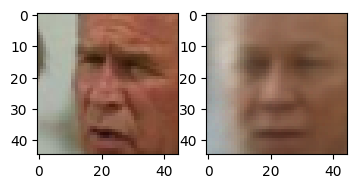

 23%|██▎       | 23/100 [01:00<03:18,  2.58s/it]

epoch:22, cur train loss: 3731.523563004516, curr test loss: 3718.0298200334823


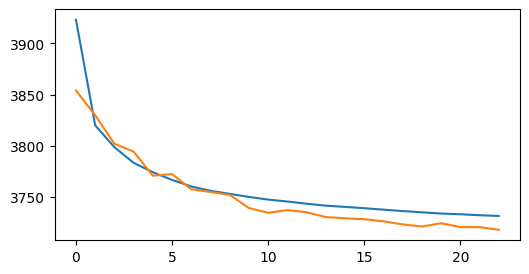

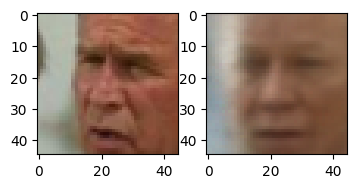

 24%|██▍       | 24/100 [01:02<03:24,  2.69s/it]

epoch:23, cur train loss: 3730.8664007552748, curr test loss: 3720.472191220238


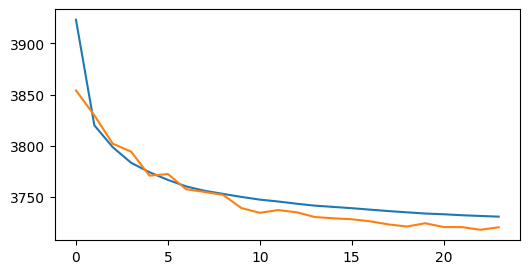

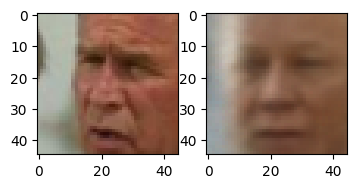

 25%|██▌       | 25/100 [01:05<03:19,  2.66s/it]

epoch:24, cur train loss: 3729.6894212805705, curr test loss: 3719.554513113839


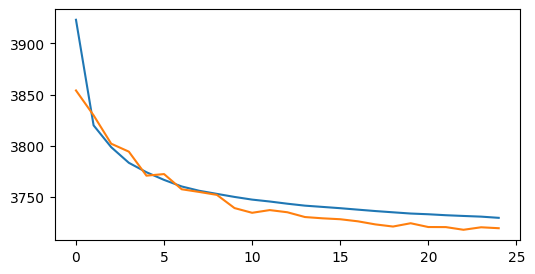

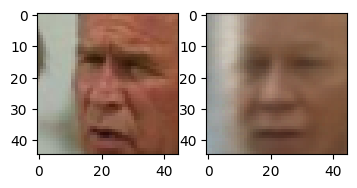

 26%|██▌       | 26/100 [01:08<03:14,  2.63s/it]

epoch:25, cur train loss: 3729.597157978341, curr test loss: 3716.5926455543154


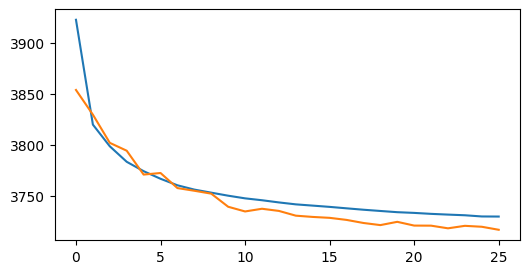

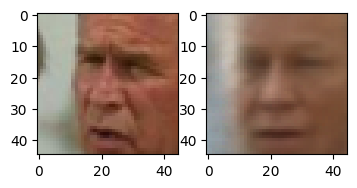

 27%|██▋       | 27/100 [01:10<03:11,  2.63s/it]

epoch:26, cur train loss: 3728.393367991728, curr test loss: 3717.9087727864585


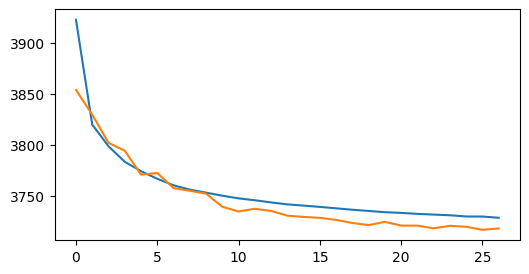

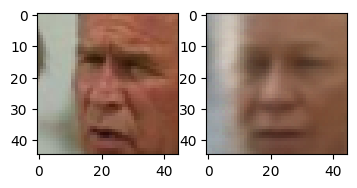

 28%|██▊       | 28/100 [01:13<03:08,  2.62s/it]

epoch:27, cur train loss: 3727.941923878077, curr test loss: 3715.739432198661


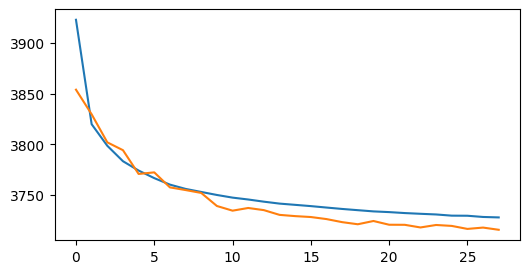

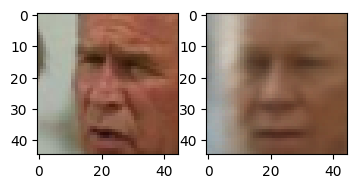

 29%|██▉       | 29/100 [01:15<03:05,  2.61s/it]

epoch:28, cur train loss: 3726.966691351303, curr test loss: 3713.8726515997023


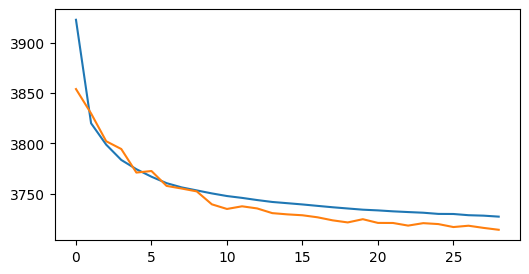

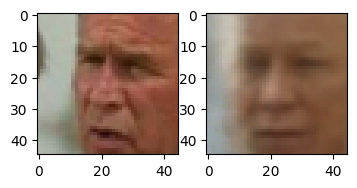

 30%|███       | 30/100 [01:18<03:01,  2.59s/it]

epoch:29, cur train loss: 3726.6645663912645, curr test loss: 3714.3587820870534


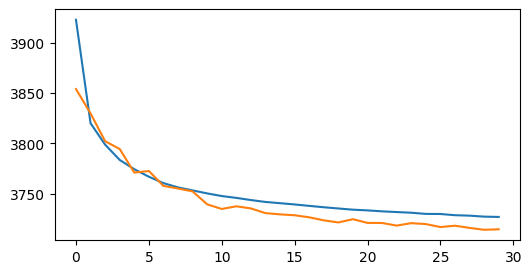

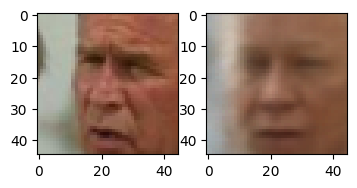

 31%|███       | 31/100 [01:21<02:59,  2.61s/it]

epoch:30, cur train loss: 3726.0083813289243, curr test loss: 3713.4285249255954


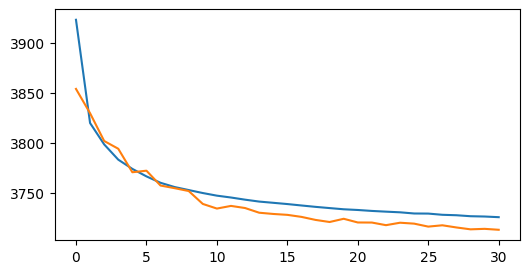

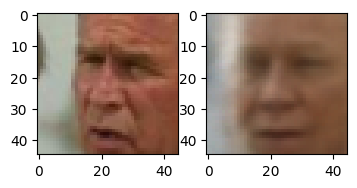

 32%|███▏      | 32/100 [01:23<02:56,  2.60s/it]

epoch:31, cur train loss: 3725.3862417079604, curr test loss: 3714.911911737351


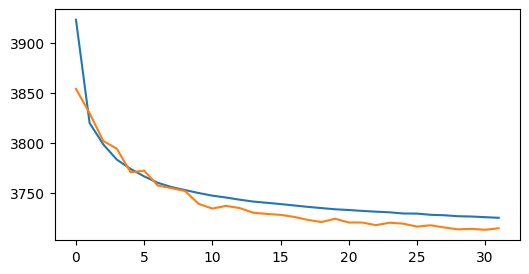

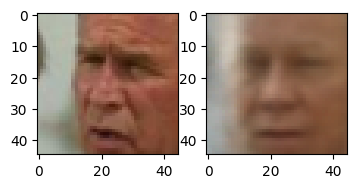

 33%|███▎      | 33/100 [01:26<02:54,  2.60s/it]

epoch:32, cur train loss: 3724.976684258112, curr test loss: 3714.273414248512


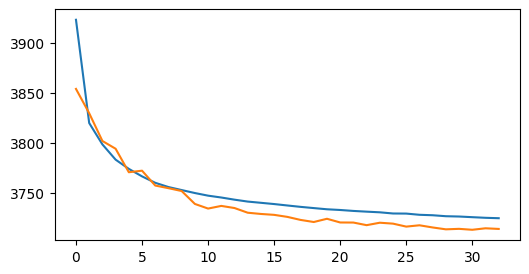

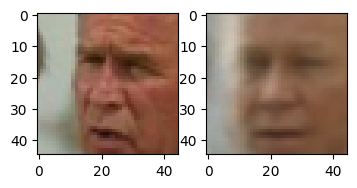

 34%|███▍      | 34/100 [01:28<02:51,  2.60s/it]

epoch:33, cur train loss: 3723.9710228180948, curr test loss: 3715.5557221912204


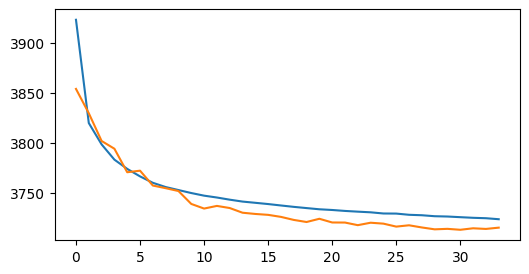

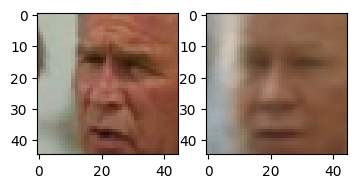

 35%|███▌      | 35/100 [01:31<02:49,  2.61s/it]

epoch:34, cur train loss: 3723.5731572690215, curr test loss: 3712.6382765997023


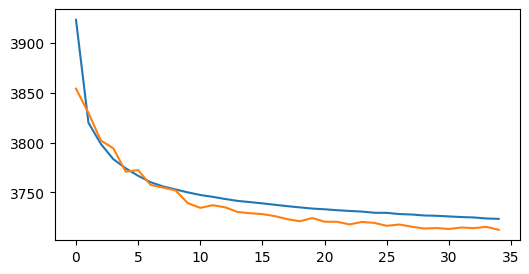

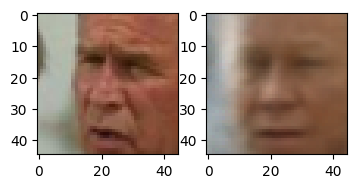

 36%|███▌      | 36/100 [01:34<02:45,  2.59s/it]

epoch:35, cur train loss: 3723.2842671035805, curr test loss: 3713.3751627604165


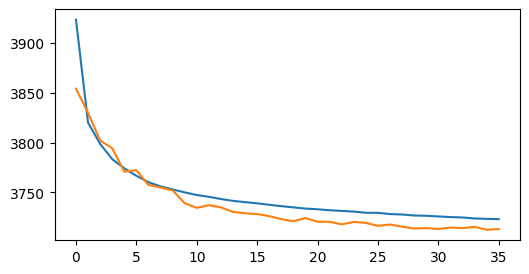

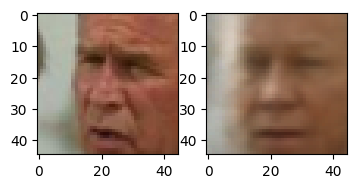

 37%|███▋      | 37/100 [01:36<02:42,  2.59s/it]

epoch:36, cur train loss: 3723.1752748611334, curr test loss: 3712.9736909412204


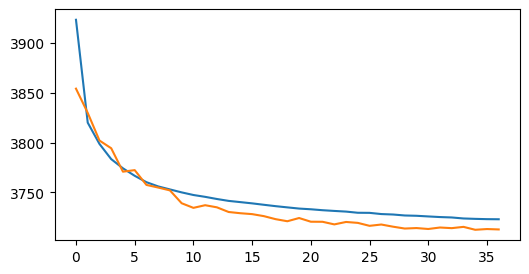

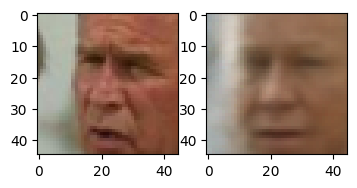

 38%|███▊      | 38/100 [01:39<02:40,  2.58s/it]

epoch:37, cur train loss: 3722.5264870724104, curr test loss: 3711.23291015625


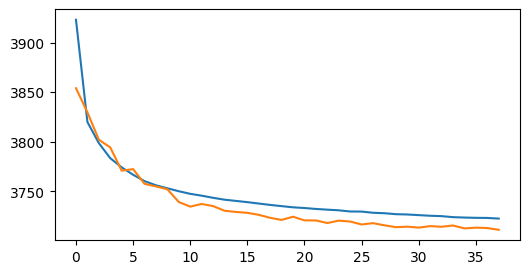

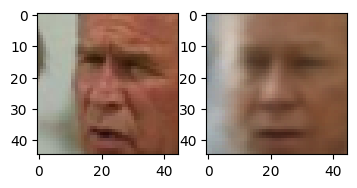

 39%|███▉      | 39/100 [01:41<02:37,  2.59s/it]

epoch:38, cur train loss: 3722.1007339204366, curr test loss: 3712.2787272135415


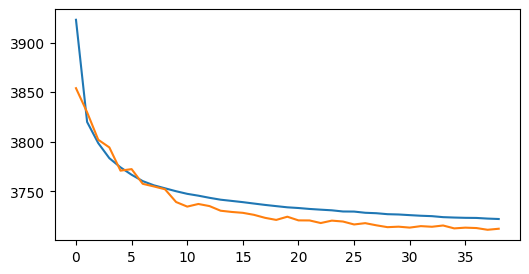

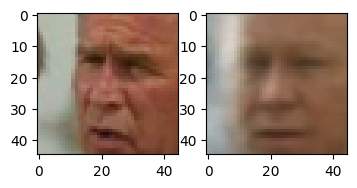

 40%|████      | 40/100 [01:44<02:34,  2.57s/it]

epoch:39, cur train loss: 3721.888698099824, curr test loss: 3711.993094308036


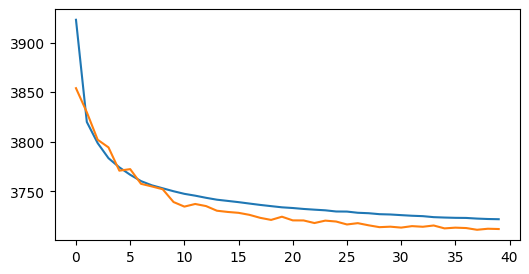

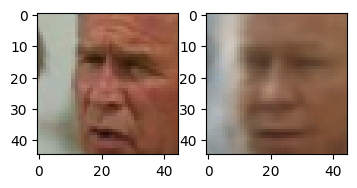

 41%|████      | 41/100 [01:46<02:31,  2.56s/it]

epoch:40, cur train loss: 3721.655487606897, curr test loss: 3710.5850190662204


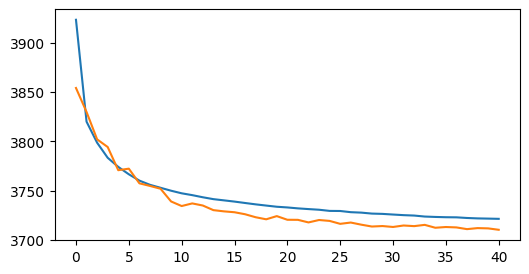

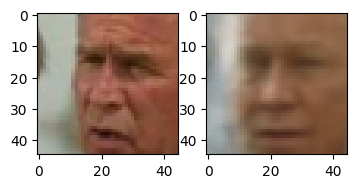

 42%|████▏     | 42/100 [01:49<02:34,  2.67s/it]

epoch:41, cur train loss: 3721.0123237941575, curr test loss: 3711.950706845238


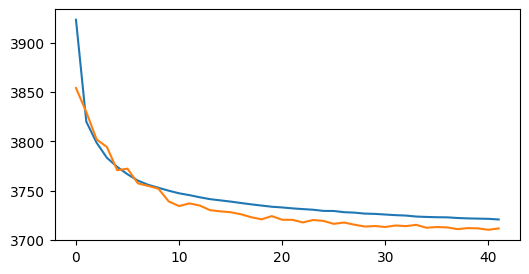

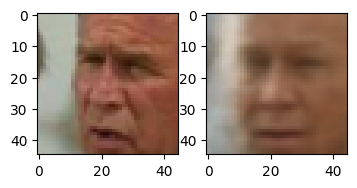

 43%|████▎     | 43/100 [01:52<02:31,  2.65s/it]

epoch:42, cur train loss: 3720.4180180776457, curr test loss: 3710.4060988653273


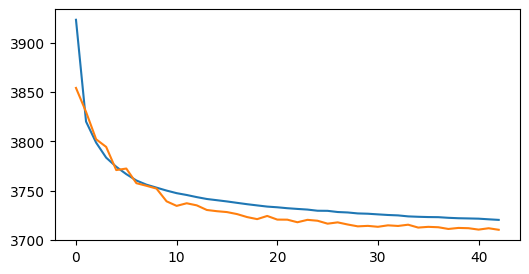

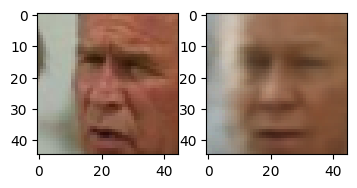

 44%|████▍     | 44/100 [01:55<02:27,  2.63s/it]

epoch:43, cur train loss: 3720.0069989060503, curr test loss: 3709.247535342262


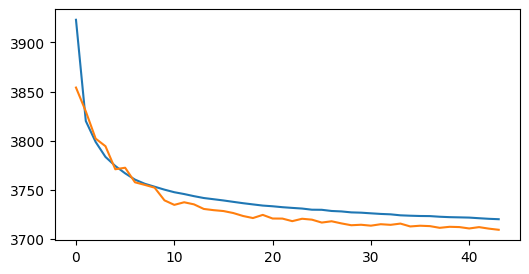

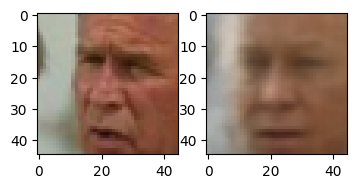

 45%|████▌     | 45/100 [01:57<02:24,  2.62s/it]

epoch:44, cur train loss: 3719.7223015904733, curr test loss: 3708.8446684337796


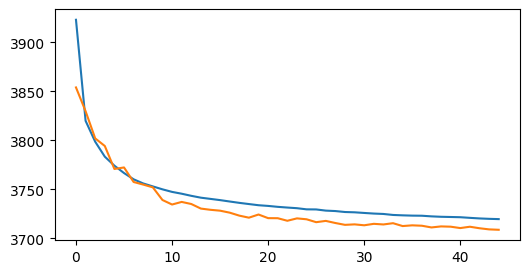

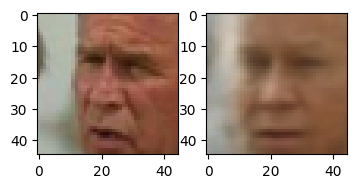

 46%|████▌     | 46/100 [02:00<02:21,  2.62s/it]

epoch:45, cur train loss: 3719.5480944543237, curr test loss: 3709.2953752790177


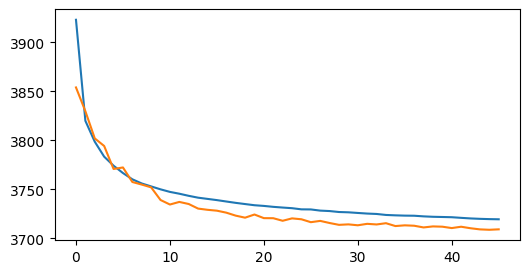

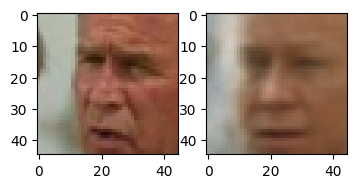

 47%|████▋     | 47/100 [02:02<02:18,  2.61s/it]

epoch:46, cur train loss: 3718.6491411994484, curr test loss: 3709.2458612351193


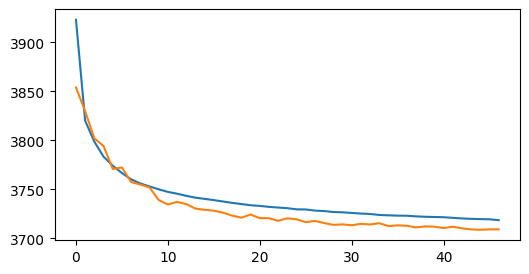

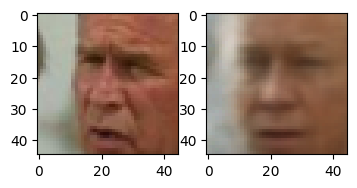

 48%|████▊     | 48/100 [02:05<02:15,  2.61s/it]

epoch:47, cur train loss: 3718.9331498011907, curr test loss: 3709.6666666666665


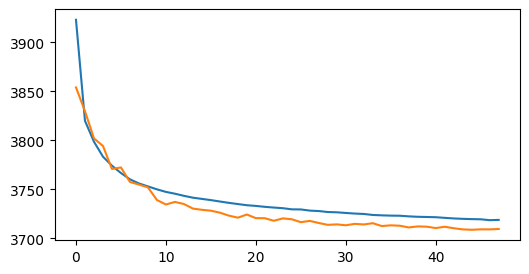

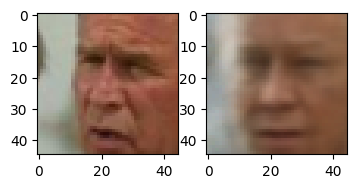

 49%|████▉     | 49/100 [02:08<02:12,  2.61s/it]

epoch:48, cur train loss: 3718.3621941685983, curr test loss: 3707.880661737351


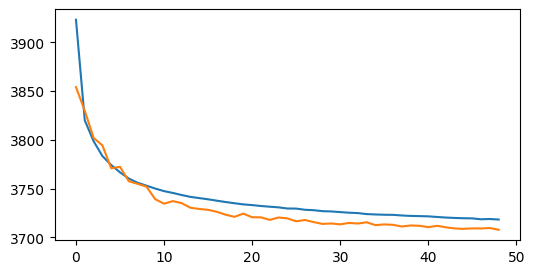

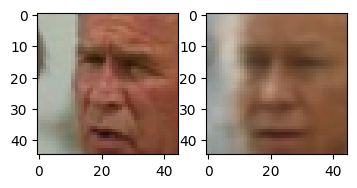

 50%|█████     | 50/100 [02:10<02:10,  2.60s/it]

epoch:49, cur train loss: 3717.964931790481, curr test loss: 3710.3443545386904


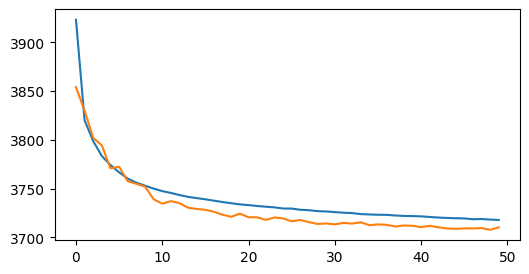

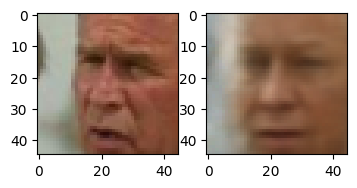

 51%|█████     | 51/100 [02:13<02:08,  2.62s/it]

epoch:50, cur train loss: 3717.4158126948128, curr test loss: 3710.6898484002977


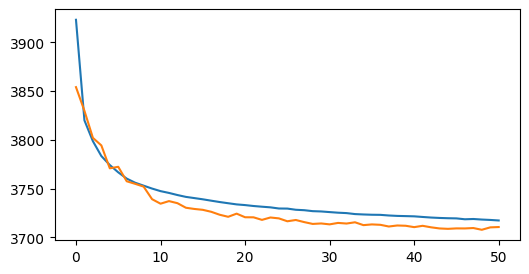

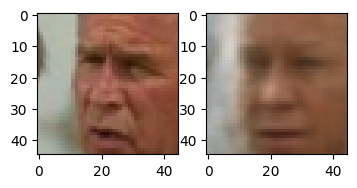

 52%|█████▏    | 52/100 [02:15<02:06,  2.63s/it]

epoch:51, cur train loss: 3717.115862521979, curr test loss: 3709.117140997024


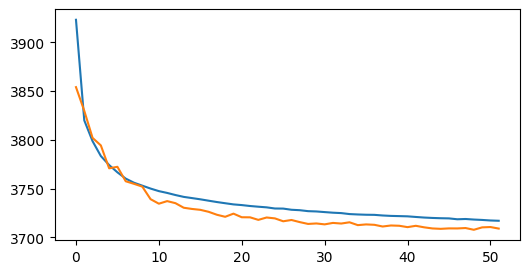

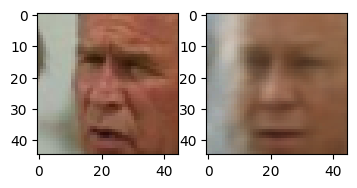

 53%|█████▎    | 53/100 [02:18<02:03,  2.63s/it]

epoch:52, cur train loss: 3717.121911714754, curr test loss: 3708.819998604911


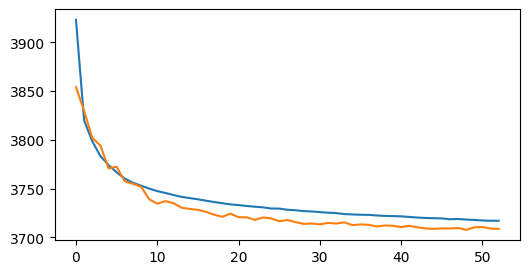

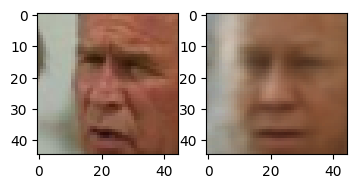

 54%|█████▍    | 54/100 [02:21<02:01,  2.63s/it]

epoch:53, cur train loss: 3716.997839574009, curr test loss: 3708.3531552269346


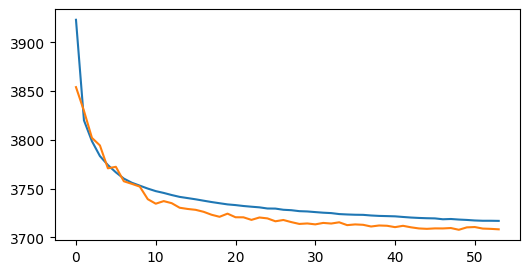

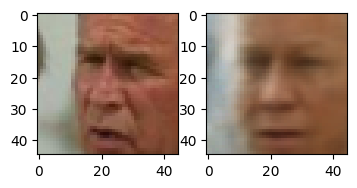

 55%|█████▌    | 55/100 [02:23<01:58,  2.63s/it]

epoch:54, cur train loss: 3716.464801290761, curr test loss: 3711.3624674479165


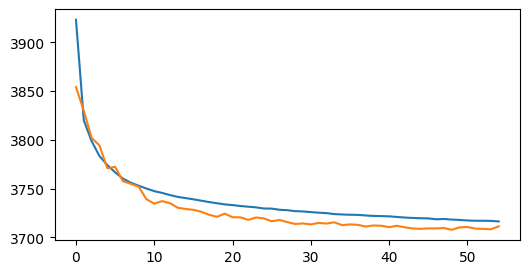

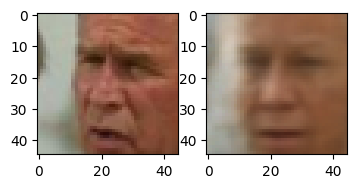

 56%|█████▌    | 56/100 [02:26<01:54,  2.61s/it]

epoch:55, cur train loss: 3715.98207470828, curr test loss: 3707.0638369605654


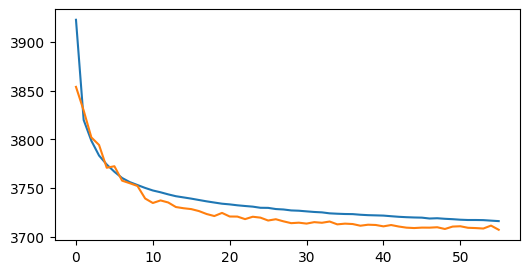

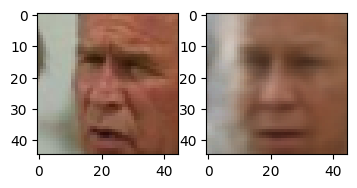

 57%|█████▋    | 57/100 [02:28<01:51,  2.59s/it]

epoch:56, cur train loss: 3715.888430856378, curr test loss: 3710.5167643229165


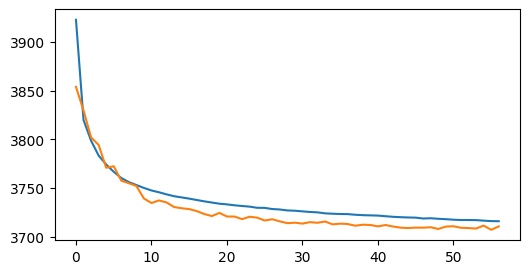

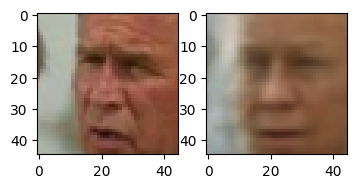

 58%|█████▊    | 58/100 [02:31<01:48,  2.59s/it]

epoch:57, cur train loss: 3715.8812084149217, curr test loss: 3709.3284272693454


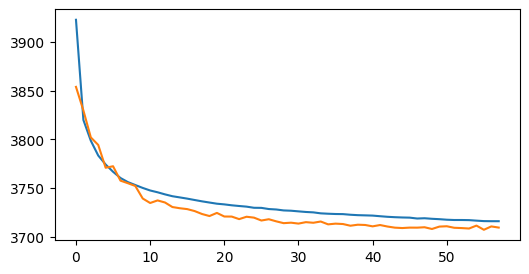

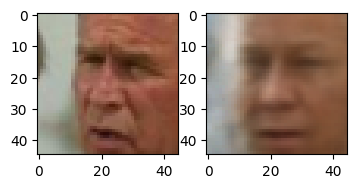

 59%|█████▉    | 59/100 [02:34<01:45,  2.57s/it]

epoch:58, cur train loss: 3715.5187114120445, curr test loss: 3709.2401297433034


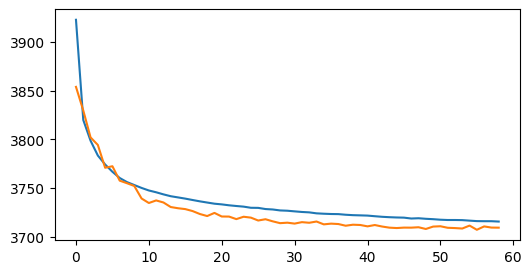

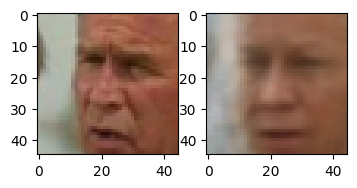

 60%|██████    | 60/100 [02:37<01:47,  2.69s/it]

epoch:59, cur train loss: 3715.4316618546195, curr test loss: 3707.0296688988096


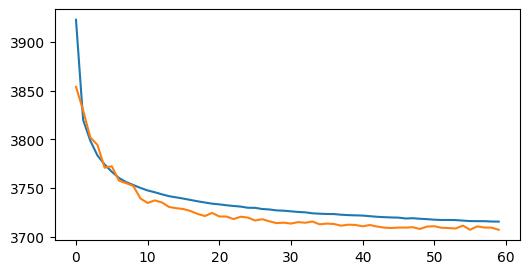

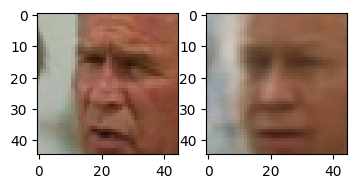

 61%|██████    | 61/100 [02:39<01:43,  2.65s/it]

epoch:60, cur train loss: 3714.62763684363, curr test loss: 3708.5357026599704


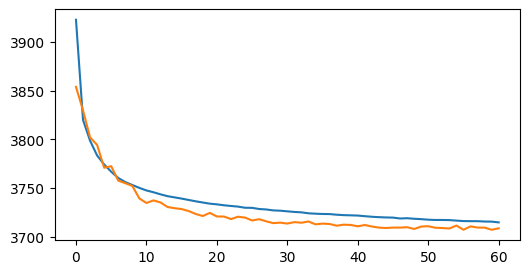

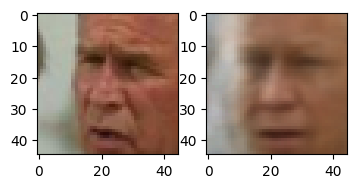

 62%|██████▏   | 62/100 [02:42<01:40,  2.65s/it]

epoch:61, cur train loss: 3715.0112960308106, curr test loss: 3709.6229887462796


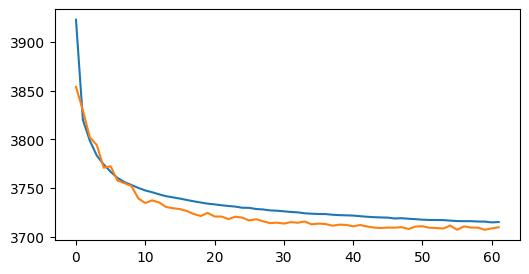

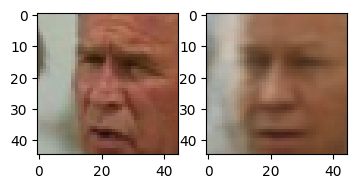

 63%|██████▎   | 63/100 [02:44<01:37,  2.63s/it]

epoch:62, cur train loss: 3714.3754757932384, curr test loss: 3709.796316964286


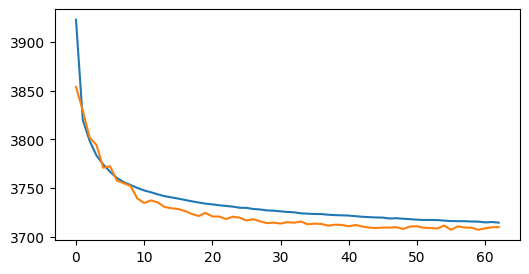

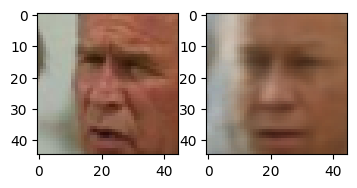

 64%|██████▍   | 64/100 [02:47<01:34,  2.63s/it]

epoch:63, cur train loss: 3713.7863501039, curr test loss: 3709.9106096540177


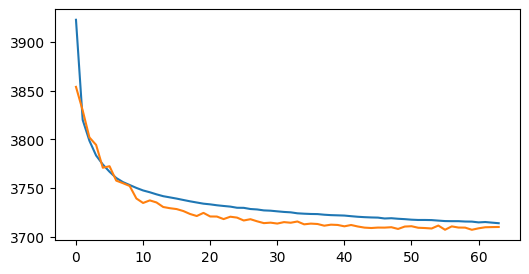

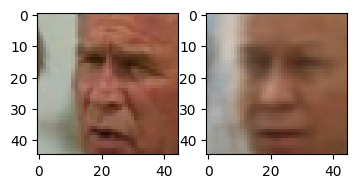

 65%|██████▌   | 65/100 [02:50<01:31,  2.62s/it]

epoch:64, cur train loss: 3714.2296008332, curr test loss: 3708.2310500372023


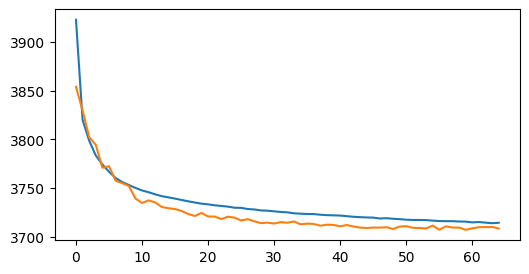

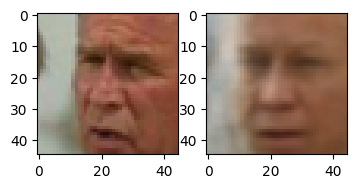

 66%|██████▌   | 66/100 [02:52<01:28,  2.62s/it]

epoch:65, cur train loss: 3713.6755146309542, curr test loss: 3709.0973772321427


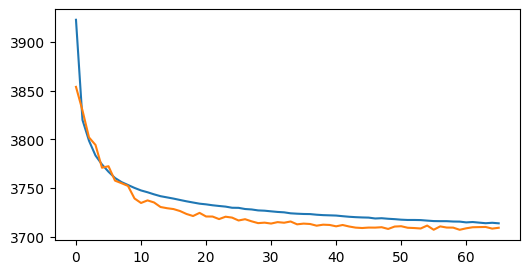

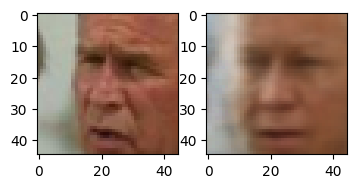

 67%|██████▋   | 67/100 [02:55<01:26,  2.61s/it]

epoch:66, cur train loss: 3713.5375114889707, curr test loss: 3709.8186383928573


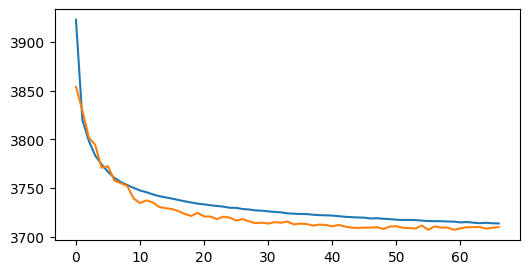

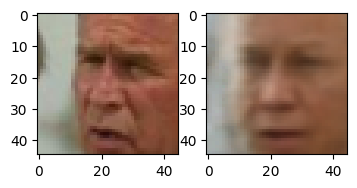

 68%|██████▊   | 68/100 [02:57<01:23,  2.60s/it]

epoch:67, cur train loss: 3713.593744380395, curr test loss: 3710.6304873511904


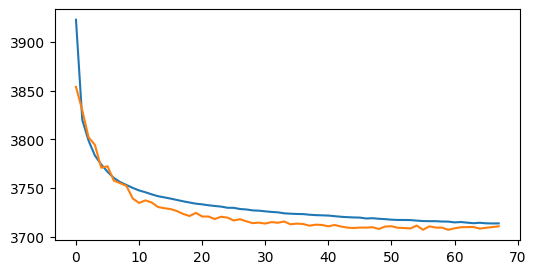

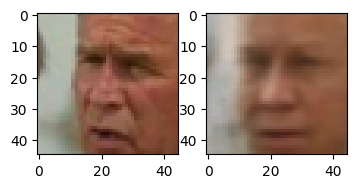

 69%|██████▉   | 69/100 [03:00<01:20,  2.61s/it]

epoch:68, cur train loss: 3713.4890117986733, curr test loss: 3707.949927920387


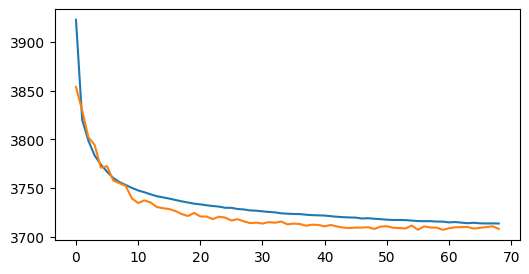

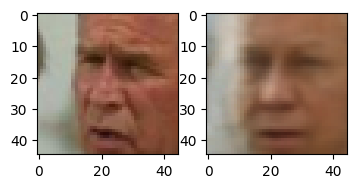

 70%|███████   | 70/100 [03:03<01:18,  2.60s/it]

epoch:69, cur train loss: 3713.310797259631, curr test loss: 3710.7287016369046


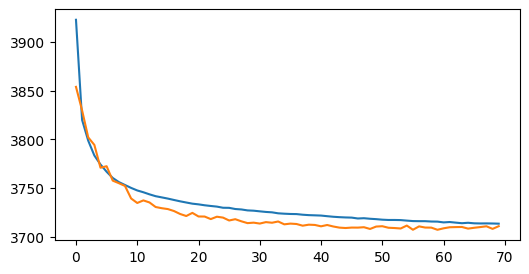

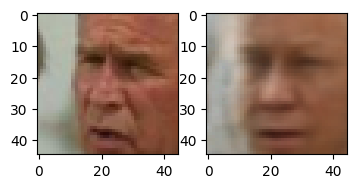

 71%|███████   | 71/100 [03:05<01:16,  2.62s/it]

epoch:70, cur train loss: 3712.900808348985, curr test loss: 3709.4303269159227


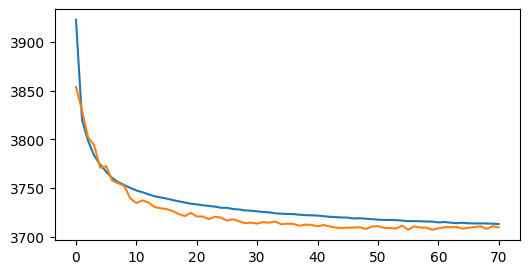

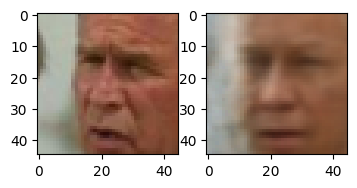

 72%|███████▏  | 72/100 [03:08<01:13,  2.61s/it]

epoch:71, cur train loss: 3712.7696086756714, curr test loss: 3711.0114629836307


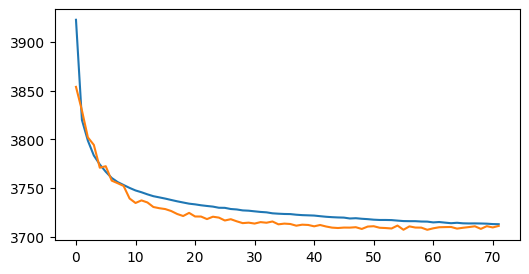

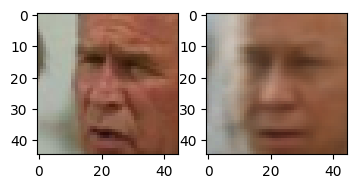

 73%|███████▎  | 73/100 [03:10<01:09,  2.59s/it]

epoch:72, cur train loss: 3712.4805492976743, curr test loss: 3709.4684244791665


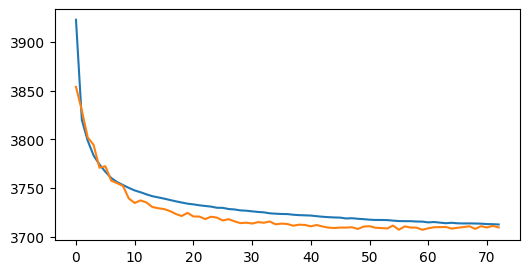

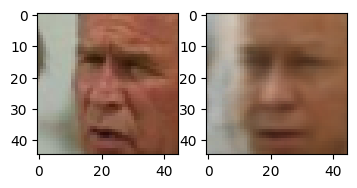

 74%|███████▍  | 74/100 [03:13<01:07,  2.59s/it]

epoch:73, cur train loss: 3712.4469734055306, curr test loss: 3709.000244140625


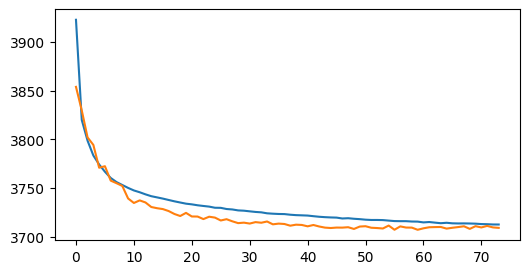

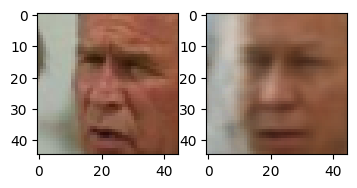

 75%|███████▌  | 75/100 [03:16<01:04,  2.59s/it]

epoch:74, cur train loss: 3711.789148042879, curr test loss: 3709.5295758928573


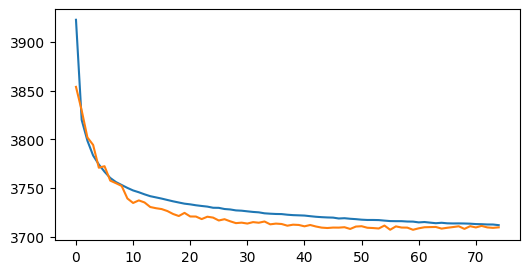

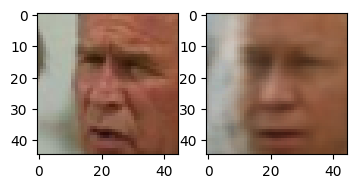

 76%|███████▌  | 76/100 [03:18<01:02,  2.60s/it]

epoch:75, cur train loss: 3711.7812375119884, curr test loss: 3710.8237653459823


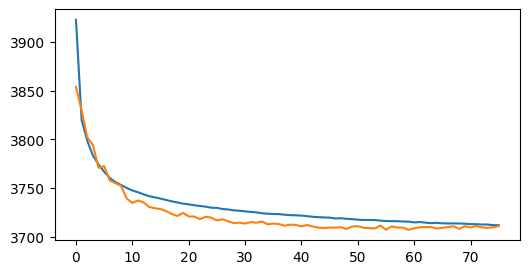

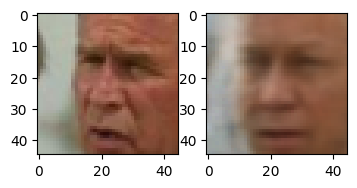

 77%|███████▋  | 77/100 [03:21<01:02,  2.71s/it]

epoch:76, cur train loss: 3711.770220588235, curr test loss: 3710.0622209821427


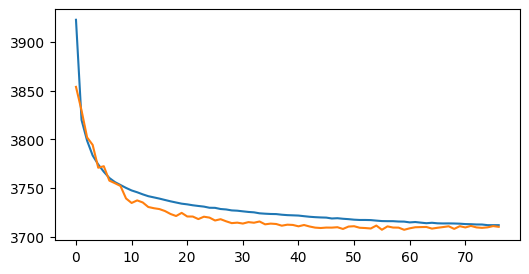

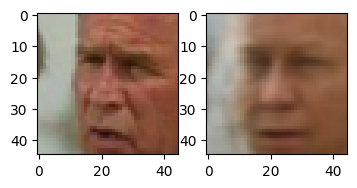

 78%|███████▊  | 78/100 [03:24<00:58,  2.68s/it]

epoch:77, cur train loss: 3711.13926880195, curr test loss: 3707.021193731399


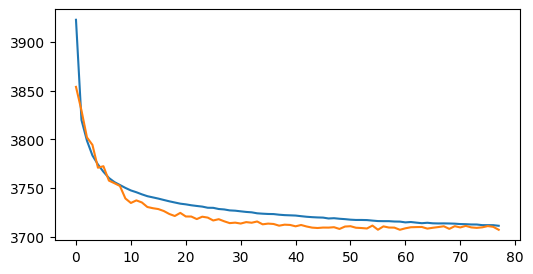

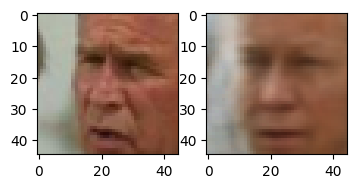

 79%|███████▉  | 79/100 [03:26<00:55,  2.65s/it]

epoch:78, cur train loss: 3711.497690966672, curr test loss: 3711.4367792038693


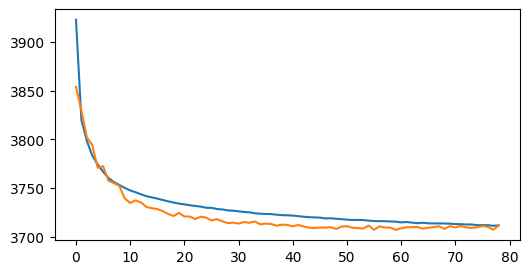

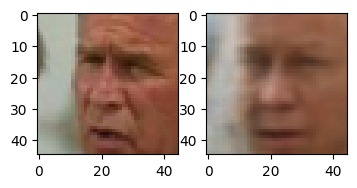

 80%|████████  | 80/100 [03:29<00:52,  2.63s/it]

epoch:79, cur train loss: 3711.2343625119884, curr test loss: 3707.459054129464


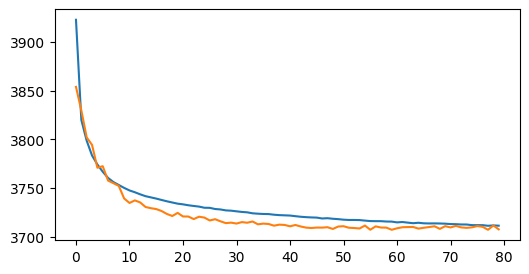

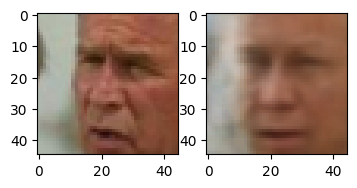

 81%|████████  | 81/100 [03:32<00:49,  2.62s/it]

epoch:80, cur train loss: 3710.270197485414, curr test loss: 3707.8588053385415


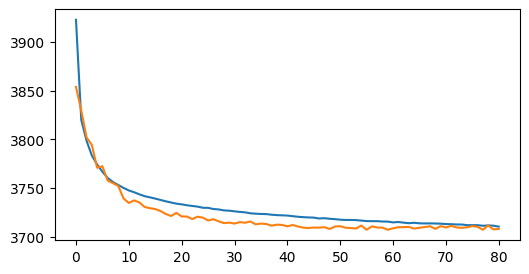

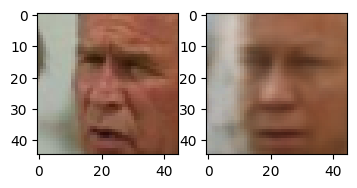

 82%|████████▏ | 82/100 [03:34<00:46,  2.60s/it]

epoch:81, cur train loss: 3710.8251241308344, curr test loss: 3710.392601376488


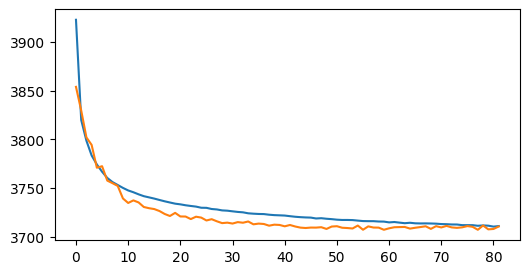

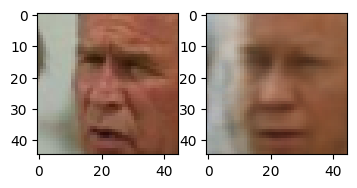

 83%|████████▎ | 83/100 [03:37<00:44,  2.60s/it]

epoch:82, cur train loss: 3710.490254980219, curr test loss: 3709.440011160714


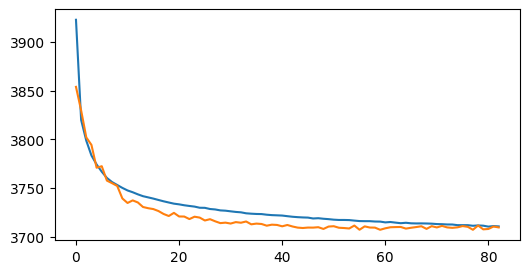

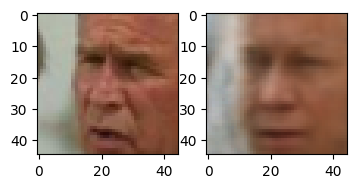

 84%|████████▍ | 84/100 [03:39<00:41,  2.58s/it]

epoch:83, cur train loss: 3709.8938775025977, curr test loss: 3708.3506905691966


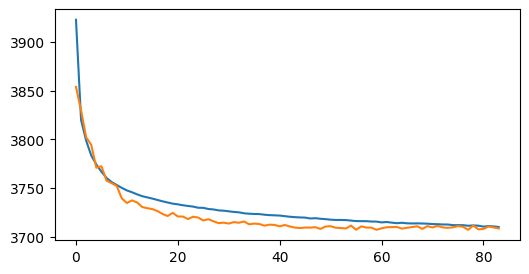

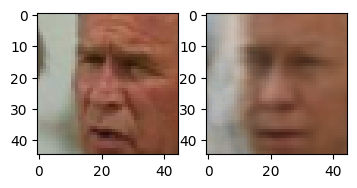

 85%|████████▌ | 85/100 [03:42<00:38,  2.58s/it]

epoch:84, cur train loss: 3709.7053391244403, curr test loss: 3711.265555245536


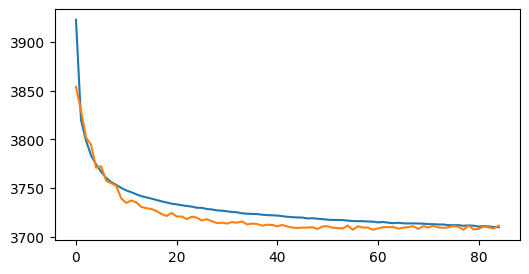

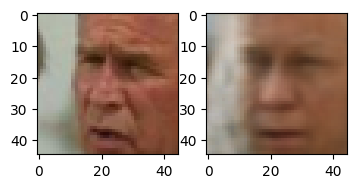

 86%|████████▌ | 86/100 [03:44<00:36,  2.58s/it]

epoch:85, cur train loss: 3709.380585263147, curr test loss: 3712.2561965215773


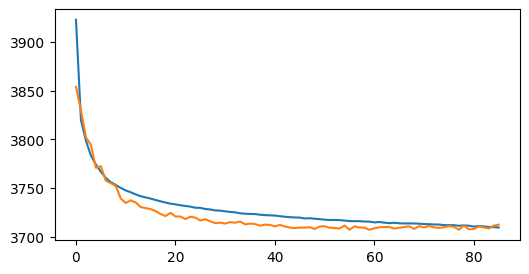

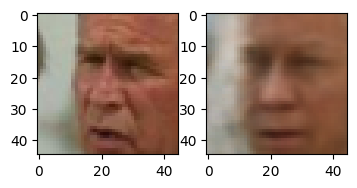

 87%|████████▋ | 87/100 [03:47<00:33,  2.58s/it]

epoch:86, cur train loss: 3709.314202115969, curr test loss: 3710.1009347098216


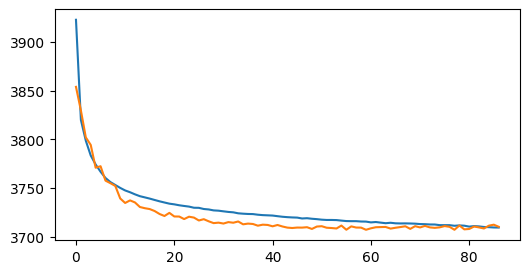

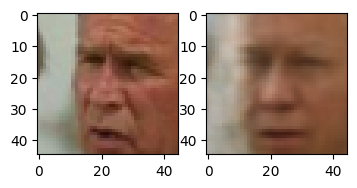

 88%|████████▊ | 88/100 [03:49<00:30,  2.58s/it]

epoch:87, cur train loss: 3709.0704854589594, curr test loss: 3710.5518159412204


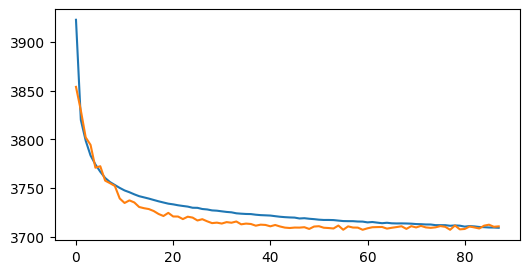

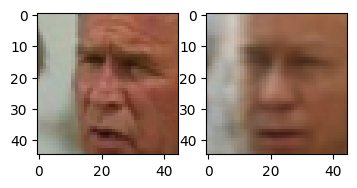

 89%|████████▉ | 89/100 [03:52<00:28,  2.59s/it]

epoch:88, cur train loss: 3709.0489642443254, curr test loss: 3709.6250116257443


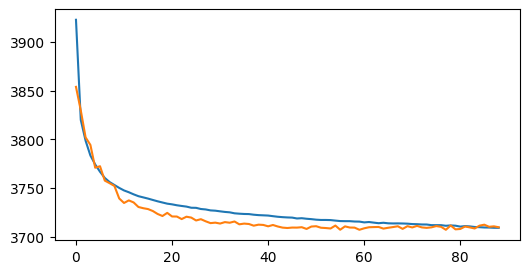

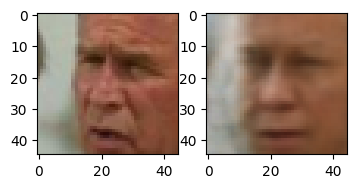

 90%|█████████ | 90/100 [03:55<00:25,  2.59s/it]

epoch:89, cur train loss: 3708.7989392683025, curr test loss: 3709.7206101190477


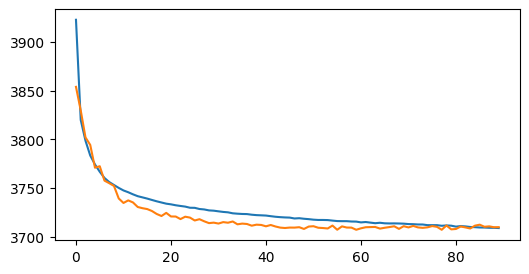

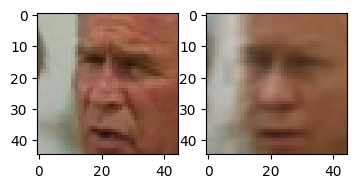

 91%|█████████ | 91/100 [03:57<00:23,  2.59s/it]

epoch:90, cur train loss: 3708.8396433174153, curr test loss: 3710.100632440476


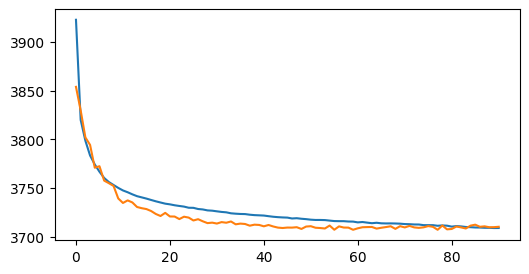

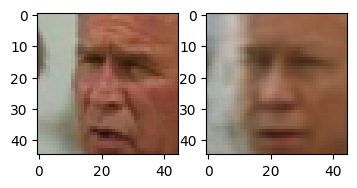

 92%|█████████▏| 92/100 [04:00<00:20,  2.58s/it]

epoch:91, cur train loss: 3708.1339632702607, curr test loss: 3708.110037667411


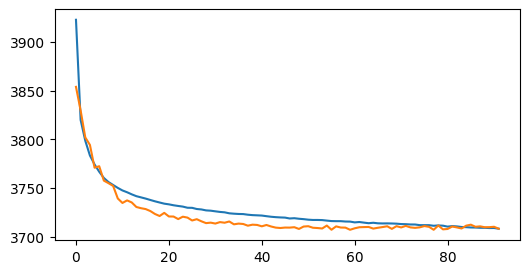

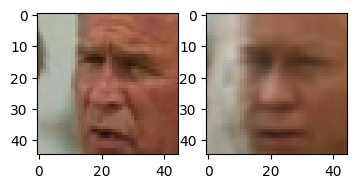

 93%|█████████▎| 93/100 [04:02<00:18,  2.58s/it]

epoch:92, cur train loss: 3708.3363102671437, curr test loss: 3713.4198637462796


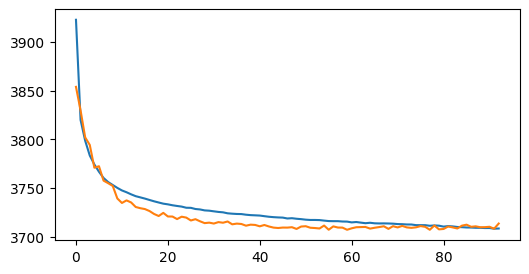

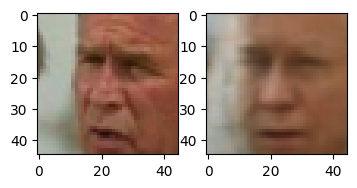

 94%|█████████▍| 94/100 [04:05<00:15,  2.57s/it]

epoch:93, cur train loss: 3708.3127172914, curr test loss: 3710.3423897879466


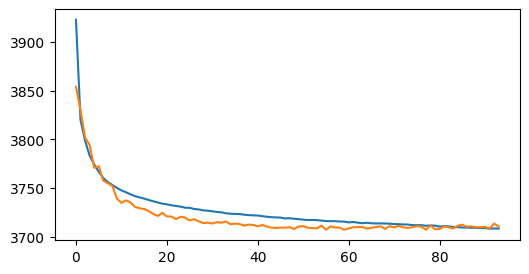

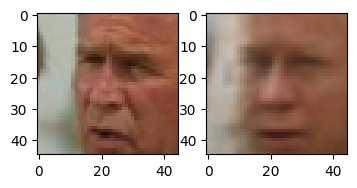

 95%|█████████▌| 95/100 [04:08<00:13,  2.65s/it]

epoch:94, cur train loss: 3707.6700492527175, curr test loss: 3710.782005673363


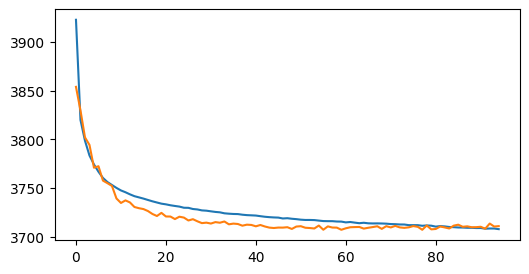

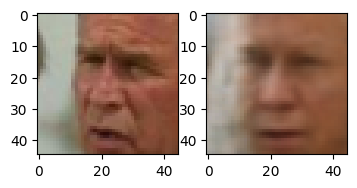

 96%|█████████▌| 96/100 [04:10<00:10,  2.64s/it]

epoch:95, cur train loss: 3707.7291874800194, curr test loss: 3710.429152715774


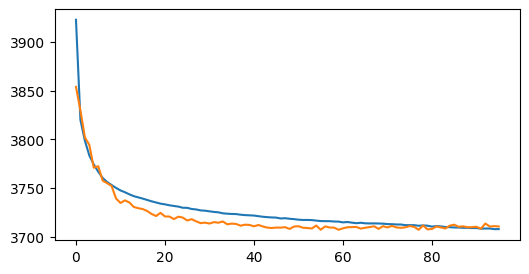

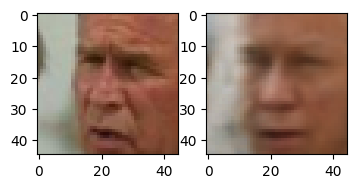

 97%|█████████▋| 97/100 [04:13<00:07,  2.60s/it]

epoch:96, cur train loss: 3707.394035475943, curr test loss: 3710.678536551339


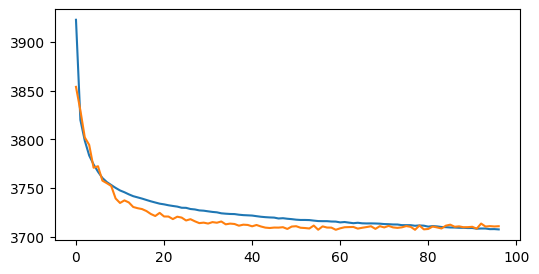

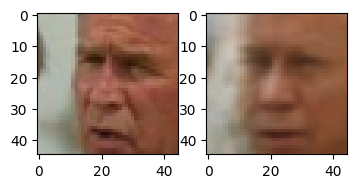

 98%|█████████▊| 98/100 [04:15<00:05,  2.57s/it]

epoch:97, cur train loss: 3707.6213416370283, curr test loss: 3709.5511765252977


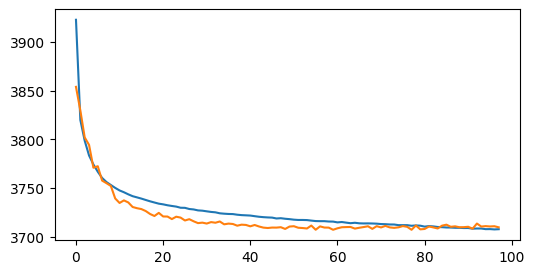

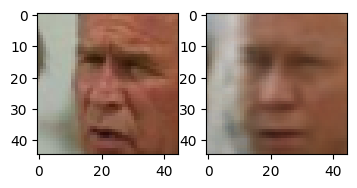

 99%|█████████▉| 99/100 [04:18<00:02,  2.58s/it]

epoch:98, cur train loss: 3707.4142217221465, curr test loss: 3710.1456705729165


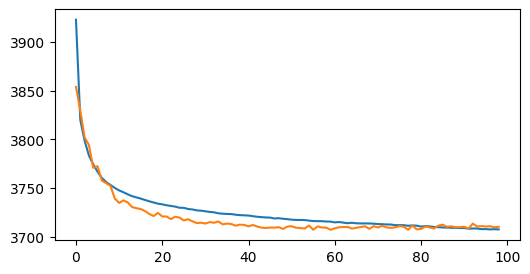

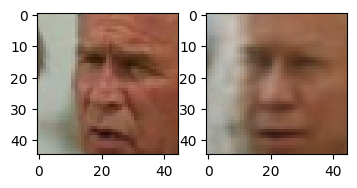

100%|██████████| 100/100 [04:21<00:00,  2.61s/it]

epoch:99, cur train loss: 3706.5840031070175, curr test loss: 3712.1919061569943


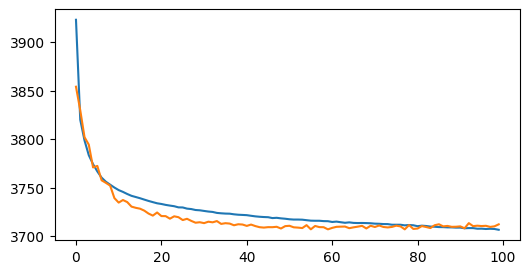

In [180]:
criterion = loss_vae

model = VAE().to(device)

optimizer = optim.Adam(model.parameters(), lr = 3e-4 )
from tqdm import tqdm
epoch = 100
train_loss = []
test_loss = []
val_vis = train_dataset[0][0].unsqueeze(0).to(device)  
for i in tqdm(range(epoch)):
    model.train()
    epoch_loss = {'train': [], 'test': []}
    
    for batch in train_dataloader:
        optimizer.zero_grad()
        batch = batch[0].to(device)

        mu, logsigma, recon = model(batch) 
        loss = criterion(batch, mu, logsigma, recon)

        loss.backward()
        optimizer.step()
        epoch_loss['train'].append(loss.item())
    eplosstr = np.mean(epoch_loss['train'])
    train_loss.append(eplosstr)

    model.eval()
    for batch in test_dataloader:
        with torch.no_grad():
            batch = batch[0].to(device)
            mu, logsigma, recon = model(batch) 
            loss = criterion(batch, mu, logsigma, recon)
            epoch_loss['test'].append(loss.item())
    eplosstest = np.mean(epoch_loss['test'])
    test_loss.append(eplosstest)

    with torch.no_grad():
        _, _, recon_vis = model(val_vis)
        
    fig, axes = plt.subplots(1, 2, figsize=(4,2))
    axes[0].imshow(val_vis[0].cpu().permute(1,2,0).clamp(0,1))
    axes[1].imshow(recon_vis[0].cpu().permute(1,2,0).clamp(0,1))
    plt.show()

    plt.figure(figsize=(6,3))
    plt.plot(train_loss, label='train')
    plt.plot(test_loss, label='val')


    
    print(f'epoch:{i}, cur train loss: {eplosstr}, curr test loss: {eplosstest}')

# качество плохое по сравнению с автоэнкодером, но для данной задачи, думаю, сгодится

In [192]:

model.eval()
train_latent = []
train_images = []   

with torch.no_grad():
    for img in train_dataloader:   
        img = img[0].to(device)
        mu, _ = model.encode(img)     
        train_latent.append(mu.cpu().numpy())
        train_images.append(img.cpu())




In [193]:
train_latent = np.concatenate(train_latent, axis=0)   
train_images = torch.cat(train_images, dim=0)       

In [199]:
from sklearn.neighbors import NearestNeighbors # LSHForest удалили в sklearn

nearest = NearestNeighbors(n_neighbors=5, algorithm='brute') 
nearest.fit(train_latent)

NearestNeighbors(algorithm='brute')

In [210]:
def get_similar(image, n_neighbors=5):
    model.eval()
    
  
    image = image.unsqueeze(0).to(device)

    
    with torch.no_grad():
        mu, _ = model.encode(image)
    code = mu.cpu().numpy()  
    
    distances, indices = nearest.kneighbors(code, n_neighbors=n_neighbors)
    distances = distances[0]
    indices = indices[0]
    
    similar_images = train_images[indices].cpu().numpy()
    return distances, similar_images

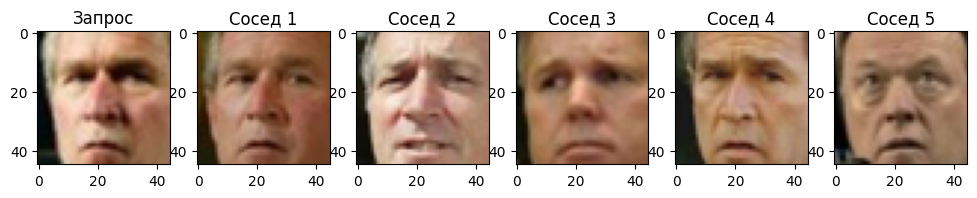

In [213]:
img = X_test_tensor[0]   
distances, similar_faces = get_similar(test_img, n_neighbors=5)

fig, axes = plt.subplots(1, 6, figsize=(12,4))
axes[0].imshow(img.permute(1,2,0).clamp(0,1))
axes[0].set_title('Запрос')
for i in range(5):
    axes[i+1].imshow(torch.tensor(similar_faces[i]).permute(1,2,0).clamp(0,1))
    axes[i+1].set_title(f'Сосед {i+1}')


In [ ]:
#все грустные (